<a target="_blank" href="https://colab.research.google.com/github/cboettig/rl-minicourse/blob/main/challenge.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

#  RL4Salmon Parameter Tests

In this example, we set up a generic three species, two action problem, and illustrate how to provide a custom population dynamics function, action function, and utility function to represent a caribou conservation objective.  

In [ ]:
# we'll need these packages to begin
!pip install stable-baselines3 plotnine polars sb3_contrib tensorboard


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.8/92.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 958.1/958.1 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 44.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 50.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1" # change to -1 if you want to use CPU

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
# pop = seals, lamprey, salmon
# Salmon Scenario
def dynamics(pop, effort, population_parameters, harvest_fn, p, timestep=1):

    pop = harvest_fn(pop, effort)
    X, Y, Z = pop[0], pop[1], pop[2]

    K_x = p["K_x"] + population_parameters[0]
    K_y = p["K_y"] + population_parameters[1]
    K_z = p["K_z"]
    v_x = p["v_x"]
    v_y = p["v_y"]
    h_x = p["h_x"]
    h_y = p["h_y"]
    D = p["D"]

    X += (p["r_x"] * X * (1 - X / K_x )
            - (Z * p["beta"] * (X**2)) / (v_x**2 + h_x * X**2 + h_y * Y**2)
            + p["sigma_x"] * X * np.random.normal()
            )

    Y += (p["r_y"] * Y * (1 - Y  / K_y )
            - (Z * p["beta"] * (Y**2)) / (v_y**2 + h_x * X**2 + h_y * Y**2)
            + p["sigma_y"] * Y * np.random.normal()
            )

    Z += p["alpha"] * p["beta"] * Z * (
            (X**2) / (v_x**2 + h_x * X**2 + h_y * Y**2)
            + (Y**2) / (v_y**2 + h_x * X**2 + h_y * Y**2)
            ) - p["dH"] * Z +  p["sigma_z"] * Z  * np.random.normal()

    pop = np.array([X, Y, Z], dtype=np.float32)
    pop = np.clip(pop, [0,0,0], [np.Inf, np.Inf, np.Inf])
    return(pop)


Here, we change the sigma values to be negligible at 0.001 so that we can better visualize the underlying patterns in our environment. We also change the alpha value (seal growth rate) to be 0.05 to more accurately decrease the large timescale of the seal population.

In [ ]:
initial_pop = [0.5, 0.5, 0.2]


parameters = {
"r_x": np.float32(0.13),
"r_y": np.float32(0.2),
"r_z": np.float32(0.05),
"K_x": np.float32(0.5),
"K_y": np.float32(0.5),
"K_z": np.float32(1),
"h_x": np.float32(0.5),
"h_y": np.float32(0.5),
"v_x": np.float32(0.5),
"v_y": np.float32(0.5),
"beta": np.float32(.1),
"v0":  np.float32(0.1),
"D": np.float32(0.5),
"tau_yx": 0,
"tau_xy": 0,
"alpha": np.float32(.4),
"dH": np.float32(0.001),
"sigma_x": np.float32(0.001),
"sigma_y": np.float32(0.001),
"sigma_z": np.float32(0.001)
}


We must also define the dynamics of the action, a 'harvest' or culling function.  In this scenario, we imagine that we can cull either the salmon or pinniped population (or both).  We assume our control action introduces a percent mortality equal to the control effort applied times a catachability coefficient:

In [ ]:
def harvest(pop, effort):
    q0 = 0.5 # catchability coefficients -- erradication is impossible
    q2 = 0.5
    pop[0] = pop[0] * (1 - effort[0] * q0) # pop 0, seals
    pop[2] = pop[2] * (1 - effort[1] * q2) # pop 2, salmon
    return pop


Lastly, we need to define the utility or reward derived from taking these actions under this population state.  In this scenario, our population control actions are costly, while we acrue a benefit proportional to the size of the current salmon population:

In [ ]:
def utility(pop, effort):
    benefits = 0.5 * pop[1] # benefit from Salmon
    costs = .00001 * (effort[0] + effort[1]) # cost to culling
    if np.any(pop <= 0.01):
        benefits -= 1
    return benefits - costs




To simulate our environment and allow RL algorithms to train on this environment, we define a simple python class using the gym module.  This class defines the possible action space as two continuously-valued action variables (culling effort of salmon and pinnipeds respectively), and three continuously valued state variables (population of salmon, lamprey and pinnipeds).  To improve performance of RL training, it is necessary to transform the continuous space to -1, 1

In [ ]:
import gymnasium as gym

class s3a2(gym.Env):
    """A 3-species ecosystem model with two control actions"""
    def __init__(self, config=None):
        config = config or {}

        ## these parameters may be specified in config
        self.Tmax = config.get("Tmax", 10000)
        self.threshold = config.get("threshold", np.float32(1e-4))
        self.init_sigma = config.get("init_sigma", np.float32(1e-3))
        self.training = config.get("training", True)
        self.initial_pop = config.get("initial_pop", initial_pop)
        self.parameters = config.get("parameters", parameters)
        self.dynamics = config.get("dynamics", dynamics)
        self.harvest = config.get("harvest", harvest)
        self.utility = config.get("utility", utility)
        self.observe = config.get("observe", lambda state: state) # default to perfectly observed case
        self.bound = 2 * self.parameters["K_x"]

        self.action_space = gym.spaces.Box(
            np.array([-1, -1, 0, 0], dtype=np.float32),
            np.array([1, 1, 0.1, 0.1], dtype=np.float32),
            dtype = np.float32
        )
        self.observation_space = gym.spaces.Box(
            np.array([-1, -1, -1], dtype=np.float32),
            np.array([1, 1, 1], dtype=np.float32),
            dtype=np.float32,
        )
        self.reset(seed=config.get("seed", None))


    def reset(self, *, seed=None, options=None):
        self.timestep = 0
        self.initial_pop += np.multiply(self.initial_pop, np.float32(self.init_sigma * np.random.normal(size=3)))
        self.state = self.state_units(self.initial_pop)
        info = {}
        return self.observe(self.state), info


    def step(self, action):
        action = np.clip(action, self.action_space.low, self.action_space.high)
        pop = self.population_units(self.state) # current state in natural units
        human_actions = action[:2]
        pop_params = action[2:]
        effort = (human_actions + 1.) / 2

        # harvest and recruitment
        reward = self.utility(pop, effort)
        nextpop = self.dynamics(pop, effort, pop_params, self.harvest, self.parameters, self.timestep)

        self.timestep += 1
        terminated = bool(self.timestep > self.Tmax)

        # in training mode only: punish for population collapse
        if any(pop <= self.threshold) and self.training:
            terminated = True
            reward -= 50/self.timestep

        self.state = self.state_units(nextpop) # transform into [-1, 1] space
        observation = self.observe(self.state) # same as self.state
        return observation, reward, terminated, False, {}

    def state_units(self, pop):
        self.state = 2 * pop / self.bound - 1
        self.state = np.clip(self.state,
                             np.repeat(-1, self.state.__len__()),
                             np.repeat(1, self.state.__len__()))
        return np.float32(self.state)

    def population_units(self, state):
        pop = (state + 1) * self.bound /2
        return np.clip(pop,
                       np.repeat(0, pop.__len__()),
                       np.repeat(np.Inf, pop.__len__()))

# verify that the environment is defined correctly
from stable_baselines3.common.env_checker import check_env
env = s3a2()
check_env(env, warn=True)


Here, we create a function to run a simulation of an episode by inputting an action, plotting the graph of the population proportions over time, and printing the population summary statistics including end population, mean, max, min, variance, and standard deviation. We also create a function to plot a phase plane of an episode which better visualizes the end behavior through limit cycles which are highlighted in yellow on the plot as yellow represents the end of the episode.

In [ ]:
from scipy.optimize import minimize
import polars as pl
from plotnine import ggplot, aes, geom_line, geom_path, labs

def get_last(col):
  return col.iloc[-1]

def get_func_pop(df, func):
  pd_df = df.to_pandas()
  func_pops = pd_df[["X", "Y", "Z"]].apply(func, axis=0)
  return func_pops

def obtain_simulated_data(action, timesteps=env.Tmax, env=env):
  df = []
  episode_reward = 0
  observation, _ = env.reset()
  for t in range(timesteps):
    obs = env.population_units(observation) # natural units
    df.append([t, episode_reward, *obs])
    observation, reward, terminated, done, info = env.step(action)
    episode_reward += reward

  df = pl.DataFrame(df, schema=["t", "reward", "X", "Y", "Z"])
  return df

def plot_simulation(df):
  cols = ["t", "reward", "X", "Y", "Z"]

  dfl = (pl.DataFrame(df, schema=cols).
          select(["t", "X", "Y", "Z"]).
          melt("t")
        )
  p = ggplot(dfl, aes("t", "value", color="variable")) + geom_path() + labs(title = "Environment Change Simulation")
  display(p)

def plot_phase_plane(df, X = "X", Y = "Y"):
  cols = ["t", "reward", "X", "Y", "Z"]

  dfl = (pl.DataFrame(df, schema=cols).
          select(["t", "X", "Y", "Z"])
        )
  p = ggplot(dfl, aes(X, Y, color="t")) + geom_path() + labs(title = "Environment Phase Plane Plot")
  display(p)


def run_simulation(action, timesteps=env.Tmax, env=env, focus=("X", "Y"), plot_funcs=(True, True)):
  df = obtain_simulated_data(action, timesteps, env)
  plot_simulation(df) if plot_funcs[0] else None
  X, Y = focus
  plot_phase_plane(df, X, Y) if plot_funcs[1] else None
  func_list = [get_last, np.mean, np.max, np.min, np.var, np.std]
  for func in func_list:
    display_final_pop(df, func)

def display_final_pop(df, func):
  info_dict = {get_last: "Final Population", np.mean: "Mean Population", np.max: "Max Population",
               np.min: "Min Population", np.var: "Population Variance", np.std: "Population SD"}
  func_pops = get_func_pop(df, func)
  func_suffix = info_dict[func]

  salmon_str = f"Salmon {func_suffix}: {func_pops[0]:.2f}"
  lamprey_str = f"Lamprey {func_suffix}: {func_pops[1]:.2f}"
  pinniped_str = f"Pinniped {func_suffix}: {func_pops[2]:.2f}"
  print(salmon_str + "\n" + lamprey_str + "\n" + pinniped_str + "\n")

zero_action = [-1, -1, 0, 0]

Now, we wish to test the zero action but on environments with different carrying capacity parameters and different growth rate parameters. We create a function to accomplish this task. We also want to consider the case with the higher non-changed alpha of 0.4 to better visualize the limit cycles, so that is added as a separate parameter. We use a default of 3200 timesteps and plot carrying capacities from 0.5 to 1.5 with increments of 0.2, and plot growth rates from the original rate up to 0.5 plus the original rate, with increments of 0.1.

The reason for the large increments is because we wish to vary two parameters at a time, and thus it is necessary to create n^2 plots if we have n different possible parameter changes. To ensure we don't output a super large number of plots like 50 or more, we limit the increments to n = 5 so 25 plots are created. Although this is still quite a large number of plots, there must be a compromise made between avoiding mass cluttering but also desiring to capture as much information as possible.

In [ ]:
def simulate_param_changes(timesteps, increment_range, param_choice, high_alpha=False, plot_funcs=(True, True), focus=("X", "Y")):
  display_dict = {"x": "Salmon", "y": "Lamprey", "z": "Pinniped", "K": "Carrying Capacity", "r": "Population Increase Rate", "h": "Handling Time", "v": "Velocity"}
  p1, p2 = (param_choice + "_x", param_choice + "_y")
  curr_alpha = 0.4 if high_alpha else 0.05
  desc_1, desc_2 = (display_dict[p1[-1]] + " " + display_dict[p1[0]], display_dict[p2[-1]] + " " + display_dict[p2[0]])
  for i1 in increment_range:
    for i2 in increment_range:
      curr_parameters = parameters.copy()
      curr_parameters[p1] += i1
      curr_parameters[p2] += i2
      curr_parameters["alpha"] = curr_alpha
      curr_env = s3a2(config={"parameters": curr_parameters})
      print(f"{desc_1}: {curr_parameters[p1]}, {desc_2}: {curr_parameters[p2]}")
      run_simulation(zero_action, timesteps, curr_env, plot_funcs=plot_funcs, focus=focus)
      print("\n")

def simulate_single_param_change(timesteps, increment_range, param_choice, high_alpha=False, plot_funcs=(True, True), focus=("X", "Y")):
    display_dict = {"h_x": "Salmon Handling Rate", "h_y": "Lamprey Handling Rate", "v_x": "Salmon Velocity", "v_y": "Lamprey Velocity", "beta": "Beta"}
    curr_alpha = 0.4 if high_alpha else 0.05
    for i1 in increment_range:
      curr_parameters = parameters.copy()
      curr_parameters[param_choice] += i1
      curr_parameters["alpha"] = curr_alpha
      curr_env = s3a2(config={"parameters": curr_parameters})
      print(f"{display_dict[param_choice]}: {curr_parameters[param_choice]}")
      run_simulation(zero_action, timesteps, curr_env, plot_funcs=plot_funcs, focus=focus)
      print("\n")

K_increment_range = np.arange(-0.5, 0.51, 0.2)
r_increment_range = np.arange(0, 0.51, 0.1)
hv_increment_range = np.arange(-0.49, 0.51, 0.25)
beta_range = np.arange(-0.09, 0.01, 0.01)
blank_range = np.arange(0, 0)
n_timesteps = 3200

Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


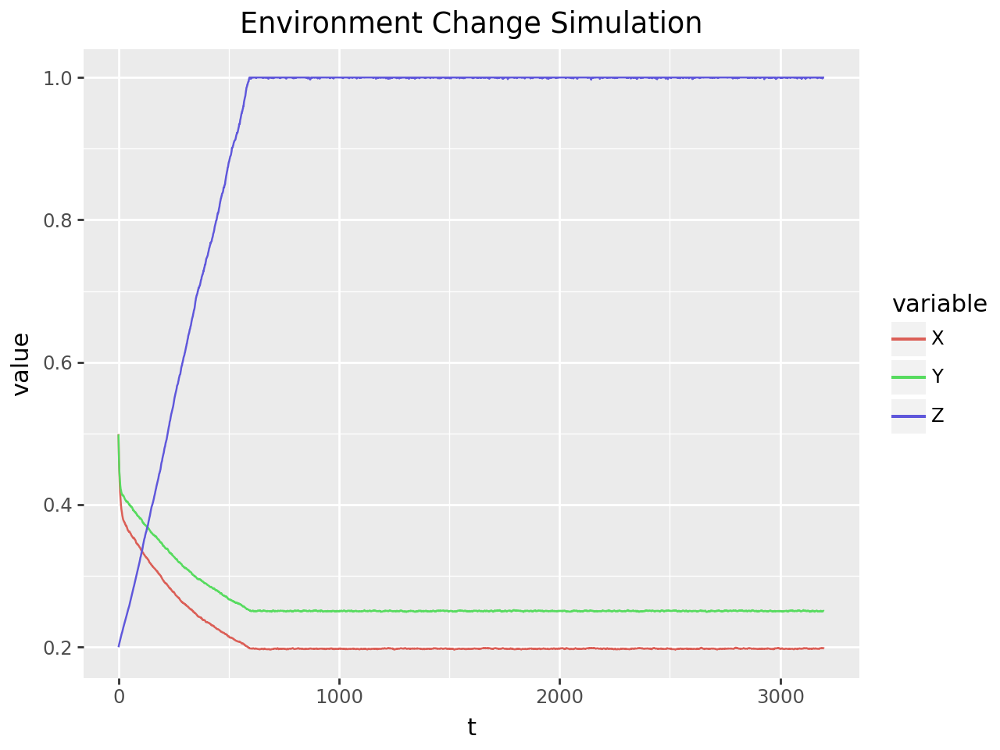

Salmon Final Population: 0.20
Lamprey Final Population: 0.25
Pinniped Final Population: 1.00

Salmon Mean Population: 0.21
Lamprey Mean Population: 0.26
Pinniped Mean Population: 0.93

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


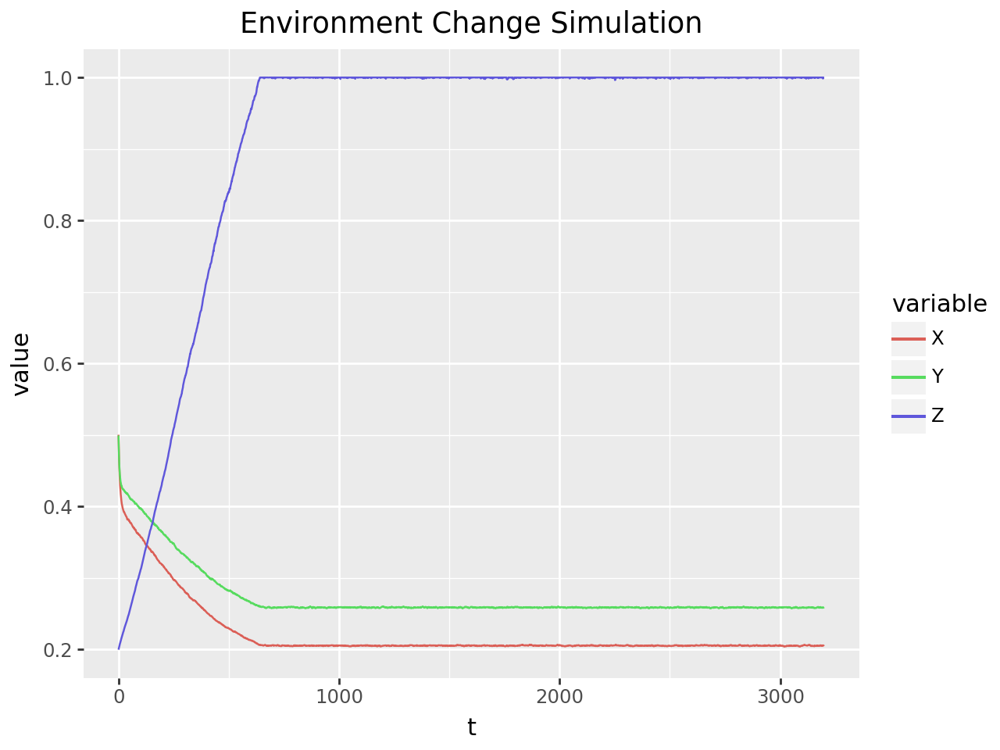

Salmon Final Population: 0.20
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


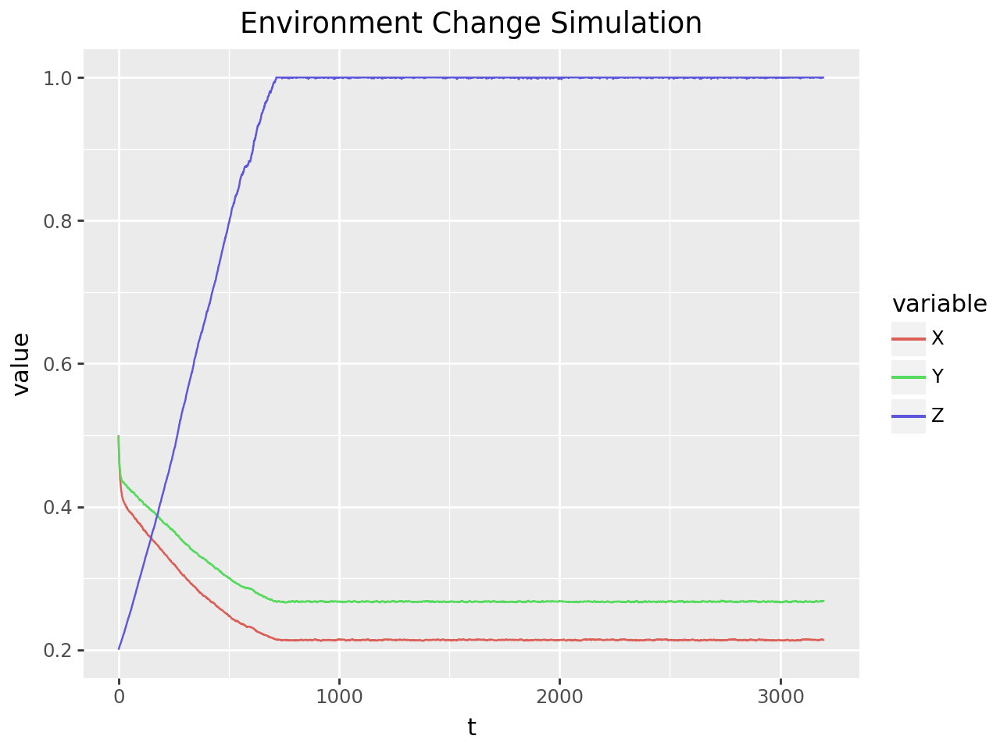

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


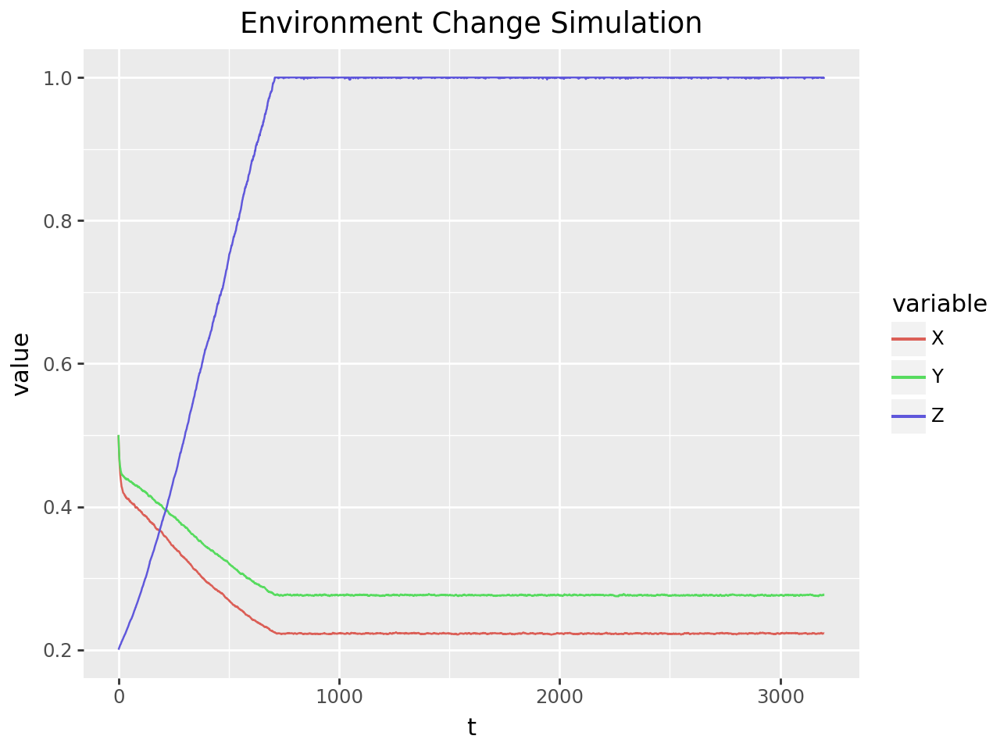

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


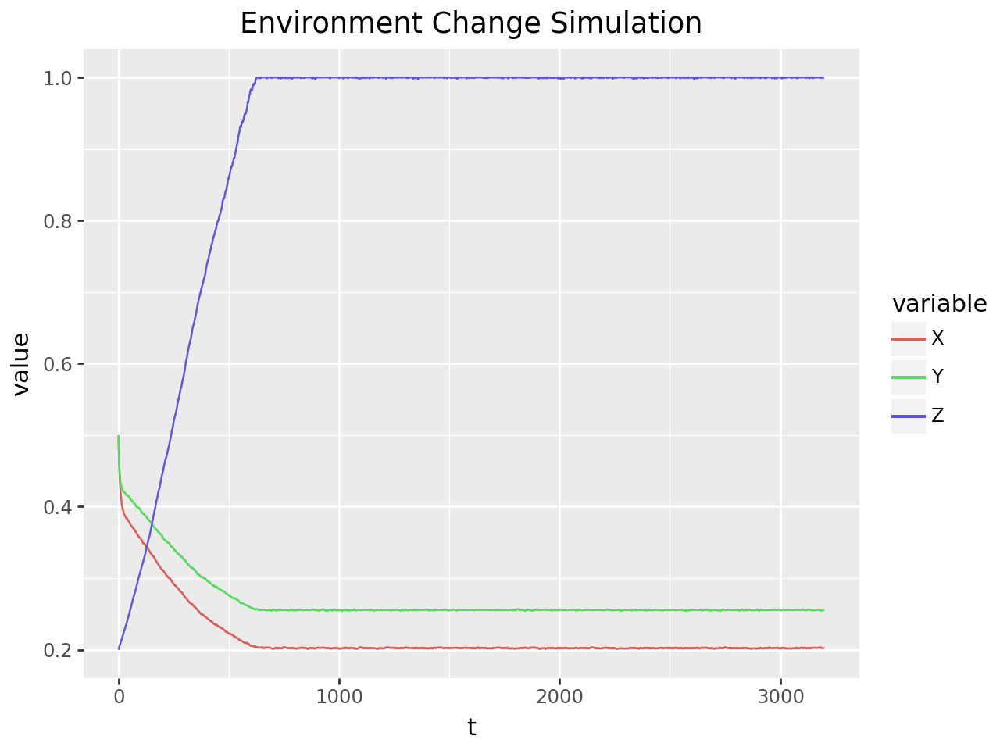

Salmon Final Population: 0.20
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


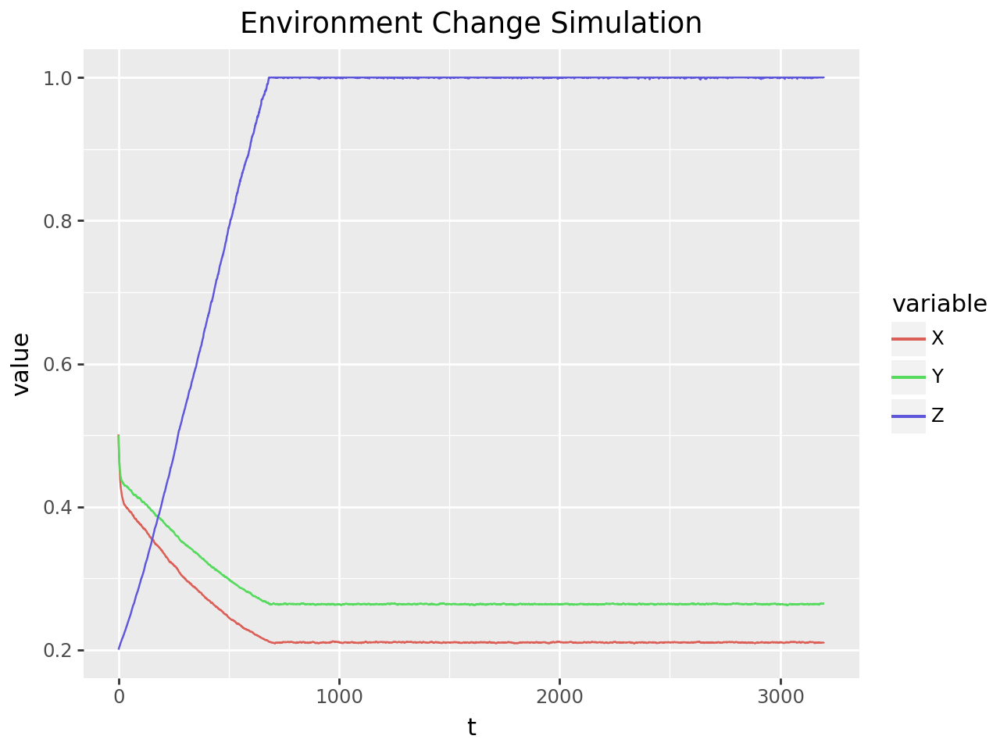

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


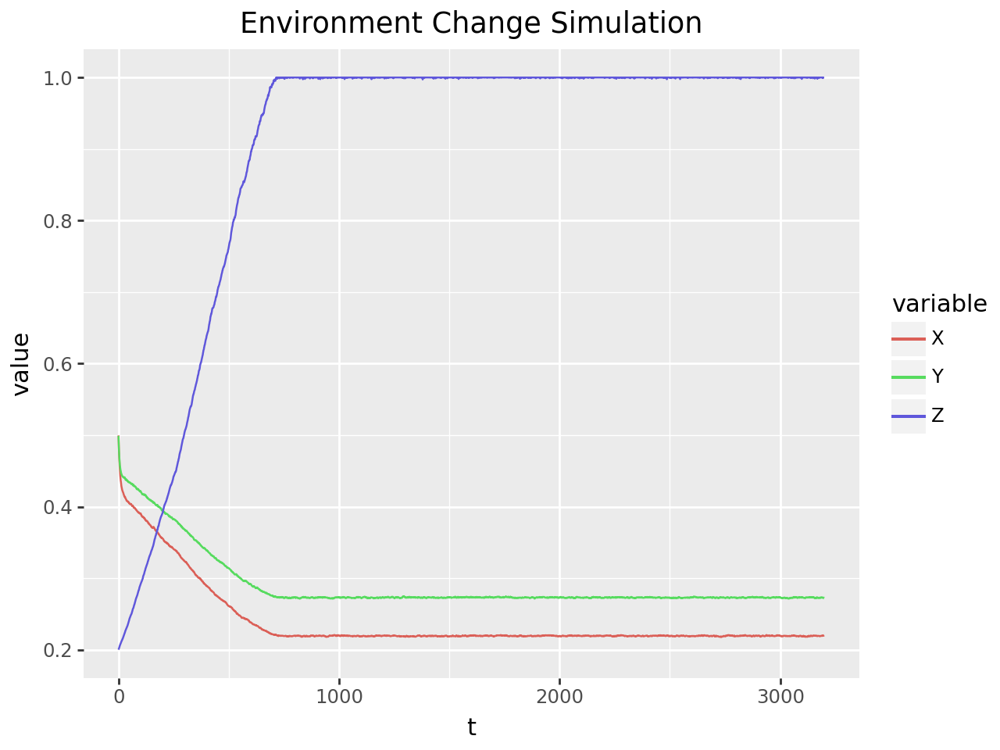

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


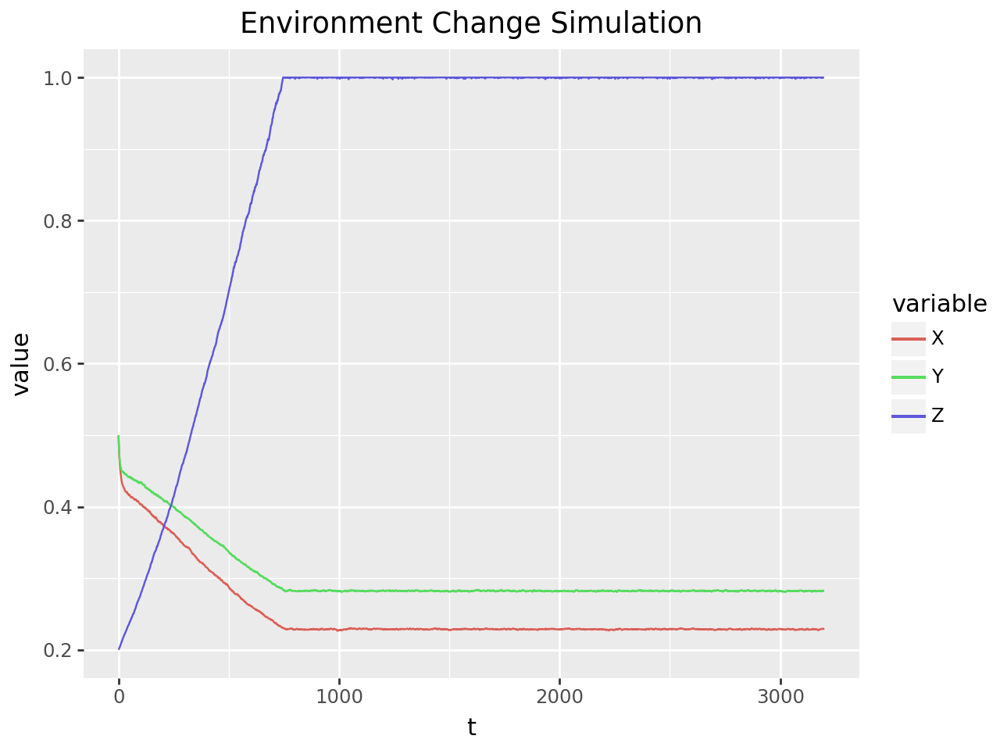

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.22



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


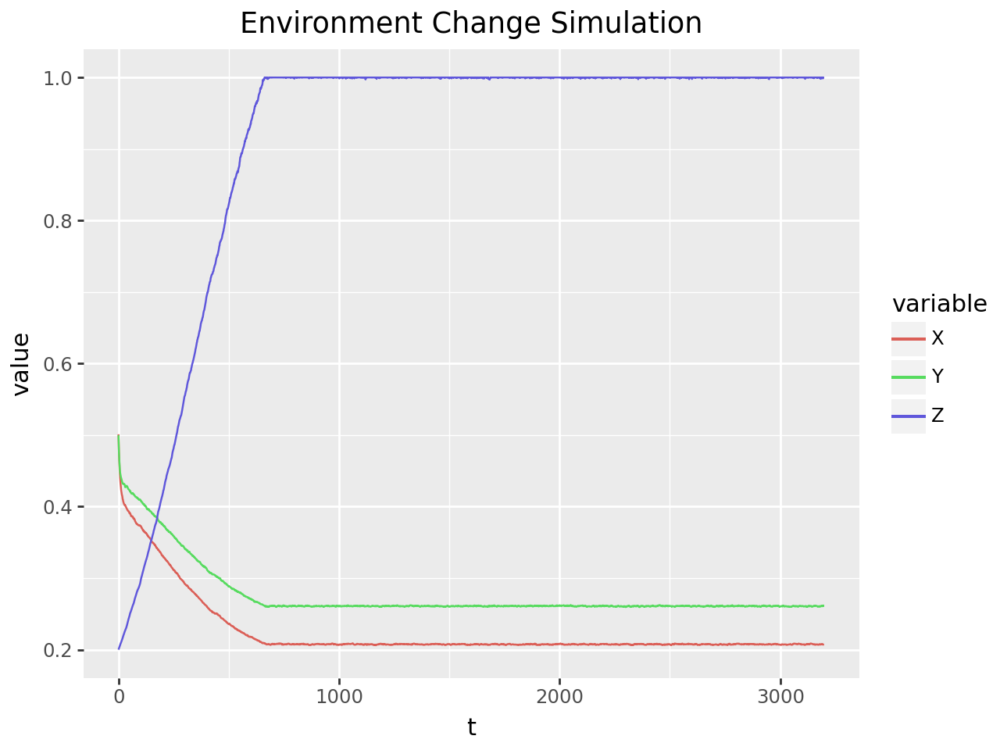

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


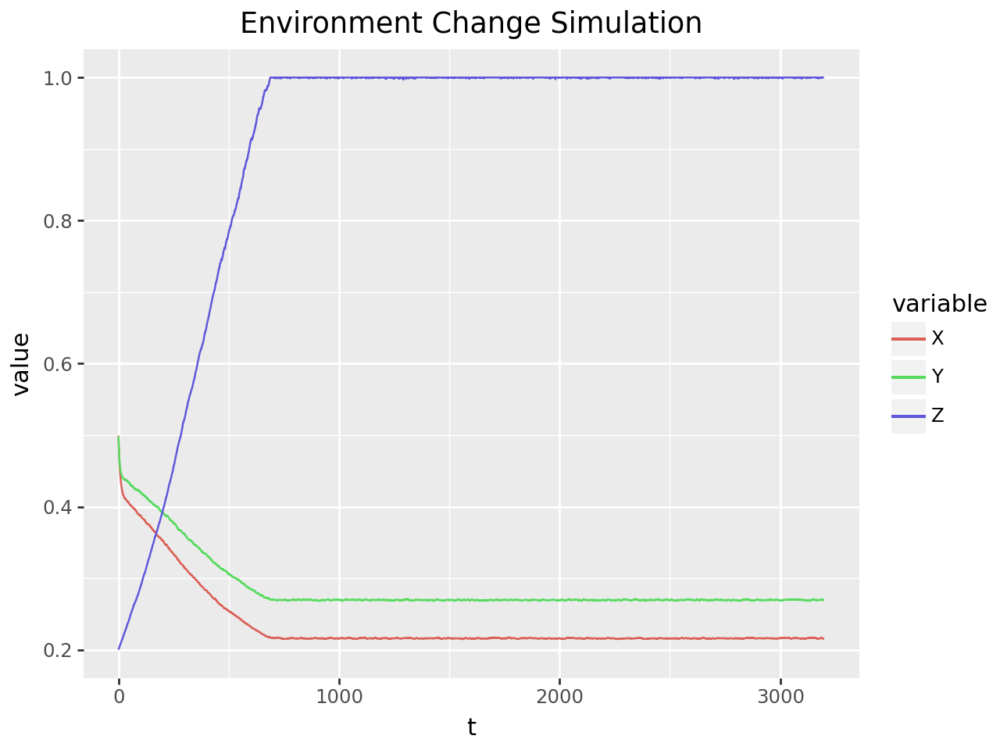

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


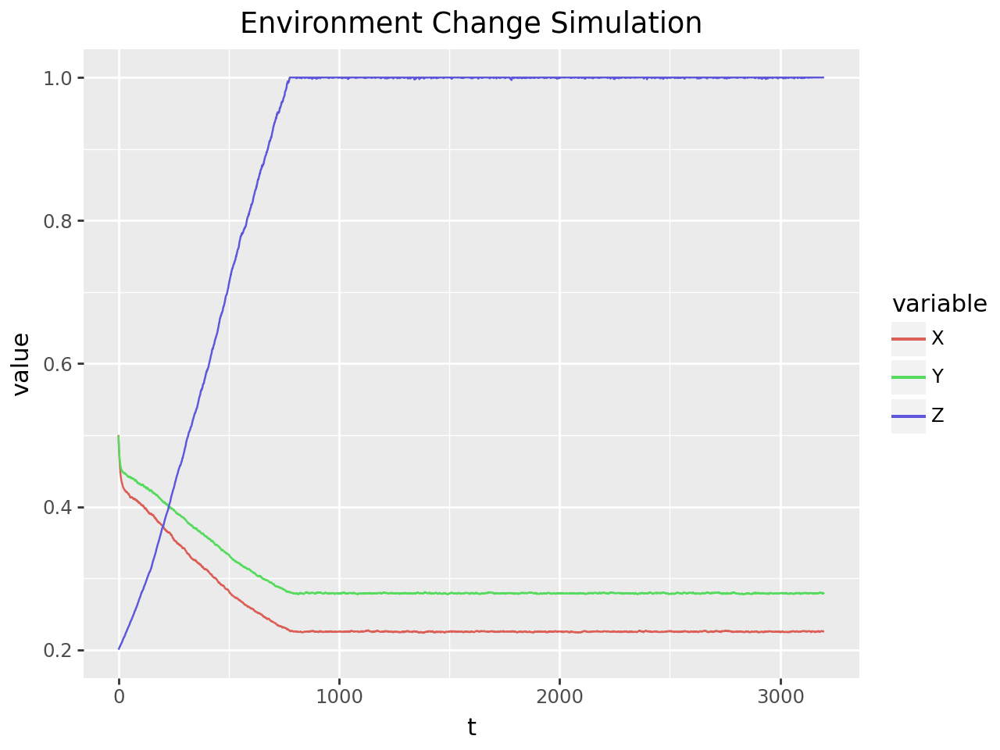

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


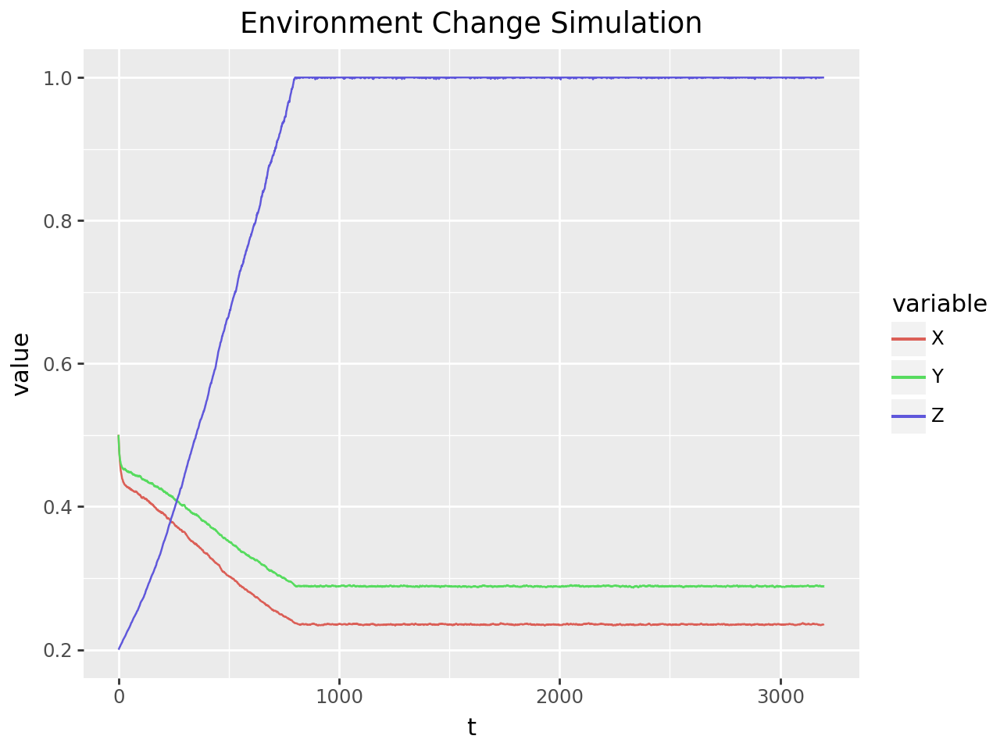

Salmon Final Population: 0.24
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


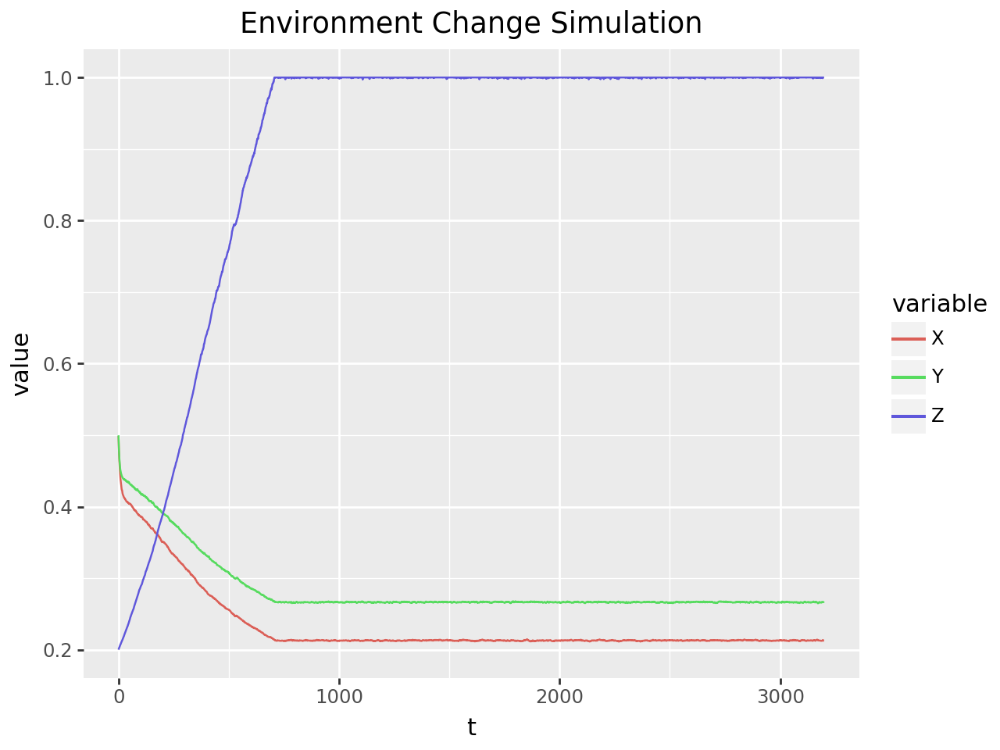

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


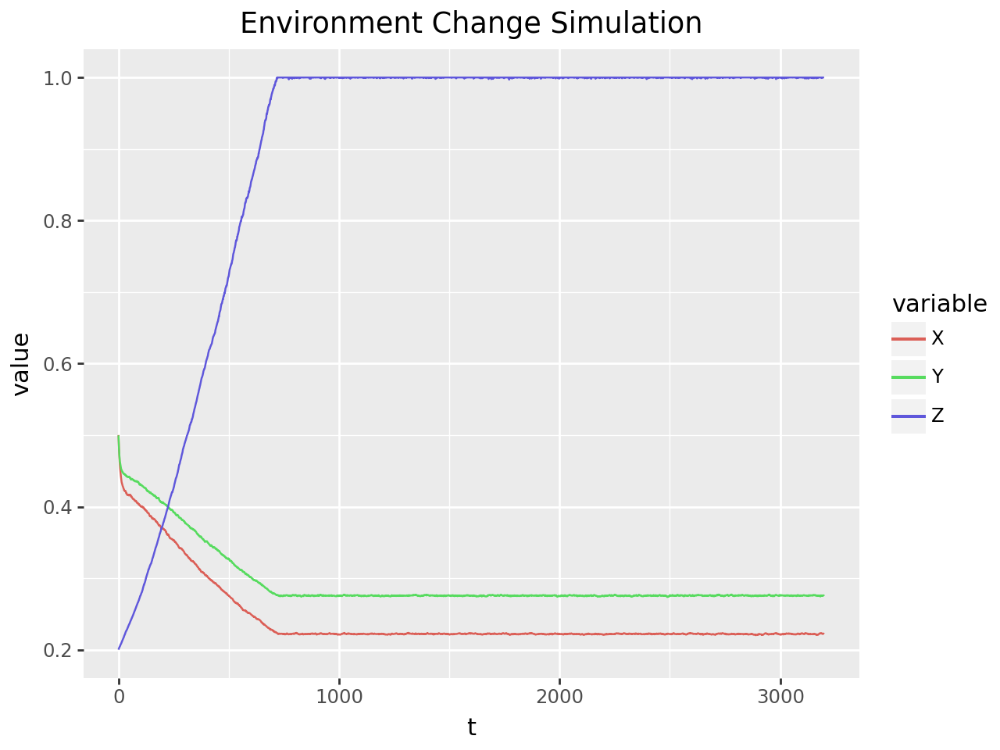

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


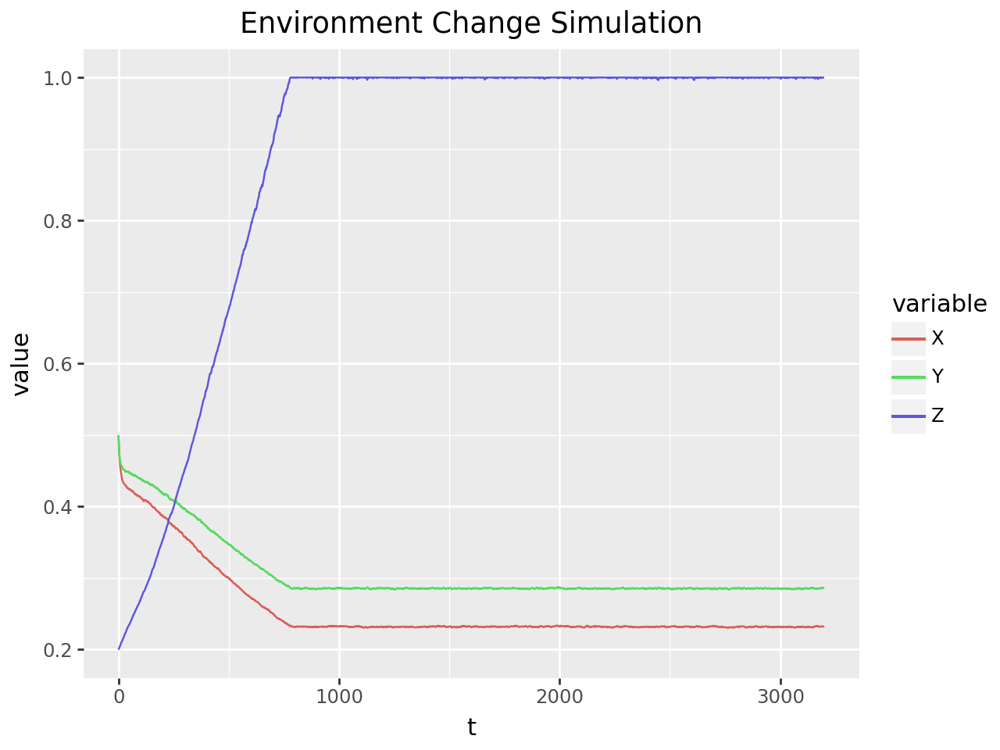

Salmon Final Population: 0.23
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


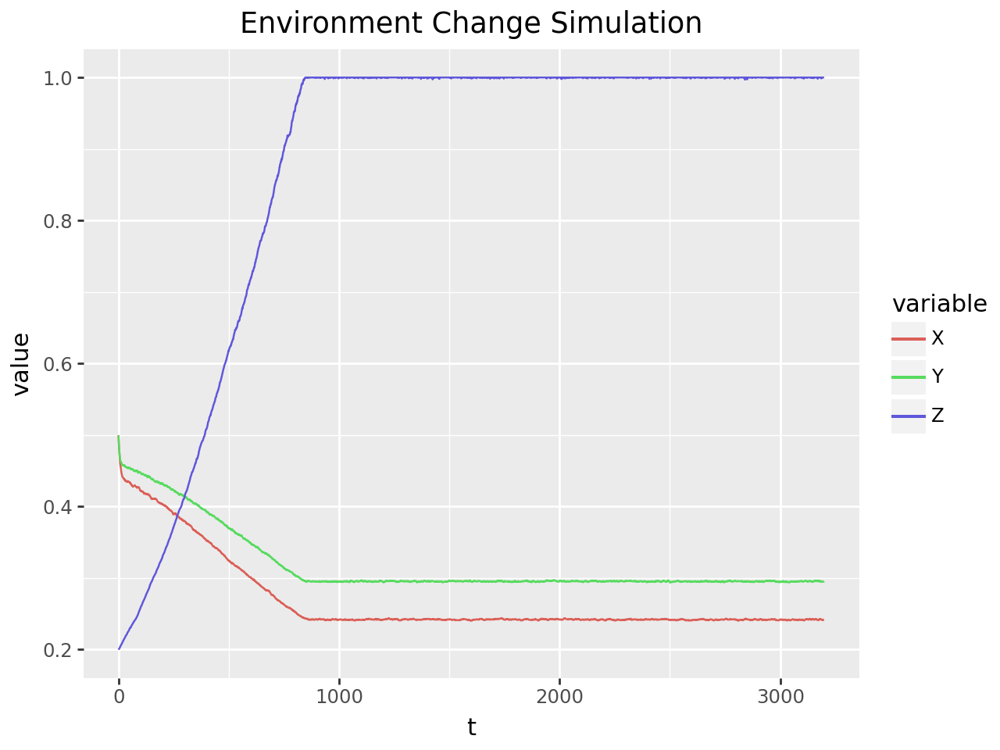

Salmon Final Population: 0.24
Lamprey Final Population: 0.30
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.32
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.24
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.06
Lamprey Population SD: 0.05
Pinniped Population SD: 0.23





In [ ]:
simulate_param_changes(n_timesteps, hv_increment_range, "h", plot_funcs=(True, False))

Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


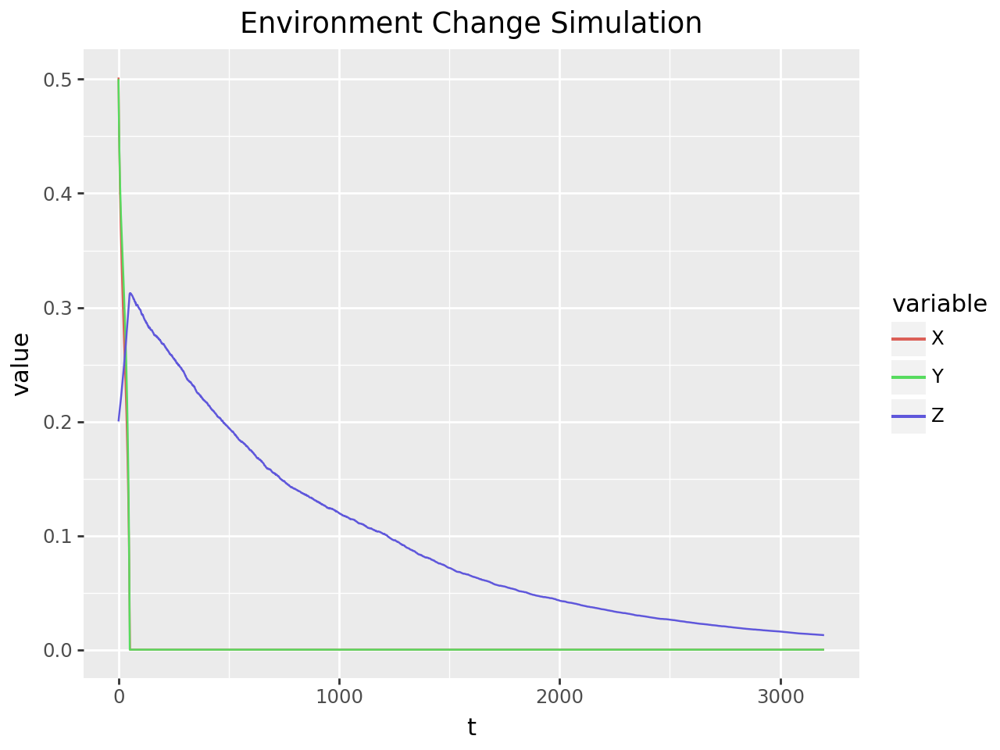

Salmon Final Population: 0.00
Lamprey Final Population: 0.00
Pinniped Final Population: 0.01

Salmon Mean Population: 0.00
Lamprey Mean Population: 0.00
Pinniped Mean Population: 0.10

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.31

Salmon Min Population: 0.00
Lamprey Min Population: 0.00
Pinniped Min Population: 0.01

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.01

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.08



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


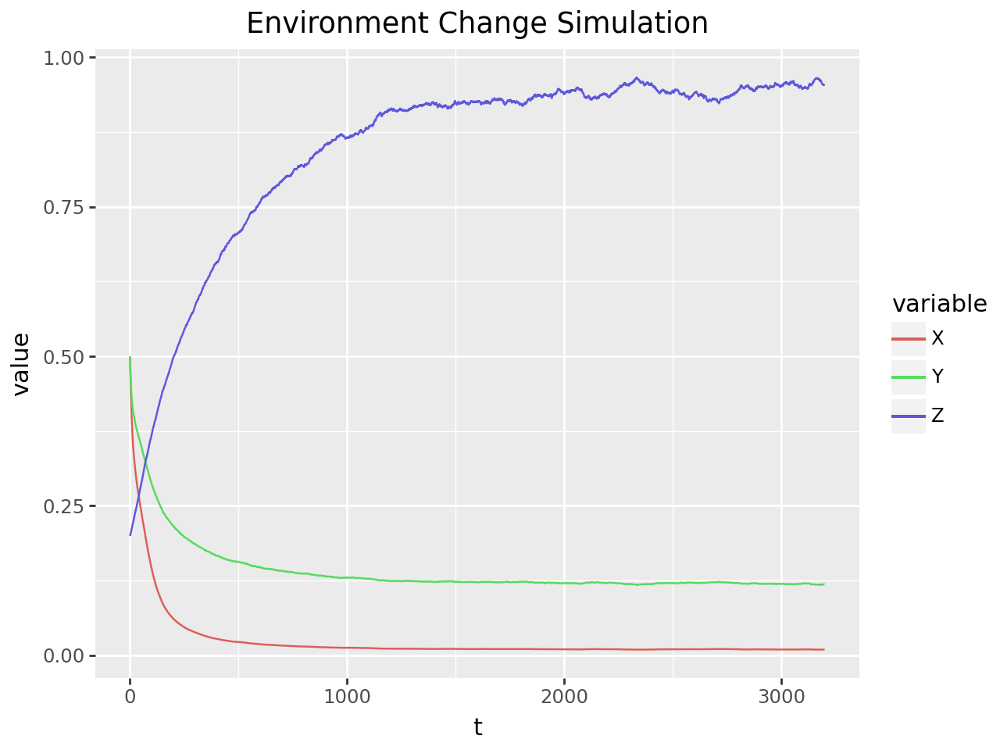

Salmon Final Population: 0.01
Lamprey Final Population: 0.12
Pinniped Final Population: 0.95

Salmon Mean Population: 0.02
Lamprey Mean Population: 0.14
Pinniped Mean Population: 0.85

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.97

Salmon Min Population: 0.01
Lamprey Min Population: 0.12
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.16



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


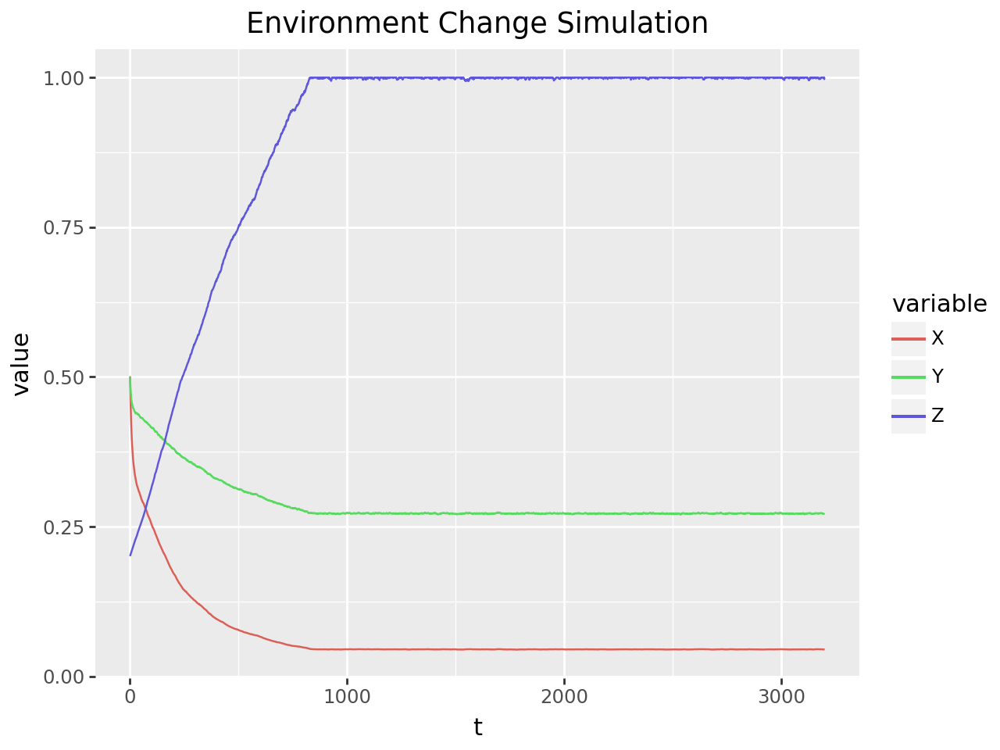

Salmon Final Population: 0.04
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.07
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.04
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


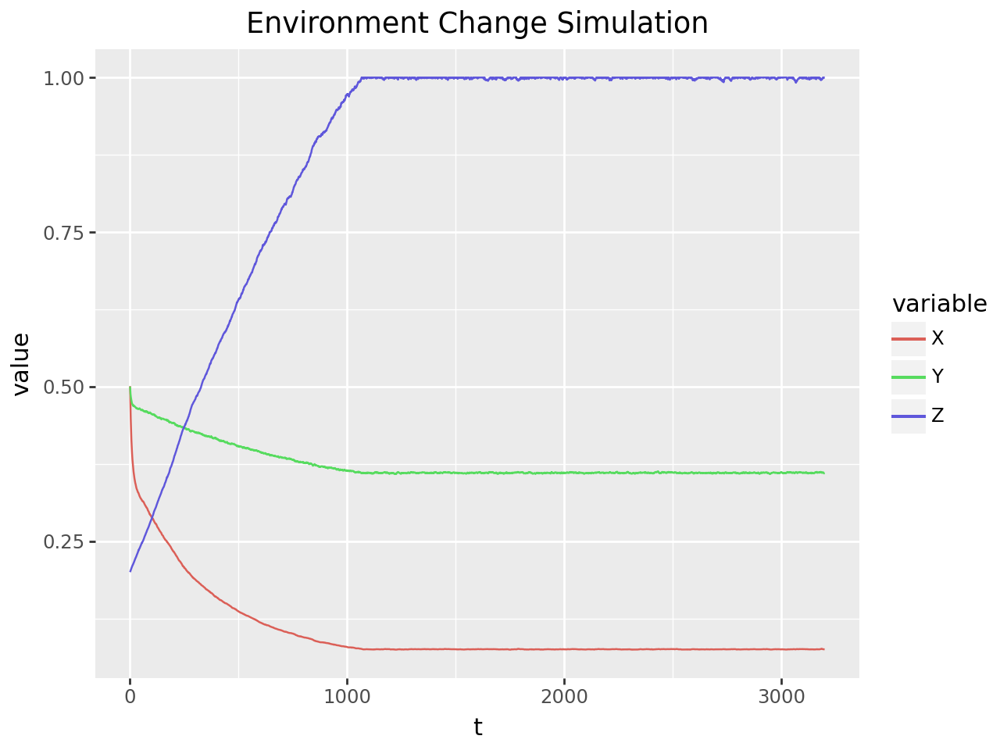

Salmon Final Population: 0.08
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.10
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.07
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.06
Lamprey Population SD: 0.03
Pinniped Population SD: 0.22



Salmon Velocity: 0.26, Lamprey Velocity: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


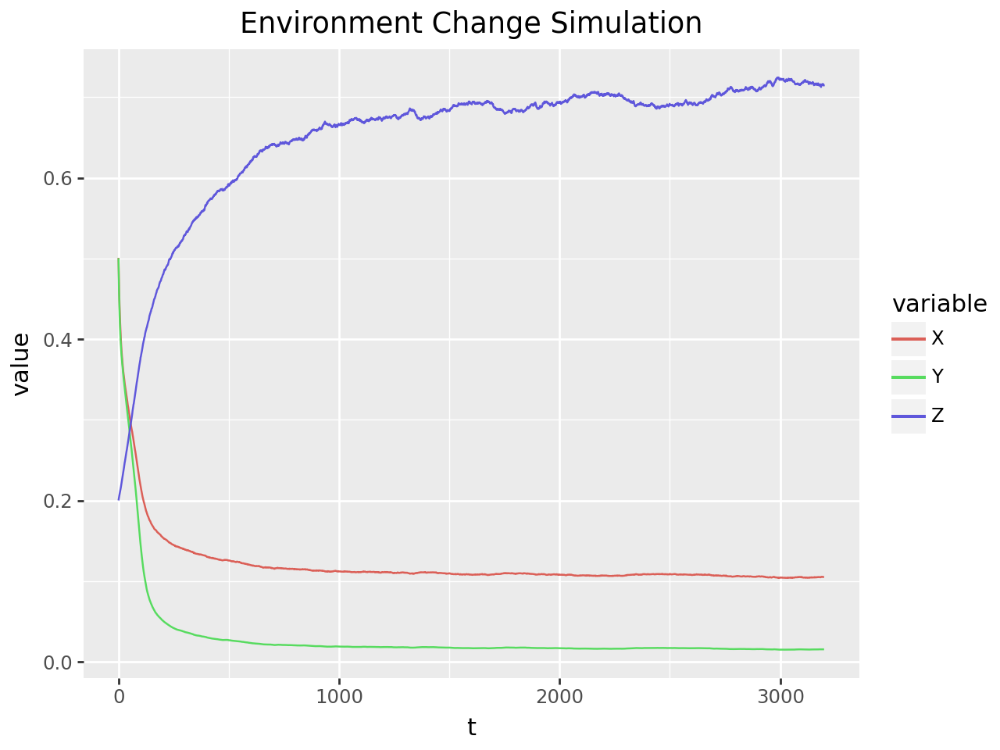

Salmon Final Population: 0.11
Lamprey Final Population: 0.02
Pinniped Final Population: 0.71

Salmon Mean Population: 0.12
Lamprey Mean Population: 0.03
Pinniped Mean Population: 0.65

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.72

Salmon Min Population: 0.10
Lamprey Min Population: 0.02
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.01

Salmon Population SD: 0.04
Lamprey Population SD: 0.05
Pinniped Population SD: 0.09



Salmon Velocity: 0.26, Lamprey Velocity: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


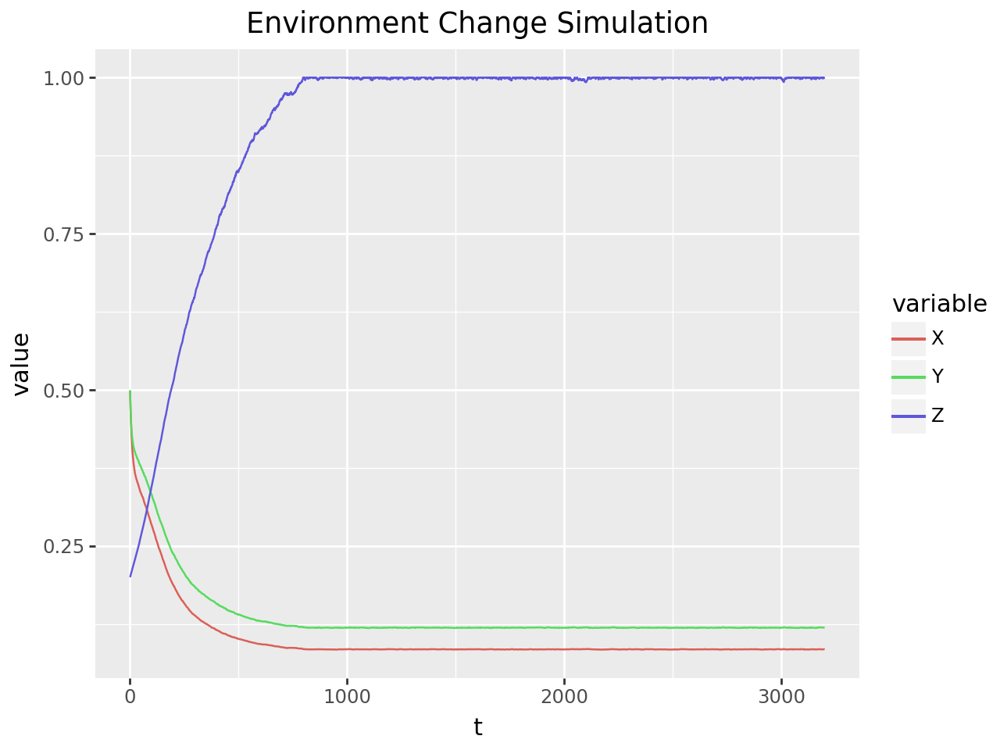

Salmon Final Population: 0.08
Lamprey Final Population: 0.12
Pinniped Final Population: 1.00

Salmon Mean Population: 0.10
Lamprey Mean Population: 0.14
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.08
Lamprey Min Population: 0.12
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.18



Salmon Velocity: 0.26, Lamprey Velocity: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


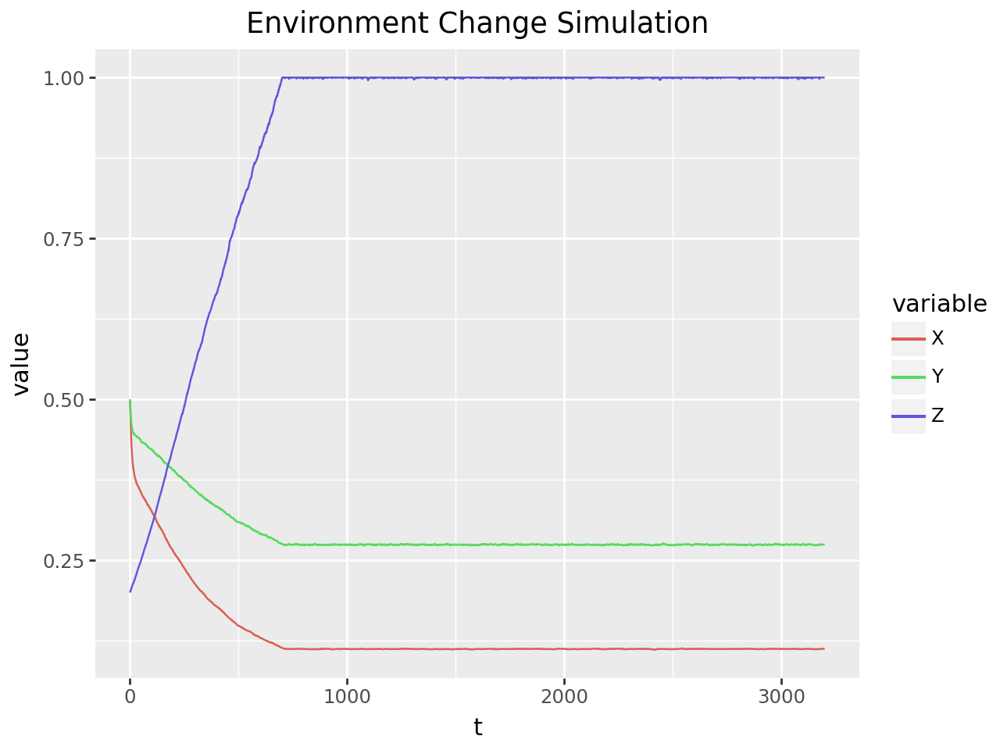

Salmon Final Population: 0.11
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.14
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.11
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Velocity: 0.26, Lamprey Velocity: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


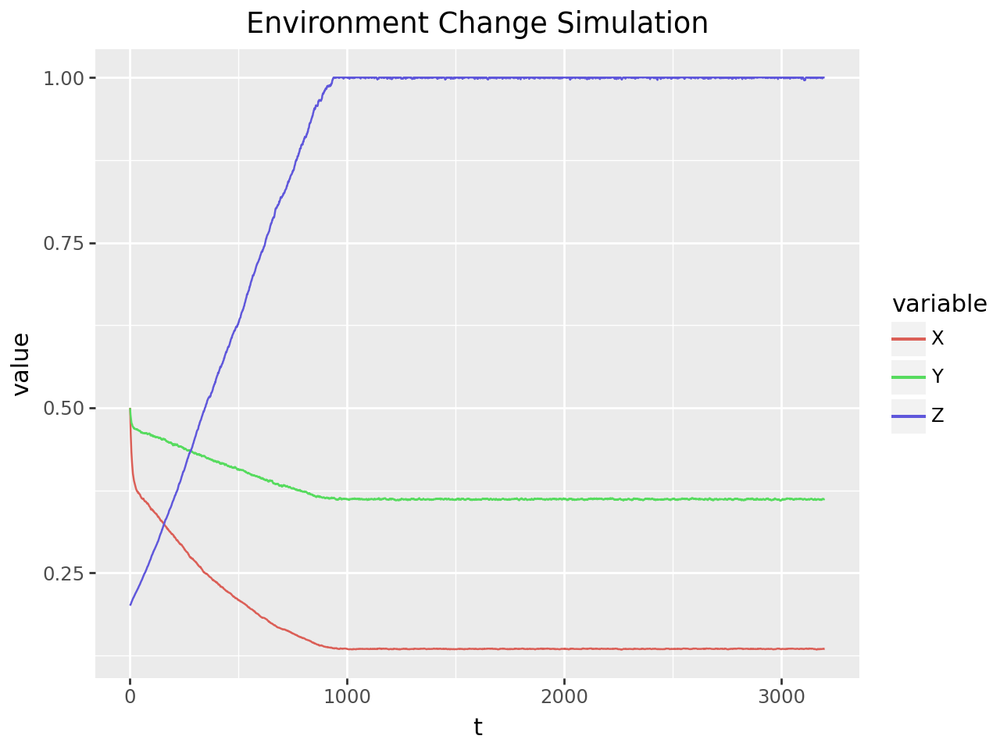

Salmon Final Population: 0.13
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.16
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.13
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.06
Lamprey Population SD: 0.03
Pinniped Population SD: 0.22



Salmon Velocity: 0.51, Lamprey Velocity: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


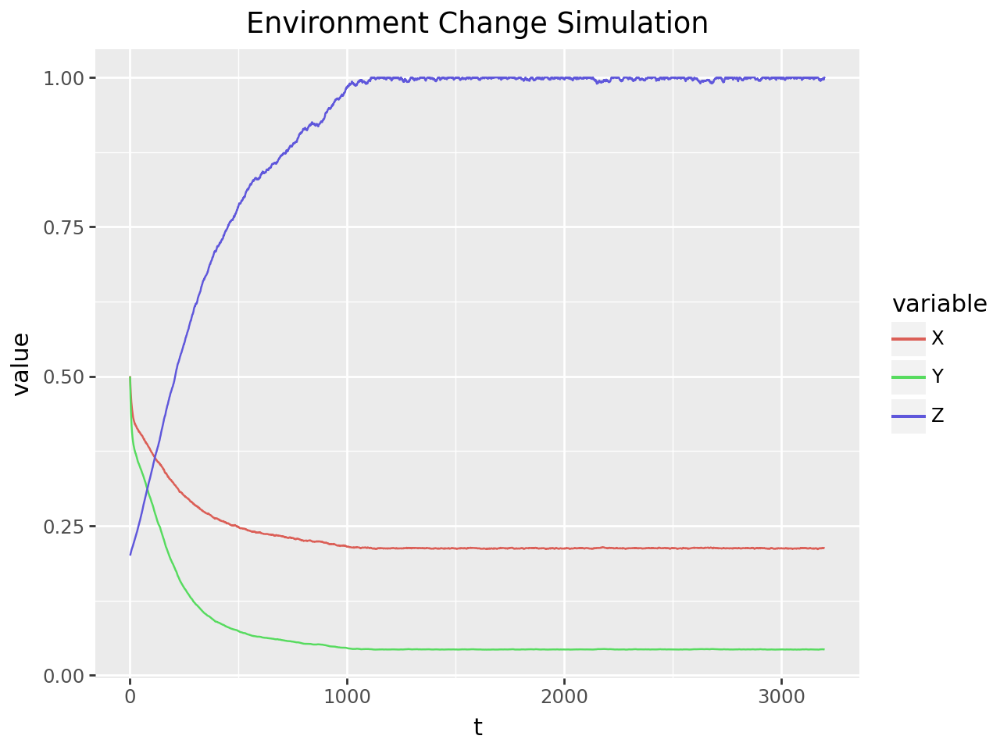

Salmon Final Population: 0.21
Lamprey Final Population: 0.04
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.07
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.04
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.06
Pinniped Population SD: 0.18



Salmon Velocity: 0.51, Lamprey Velocity: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


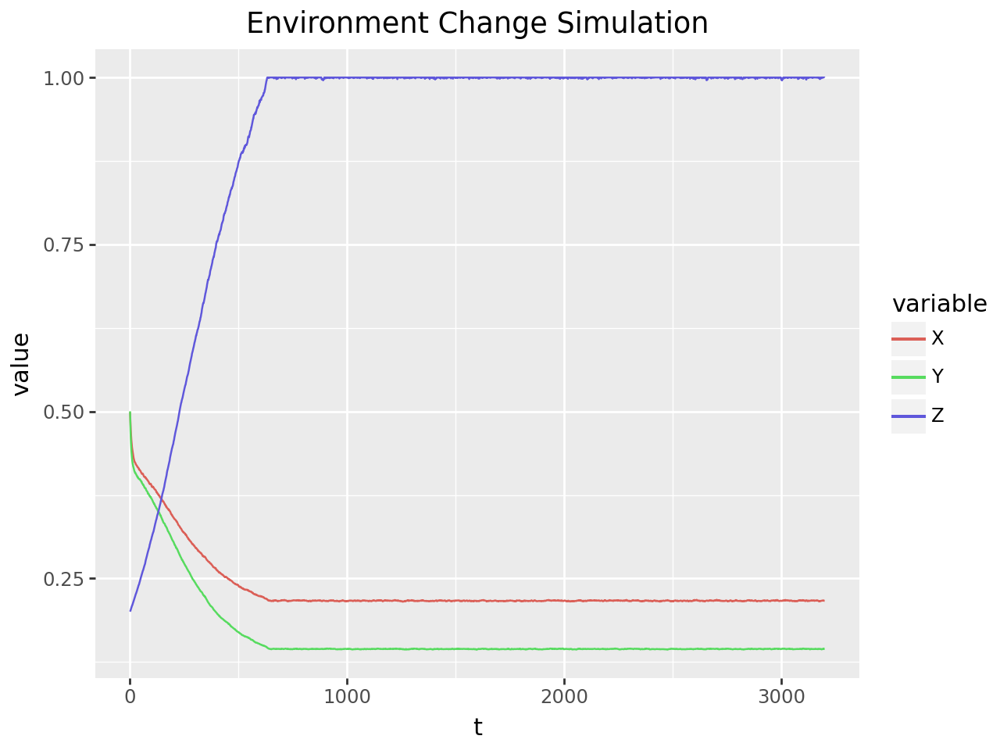

Salmon Final Population: 0.22
Lamprey Final Population: 0.14
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.17
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.14
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.06
Pinniped Population SD: 0.19



Salmon Velocity: 0.51, Lamprey Velocity: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


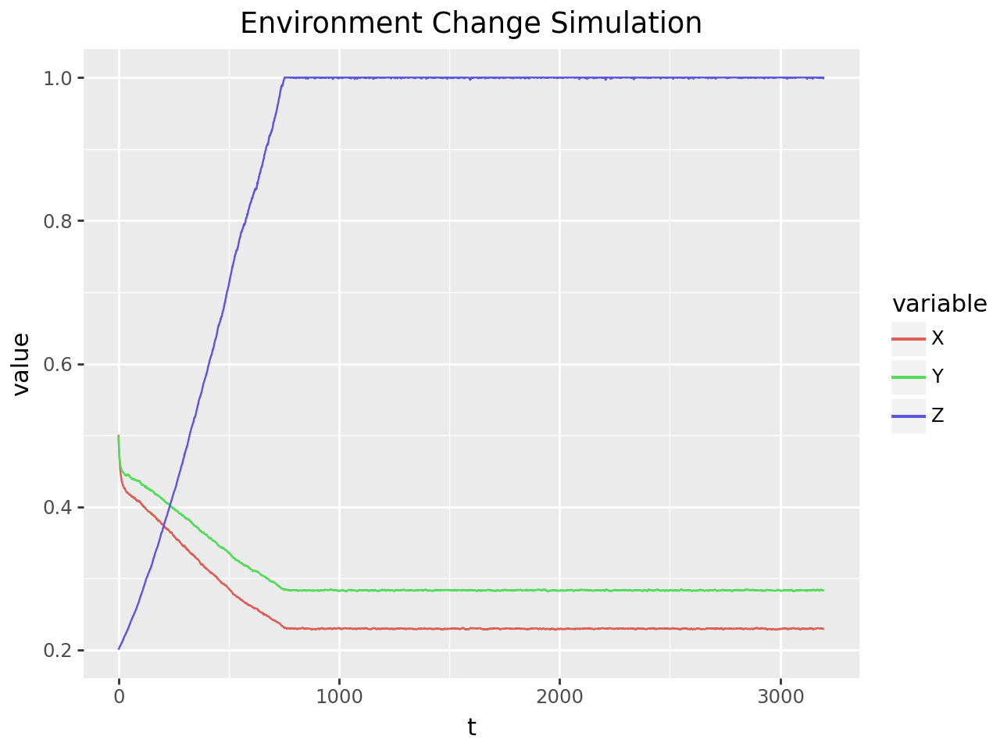

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.22



Salmon Velocity: 0.51, Lamprey Velocity: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


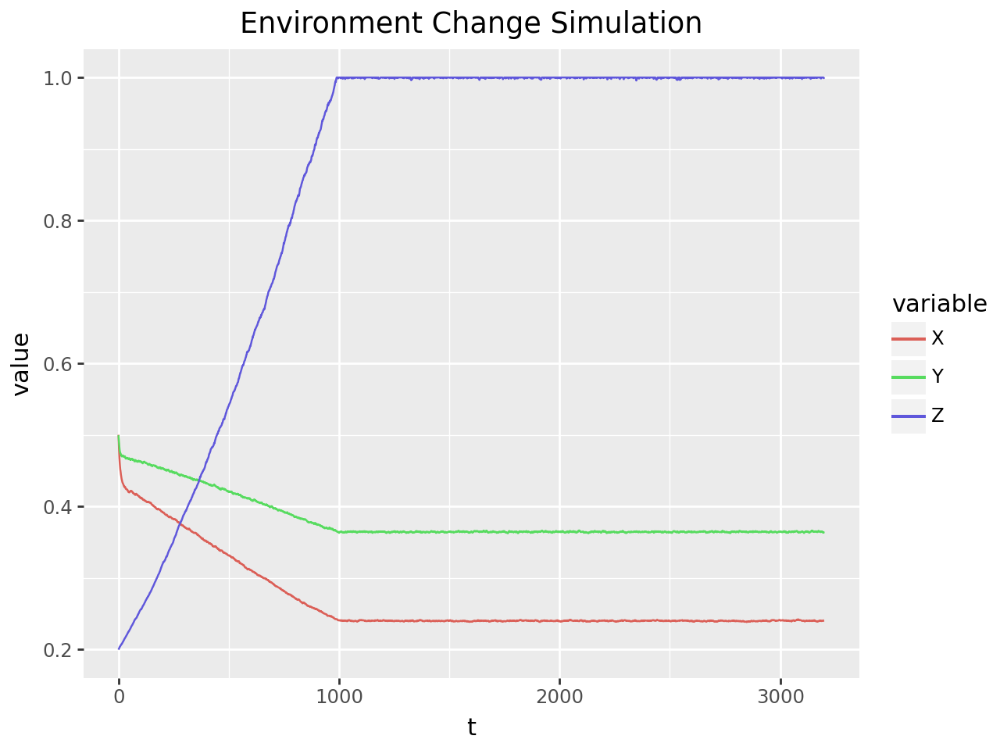

Salmon Final Population: 0.24
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.86

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.24
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.06

Salmon Population SD: 0.05
Lamprey Population SD: 0.03
Pinniped Population SD: 0.24



Salmon Velocity: 0.76, Lamprey Velocity: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


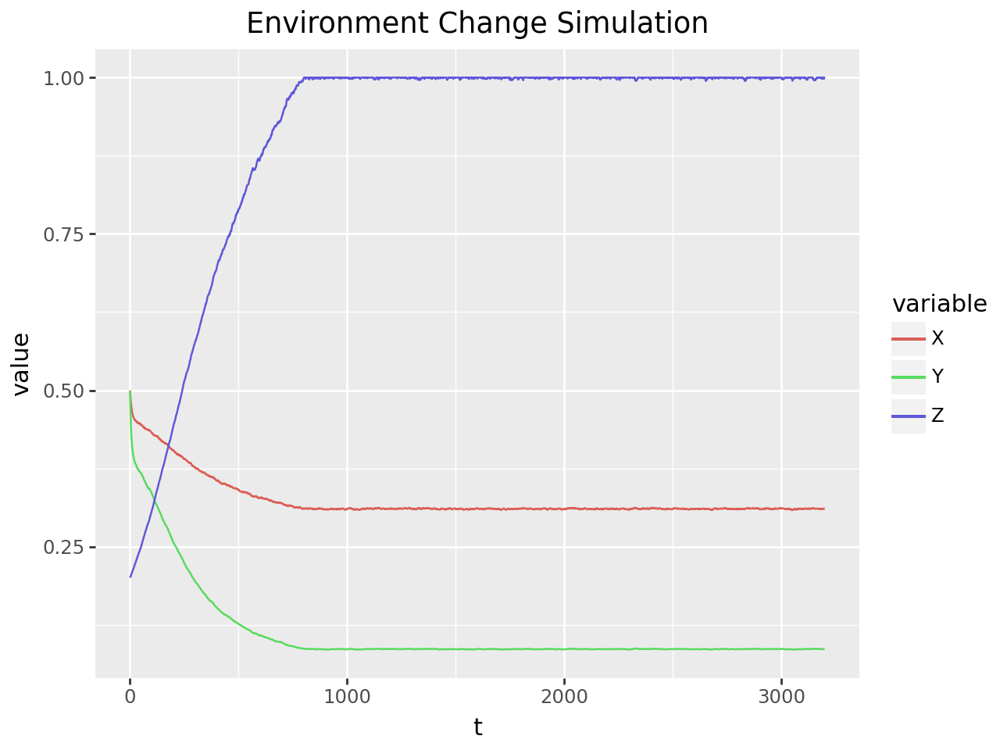

Salmon Final Population: 0.31
Lamprey Final Population: 0.09
Pinniped Final Population: 1.00

Salmon Mean Population: 0.32
Lamprey Mean Population: 0.11
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.31
Lamprey Min Population: 0.09
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.03
Lamprey Population SD: 0.07
Pinniped Population SD: 0.19



Salmon Velocity: 0.76, Lamprey Velocity: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


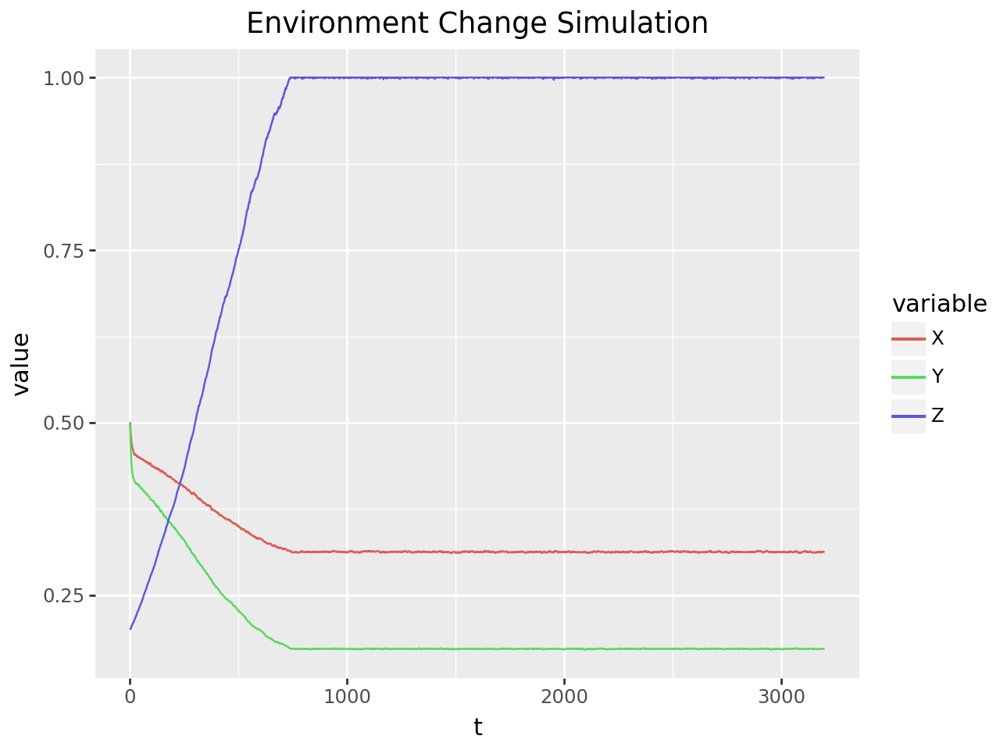

Salmon Final Population: 0.31
Lamprey Final Population: 0.17
Pinniped Final Population: 1.00

Salmon Mean Population: 0.33
Lamprey Mean Population: 0.20
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.31
Lamprey Min Population: 0.17
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.06
Pinniped Population SD: 0.21



Salmon Velocity: 0.76, Lamprey Velocity: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


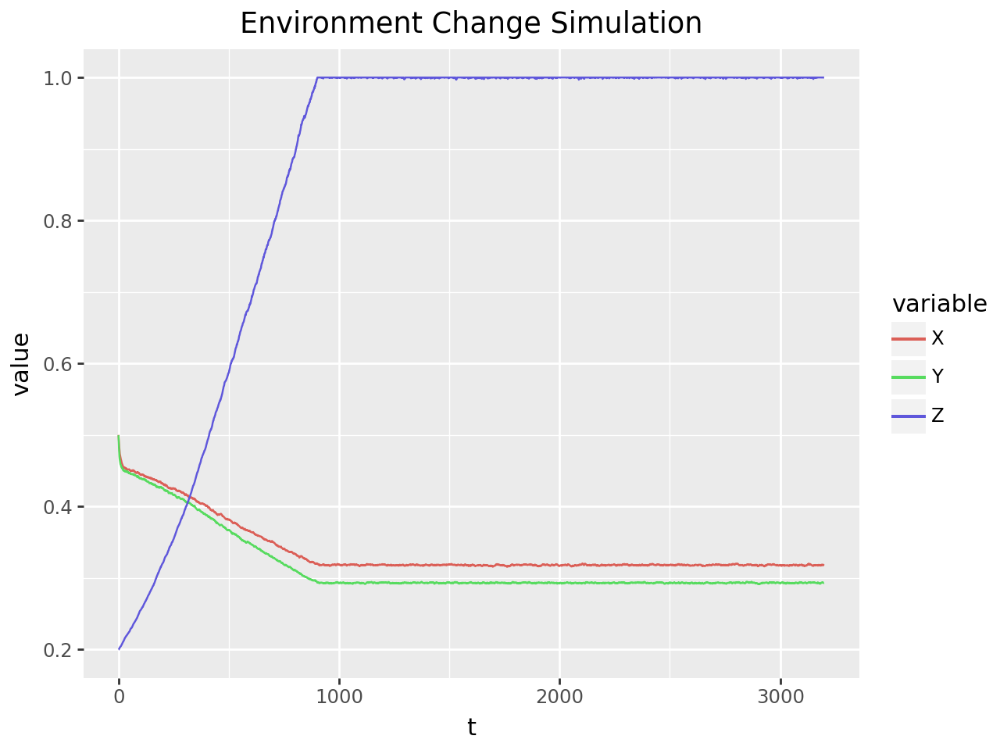

Salmon Final Population: 0.32
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.34
Lamprey Mean Population: 0.32
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.32
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.06

Salmon Population SD: 0.04
Lamprey Population SD: 0.05
Pinniped Population SD: 0.24



Salmon Velocity: 0.76, Lamprey Velocity: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


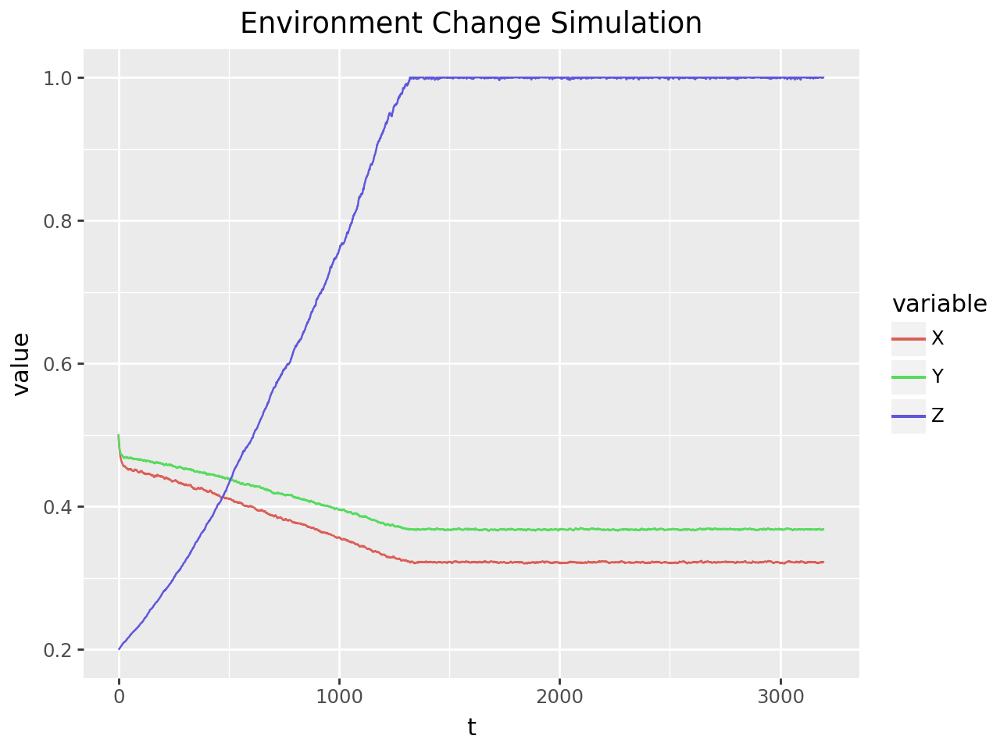

Salmon Final Population: 0.32
Lamprey Final Population: 0.37
Pinniped Final Population: 1.00

Salmon Mean Population: 0.35
Lamprey Mean Population: 0.39
Pinniped Mean Population: 0.82

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.32
Lamprey Min Population: 0.37
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.07

Salmon Population SD: 0.04
Lamprey Population SD: 0.03
Pinniped Population SD: 0.27





In [ ]:
simulate_param_changes(n_timesteps, hv_increment_range, "v", plot_funcs=(True, False))

Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.010000000000000009


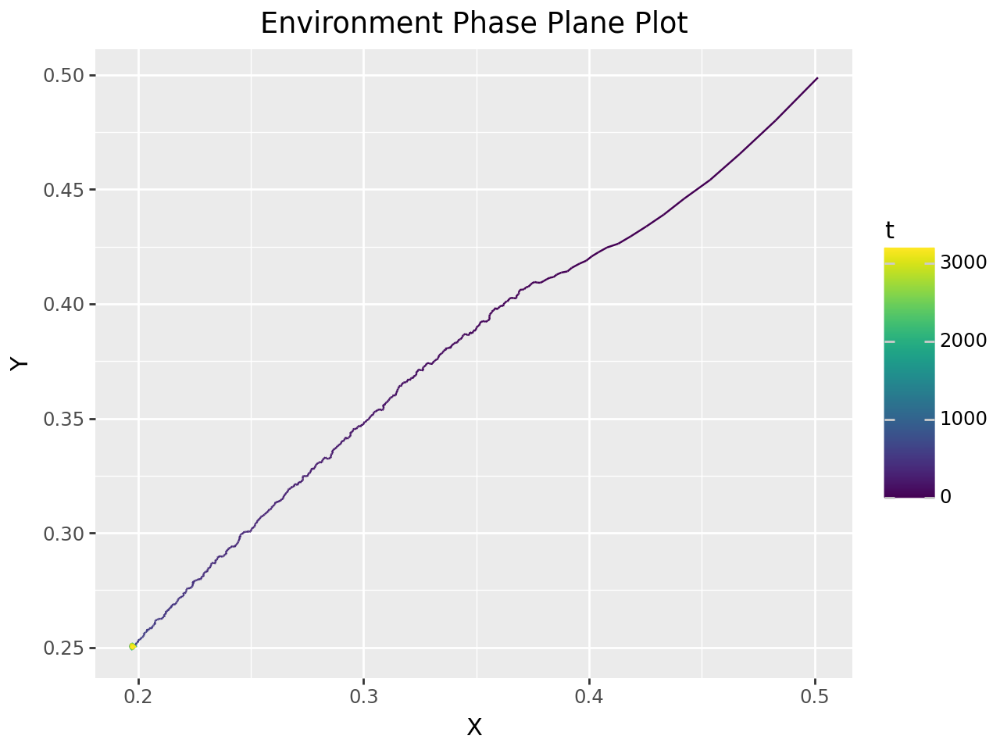

Salmon Final Population: 0.20
Lamprey Final Population: 0.25
Pinniped Final Population: 1.00

Salmon Mean Population: 0.21
Lamprey Mean Population: 0.26
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.26


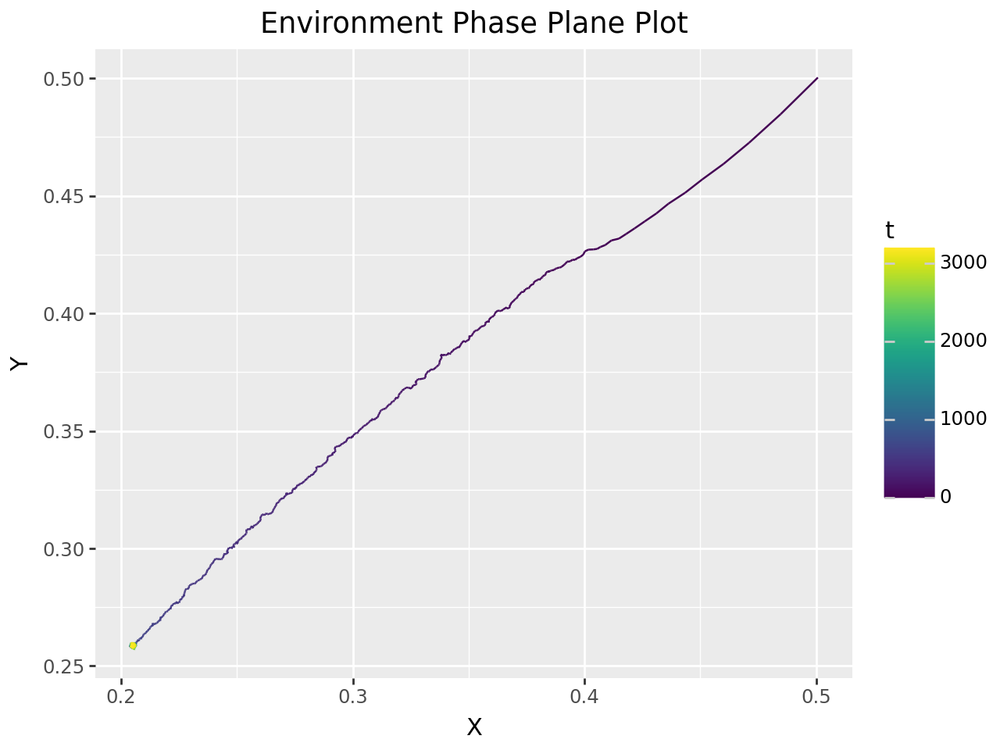

Salmon Final Population: 0.20
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.51


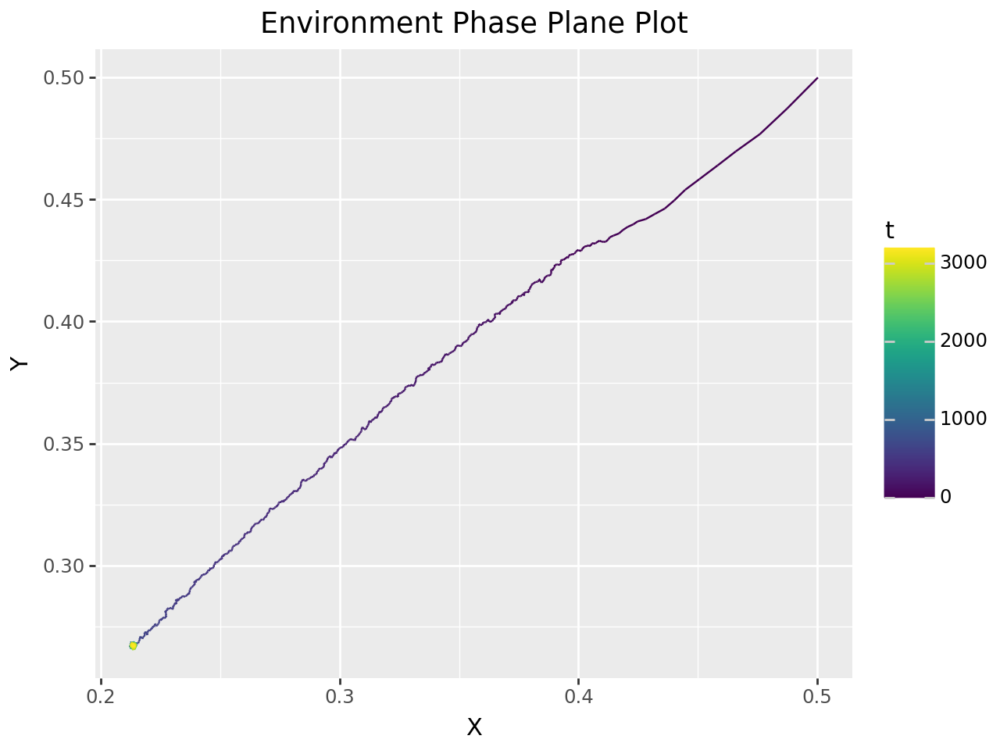

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.76


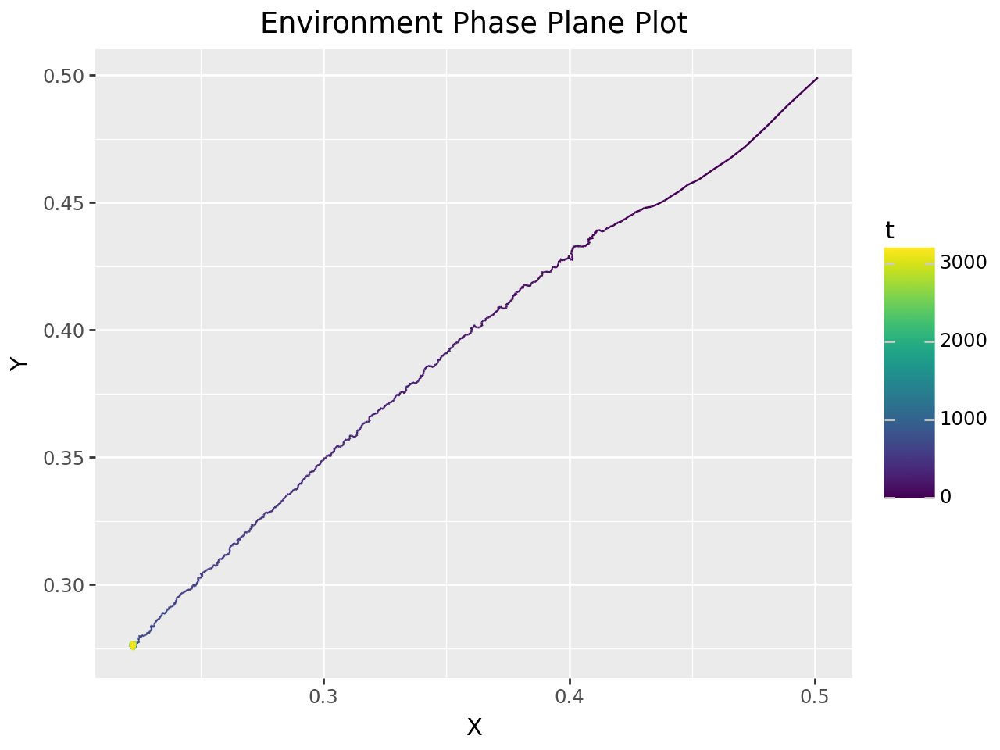

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.010000000000000009


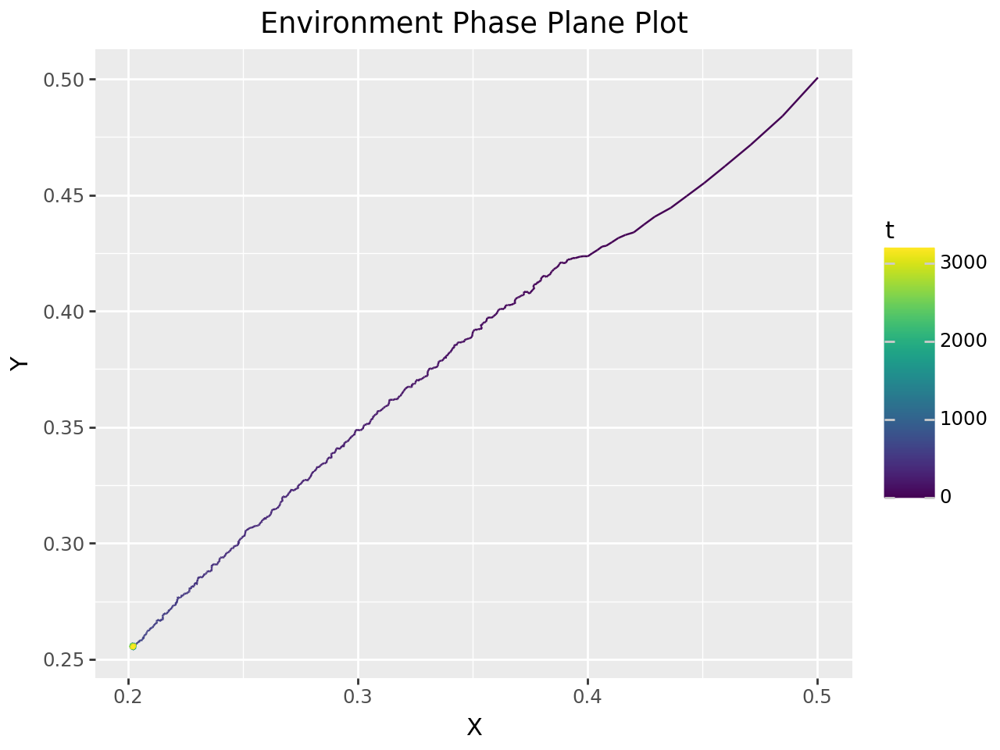

Salmon Final Population: 0.20
Lamprey Final Population: 0.25
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.26


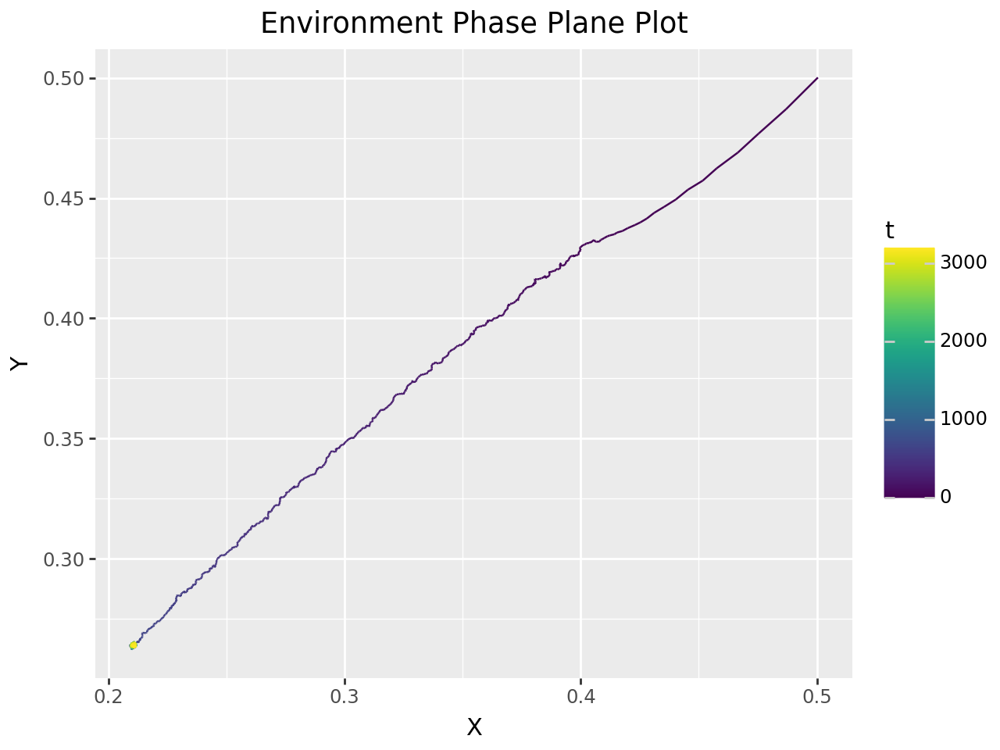

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.51


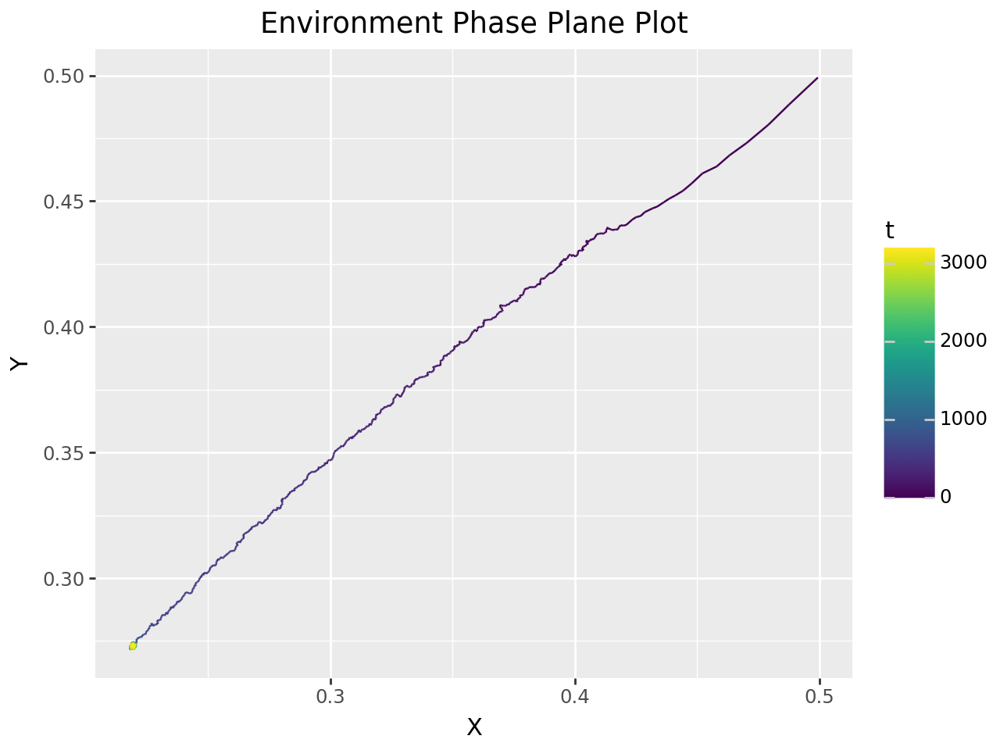

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.76


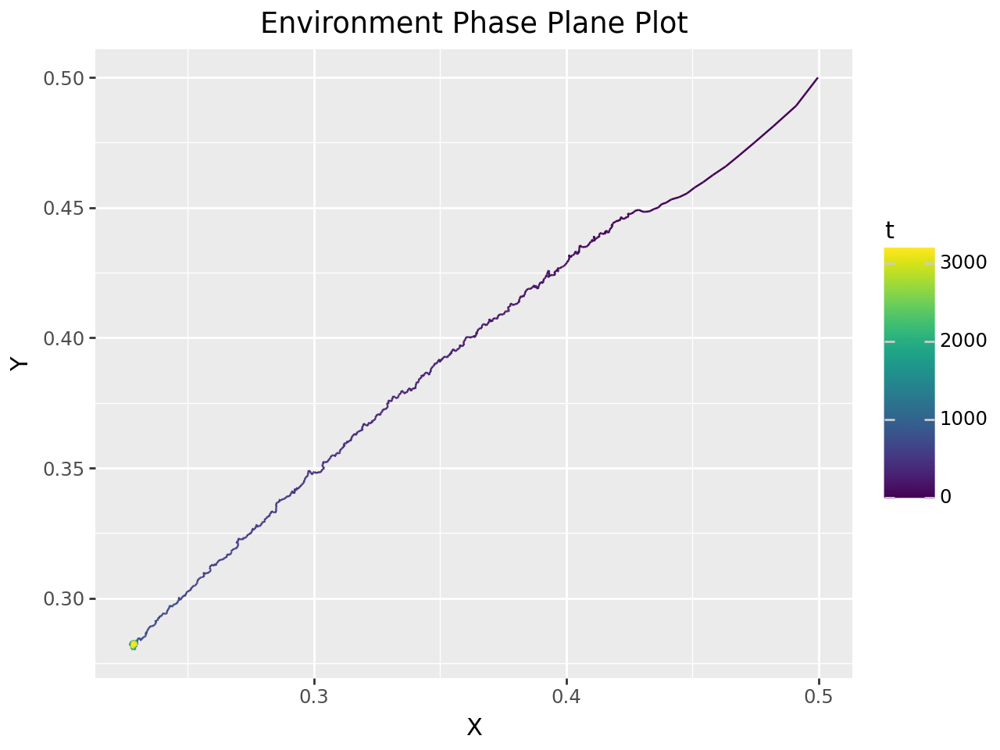

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.22



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.010000000000000009


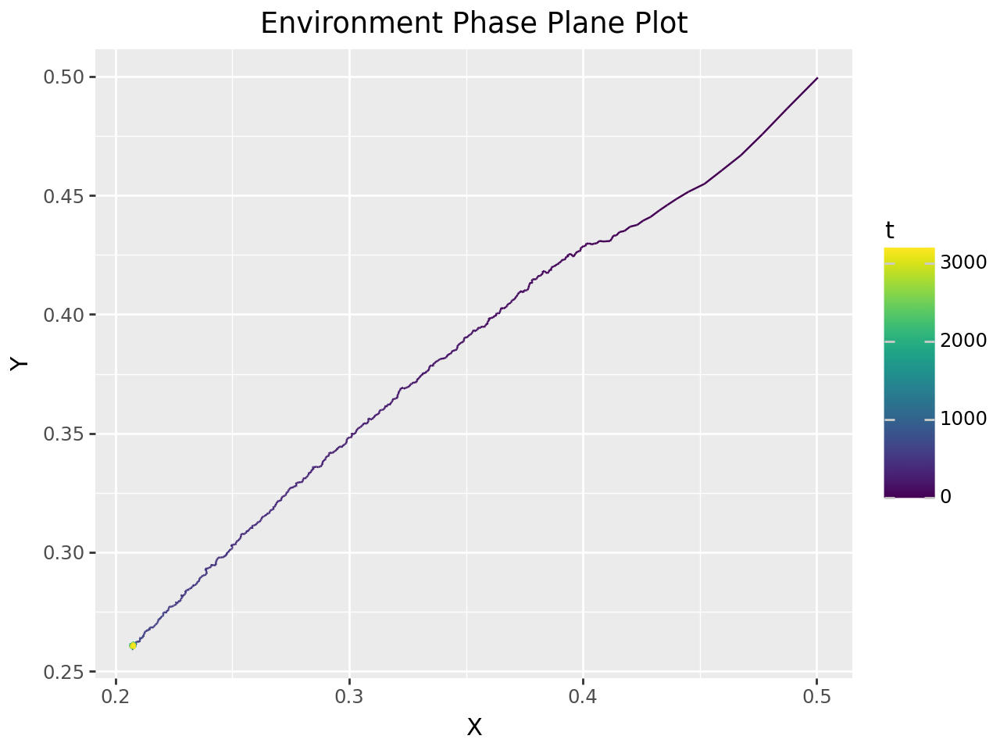

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.26


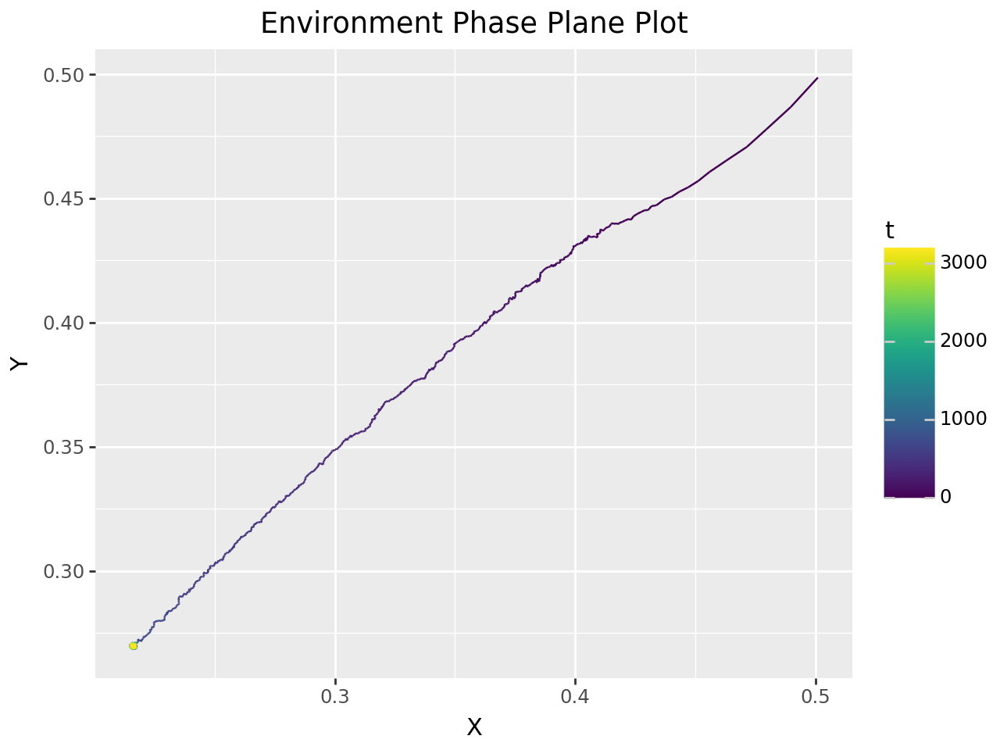

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.51


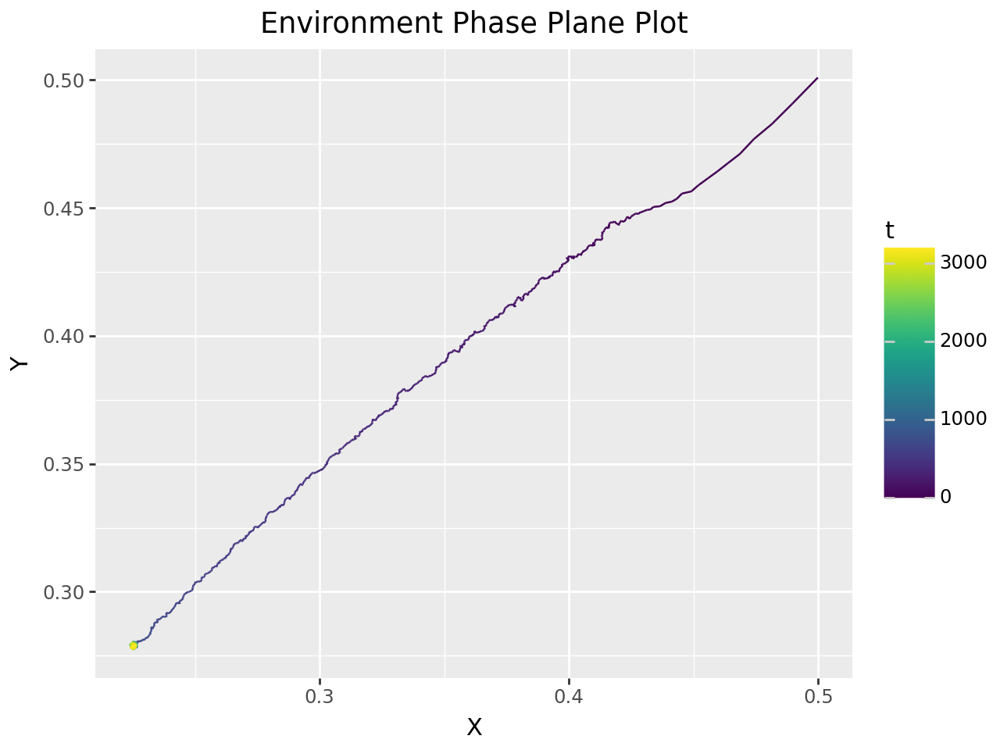

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.76


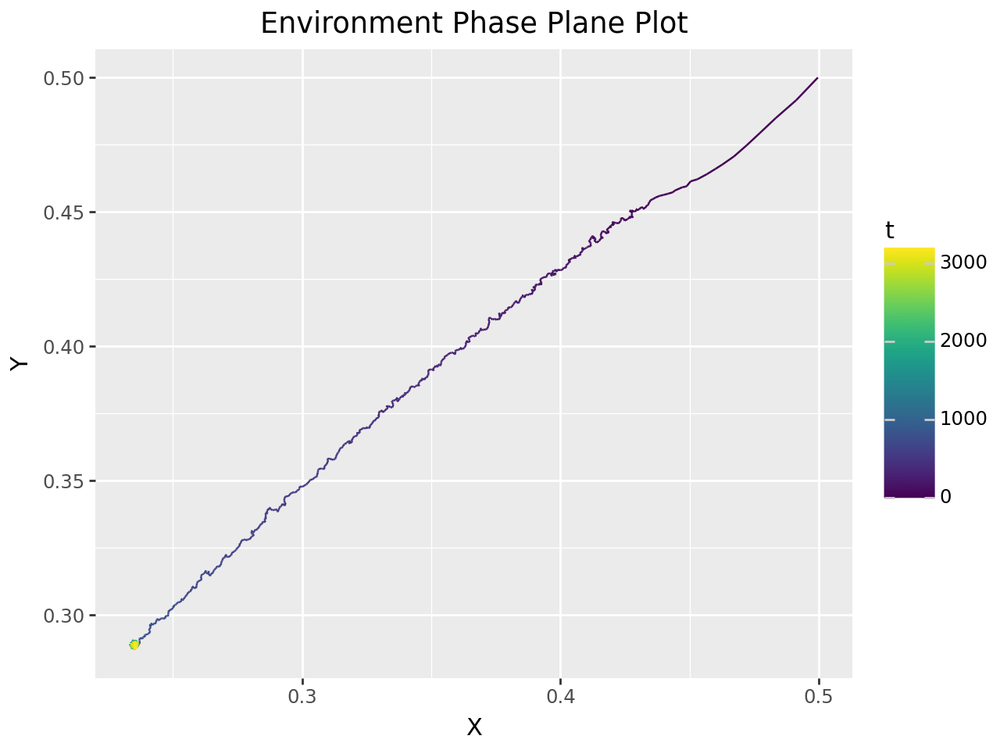

Salmon Final Population: 0.24
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.23



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.010000000000000009


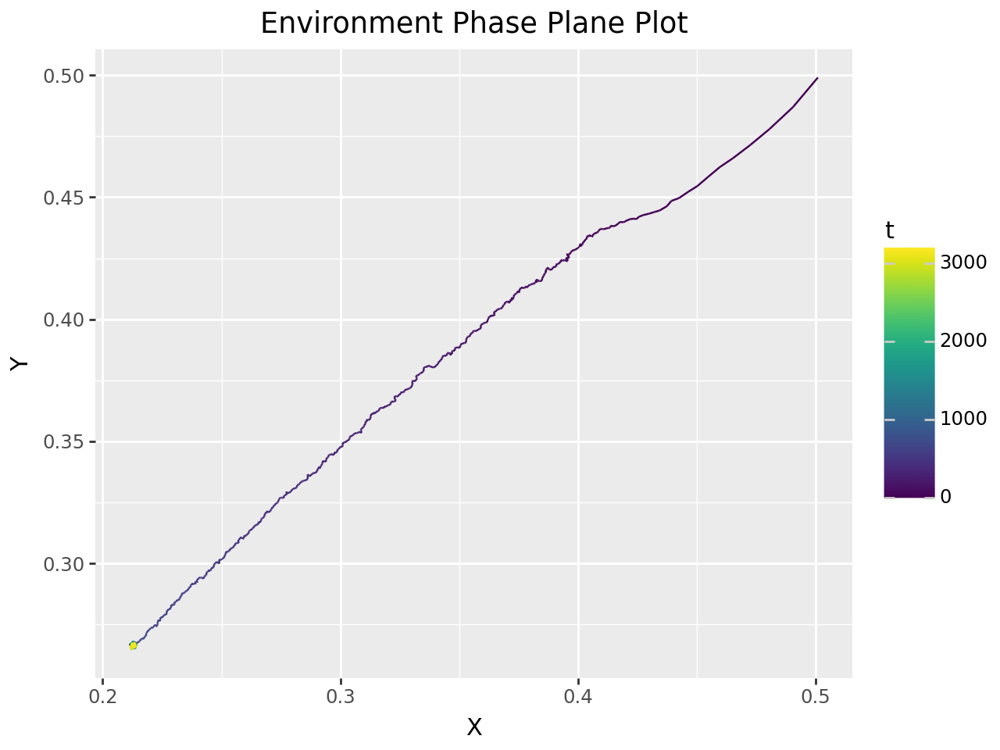

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.26


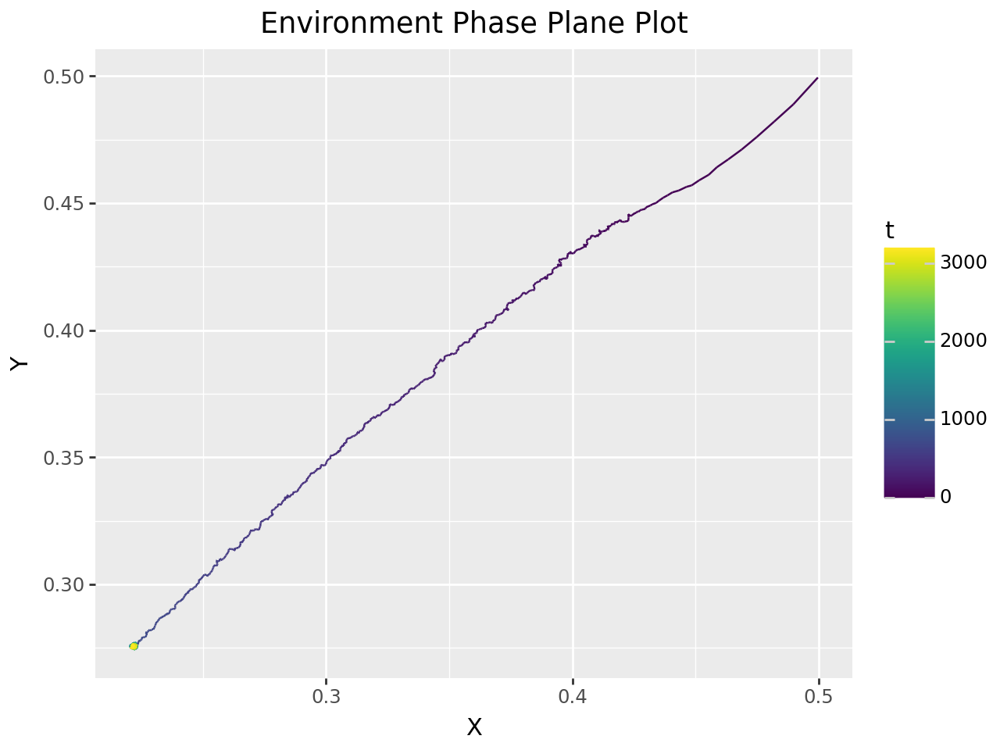

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.51


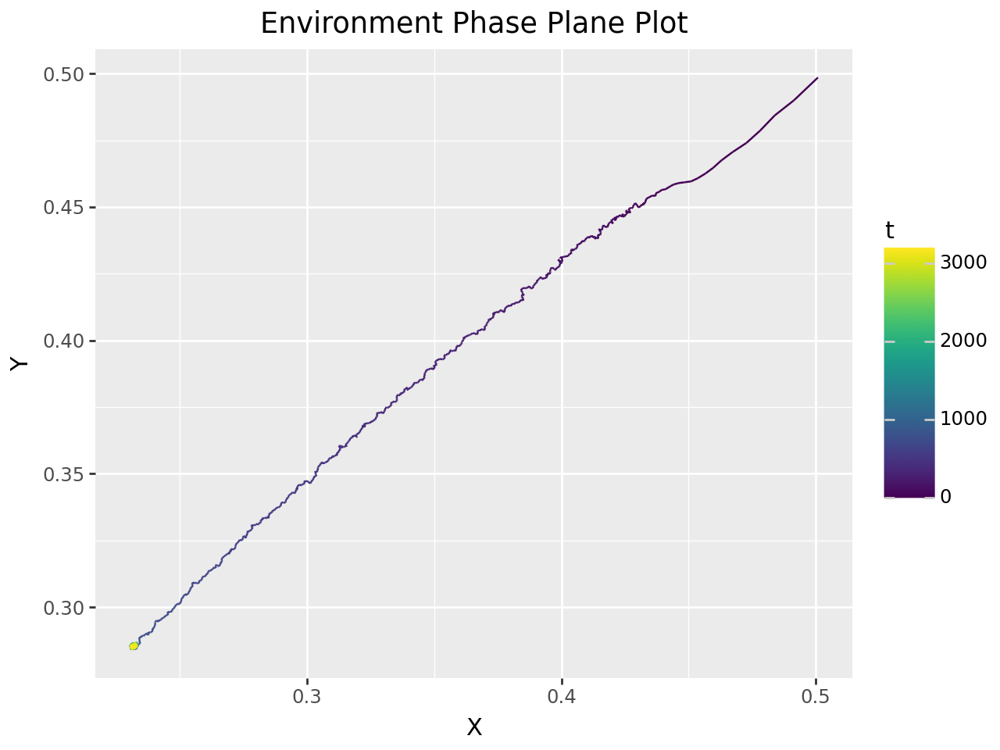

Salmon Final Population: 0.23
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.76


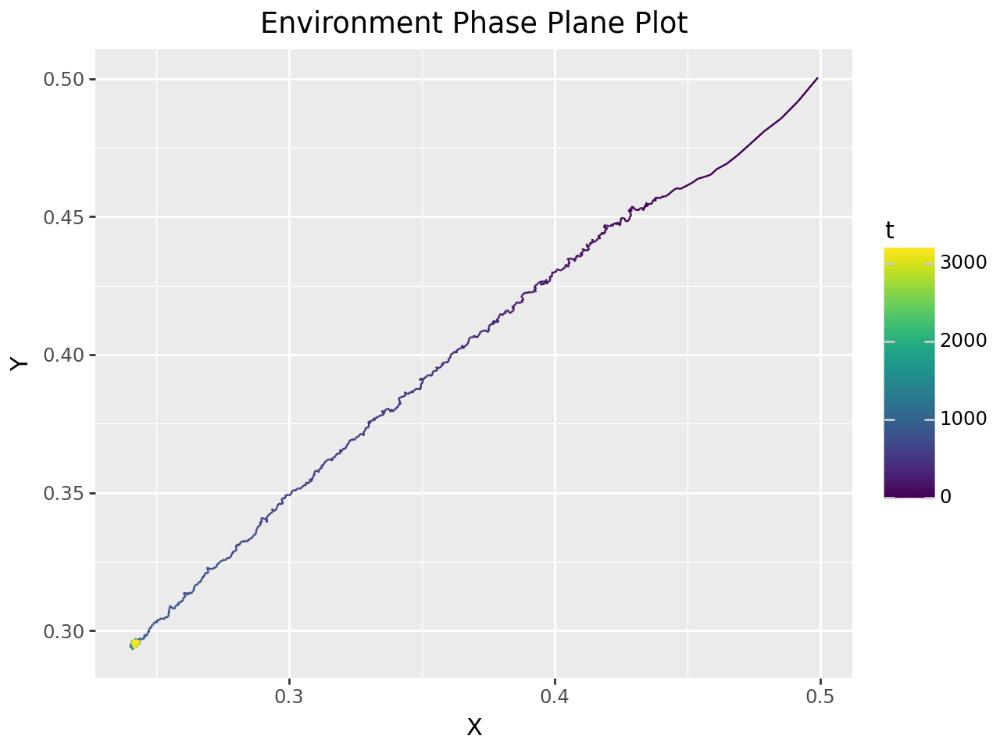

Salmon Final Population: 0.24
Lamprey Final Population: 0.30
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.32
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.24
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.06
Lamprey Population SD: 0.05
Pinniped Population SD: 0.23



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.010000000000000009


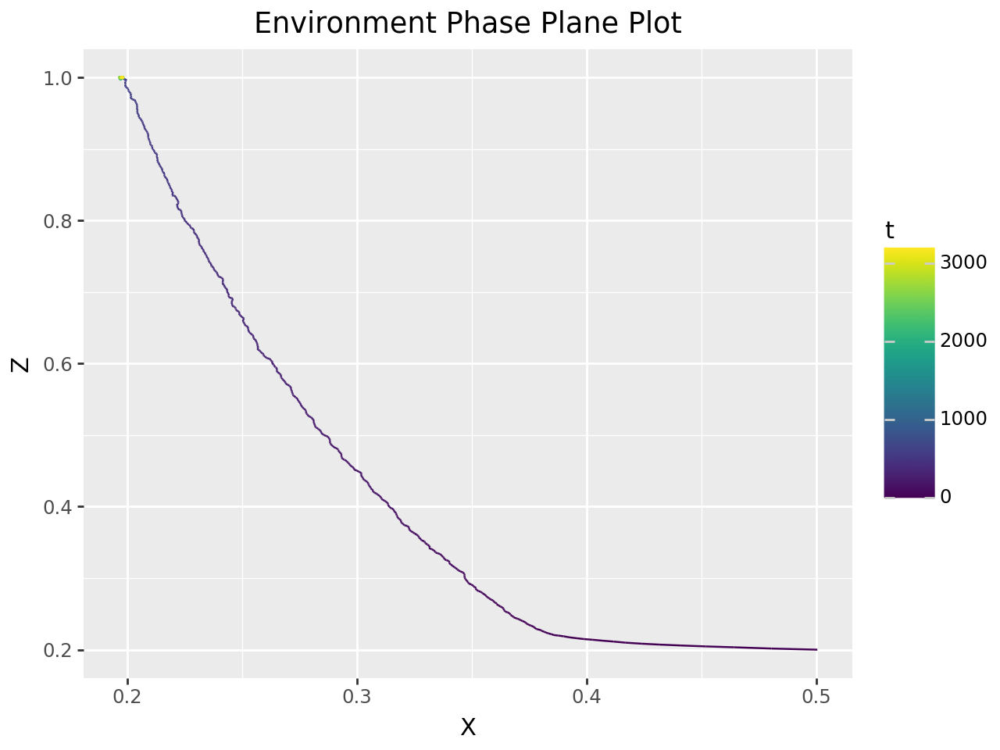

Salmon Final Population: 0.20
Lamprey Final Population: 0.25
Pinniped Final Population: 1.00

Salmon Mean Population: 0.21
Lamprey Mean Population: 0.26
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.26


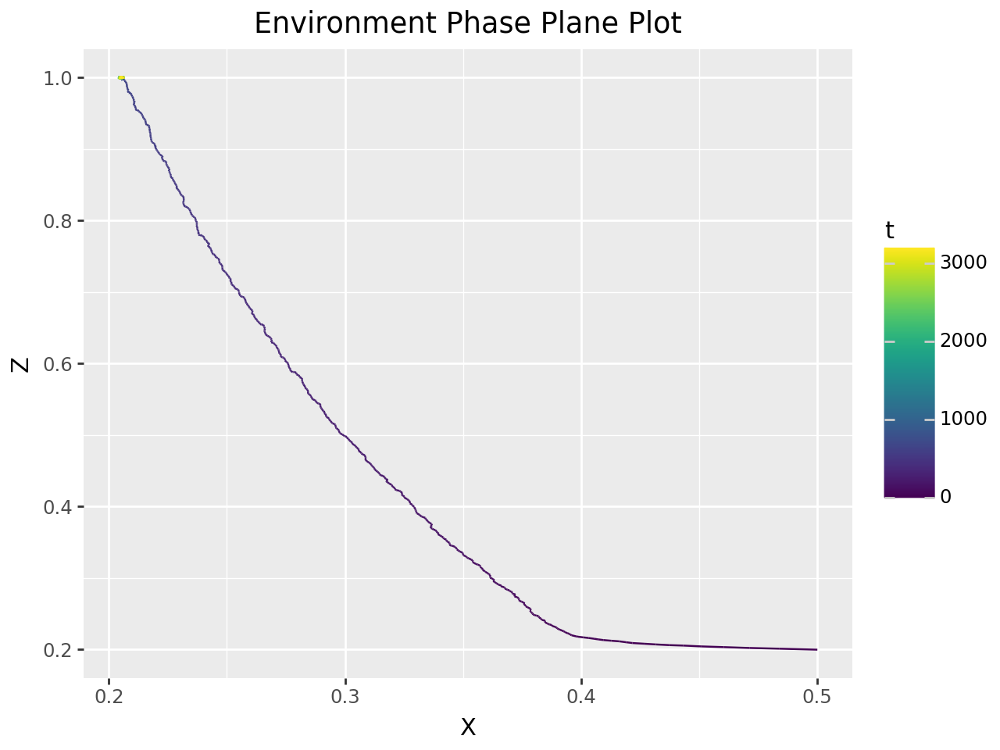

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.51


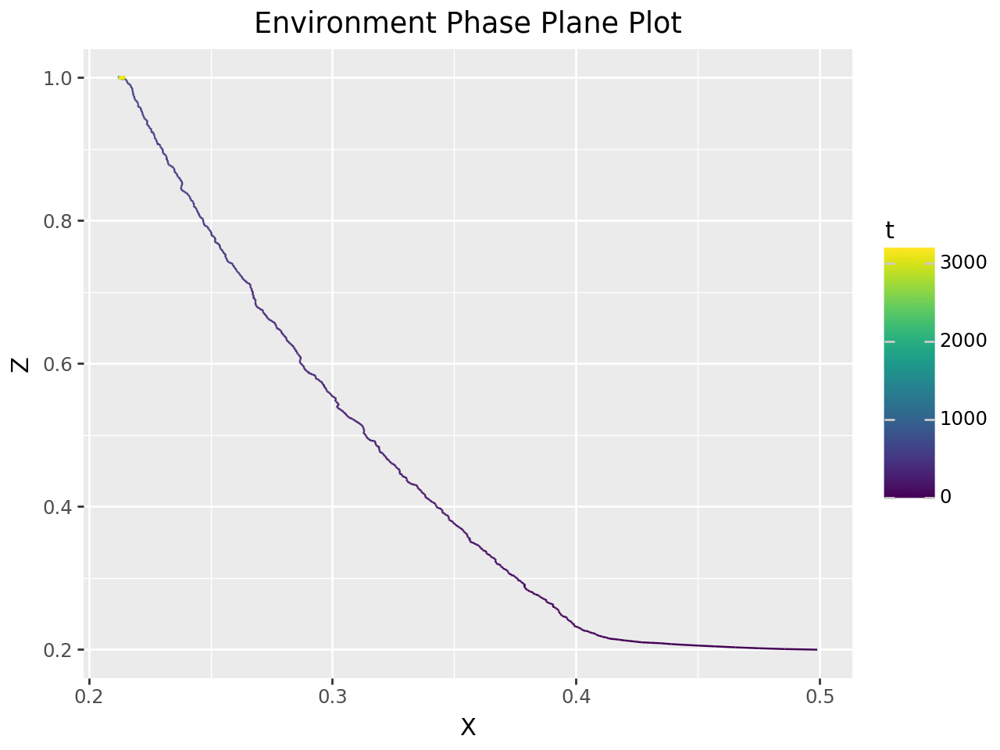

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.76


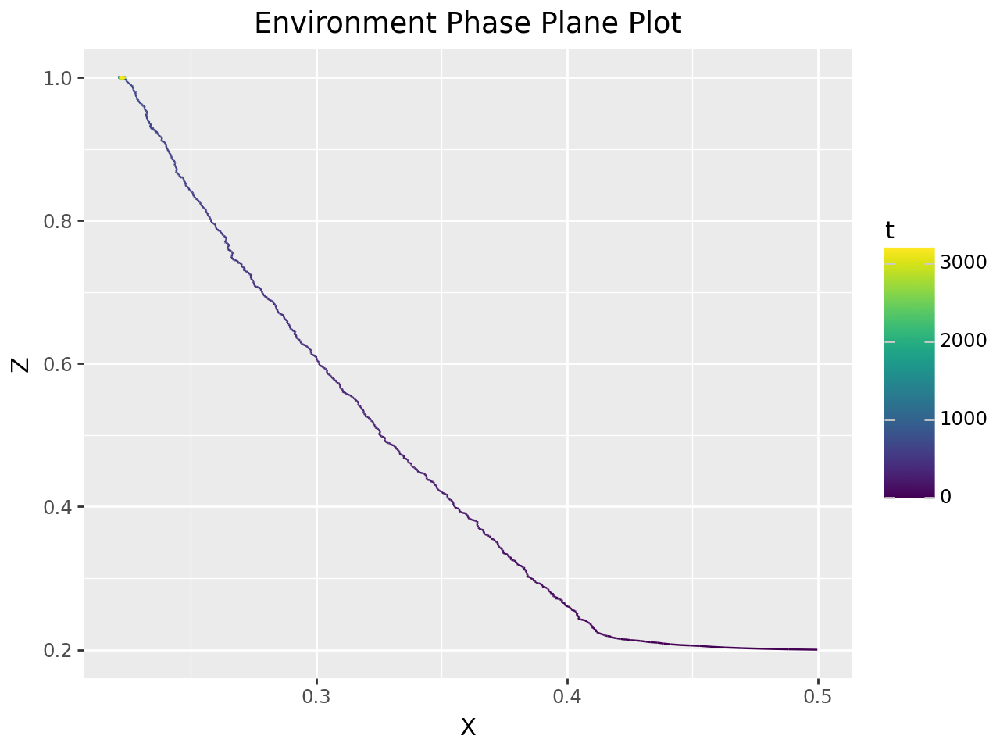

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.010000000000000009


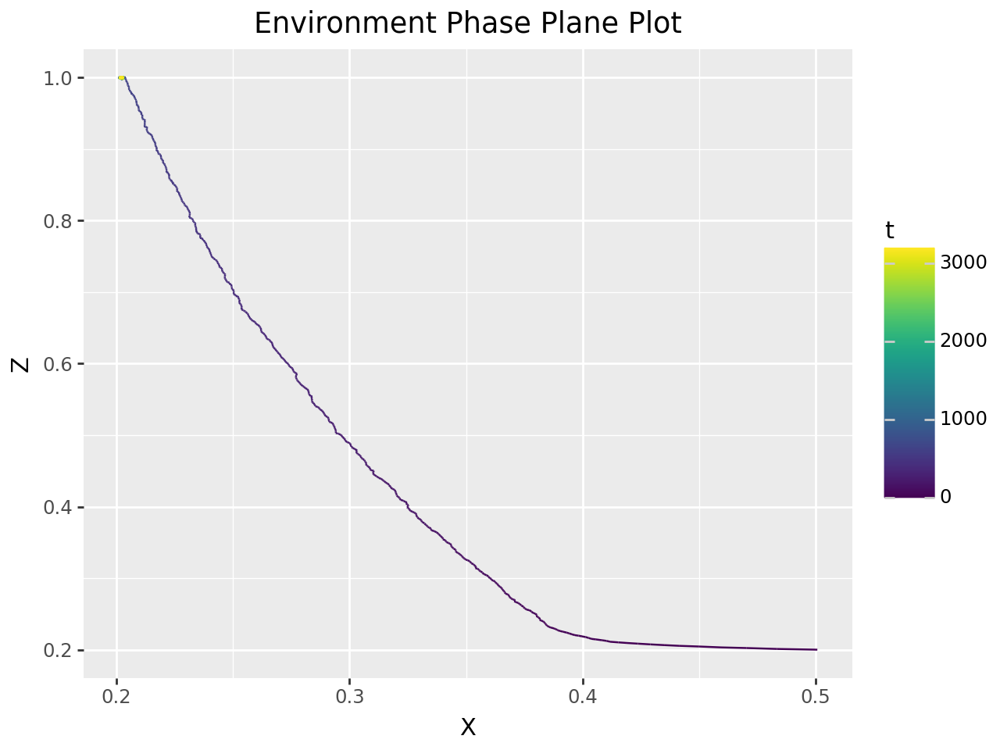

Salmon Final Population: 0.20
Lamprey Final Population: 0.25
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.26


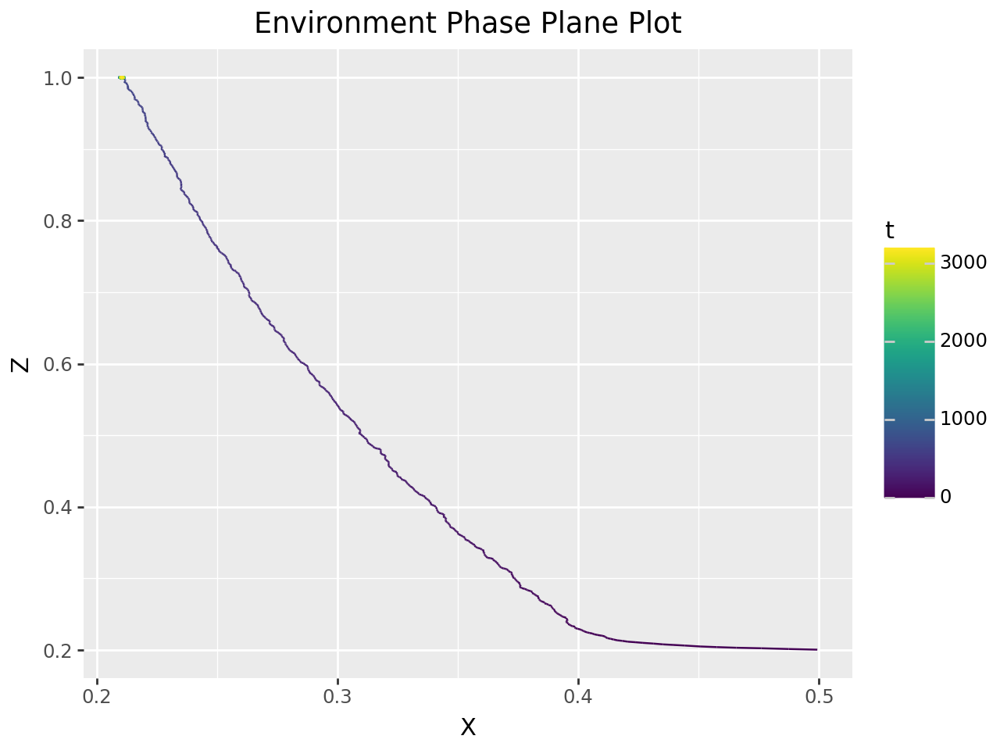

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.51


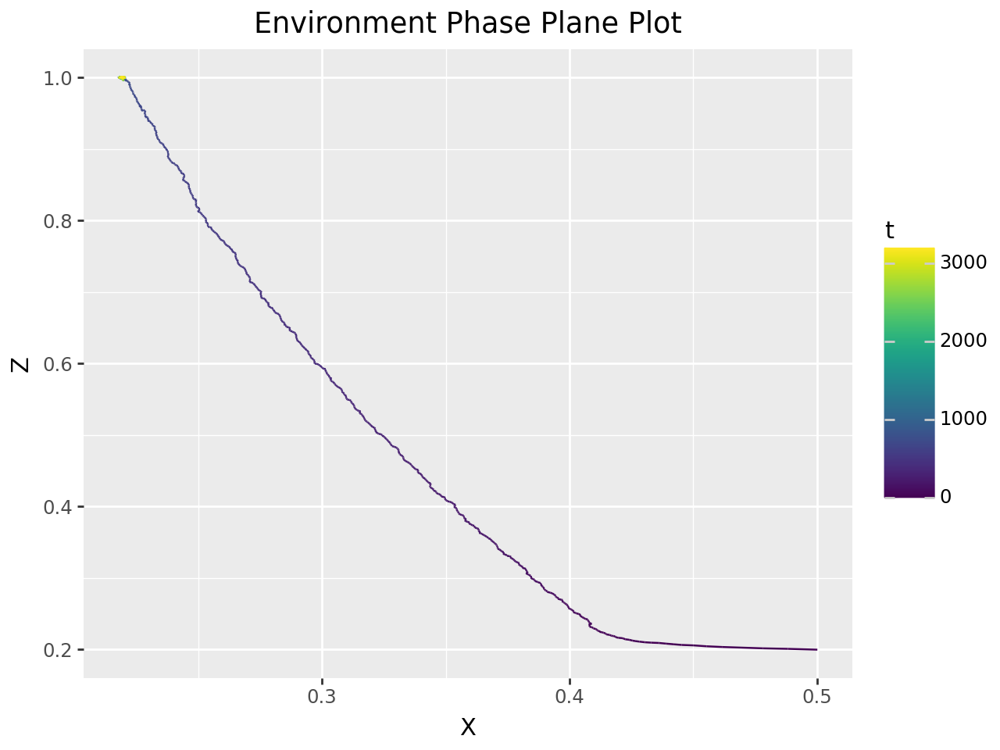

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.76


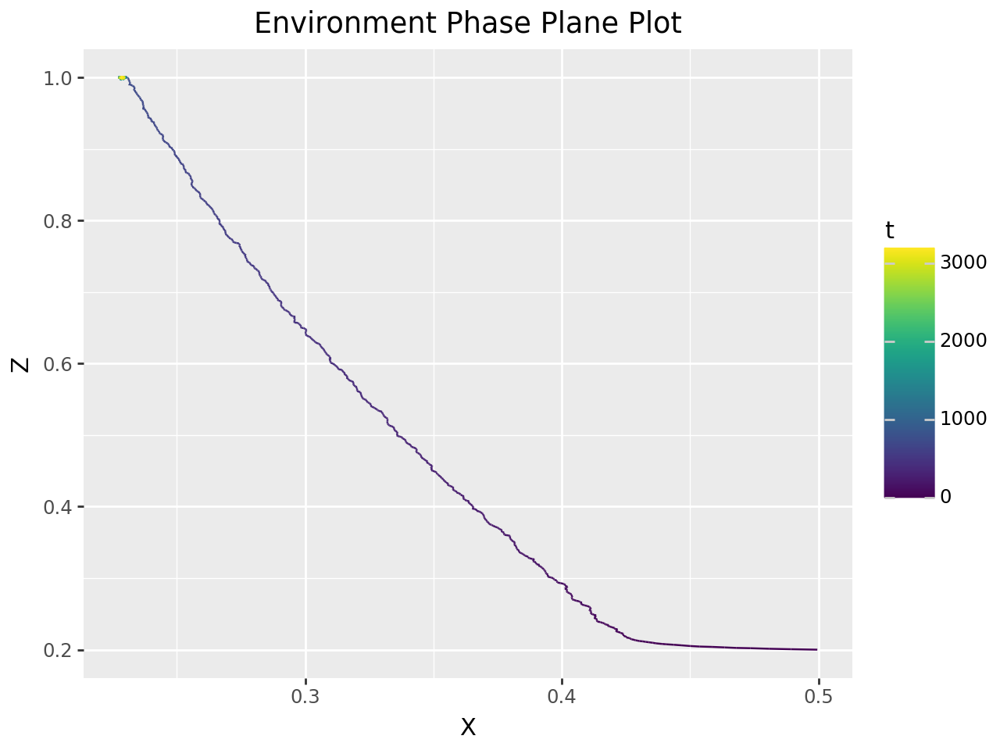

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.22



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.010000000000000009


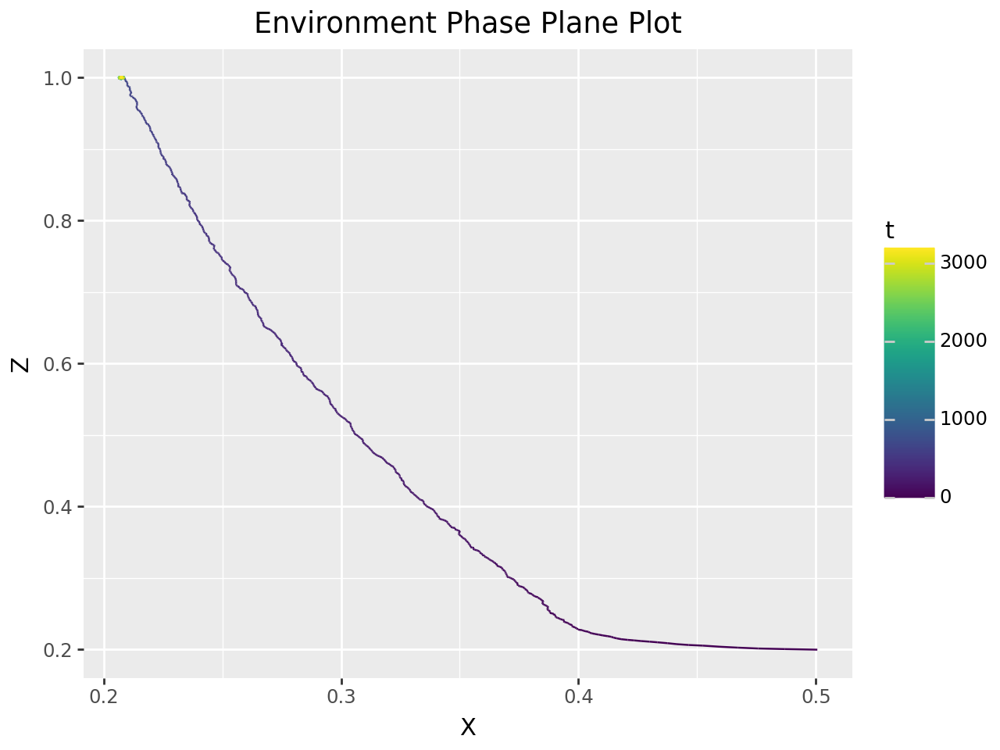

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.26


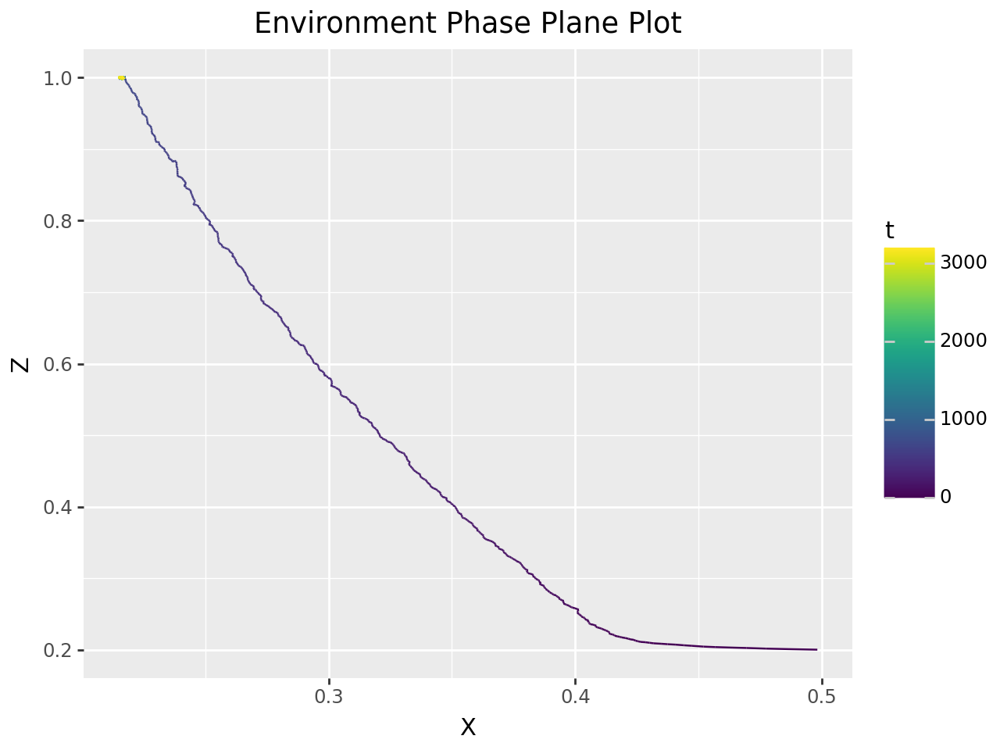

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.51


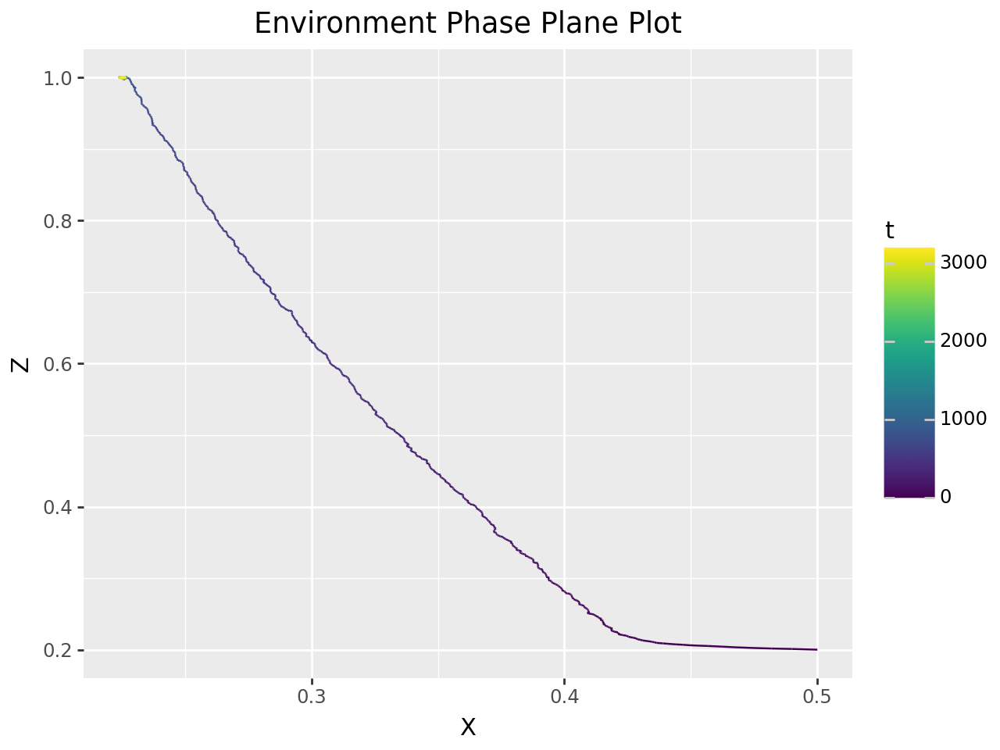

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.76


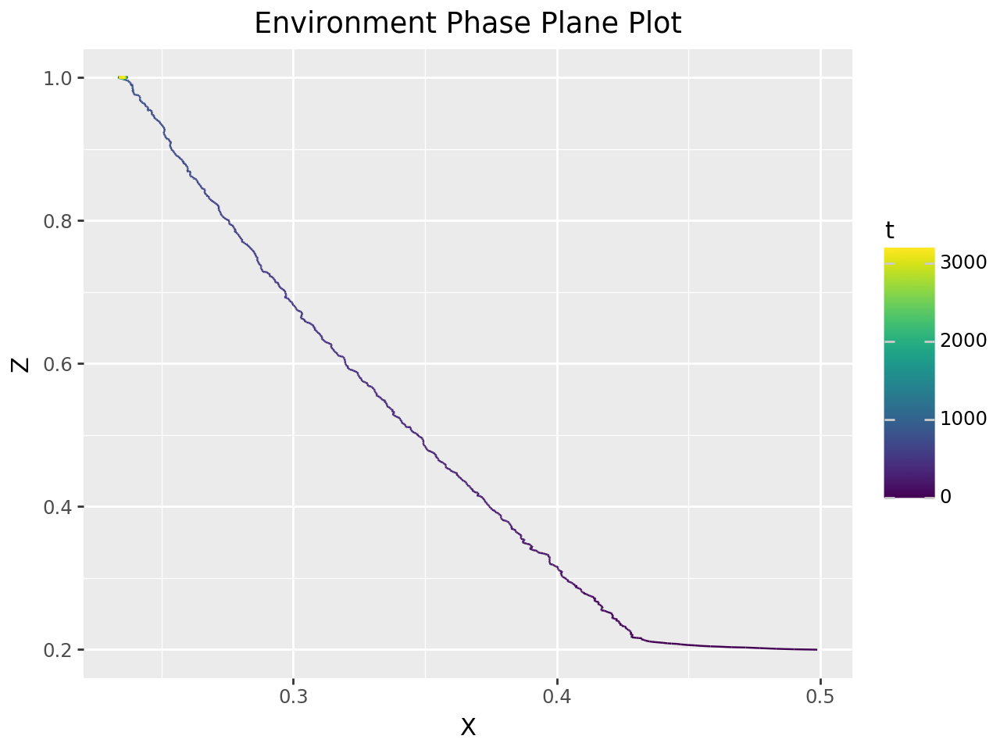

Salmon Final Population: 0.24
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.010000000000000009


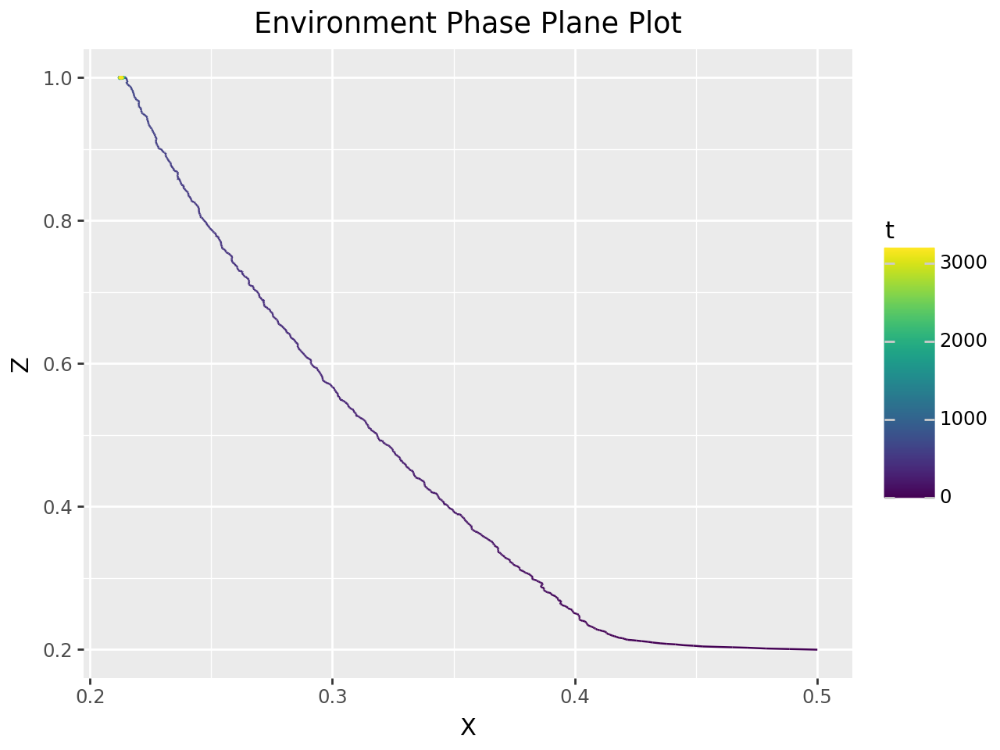

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.26


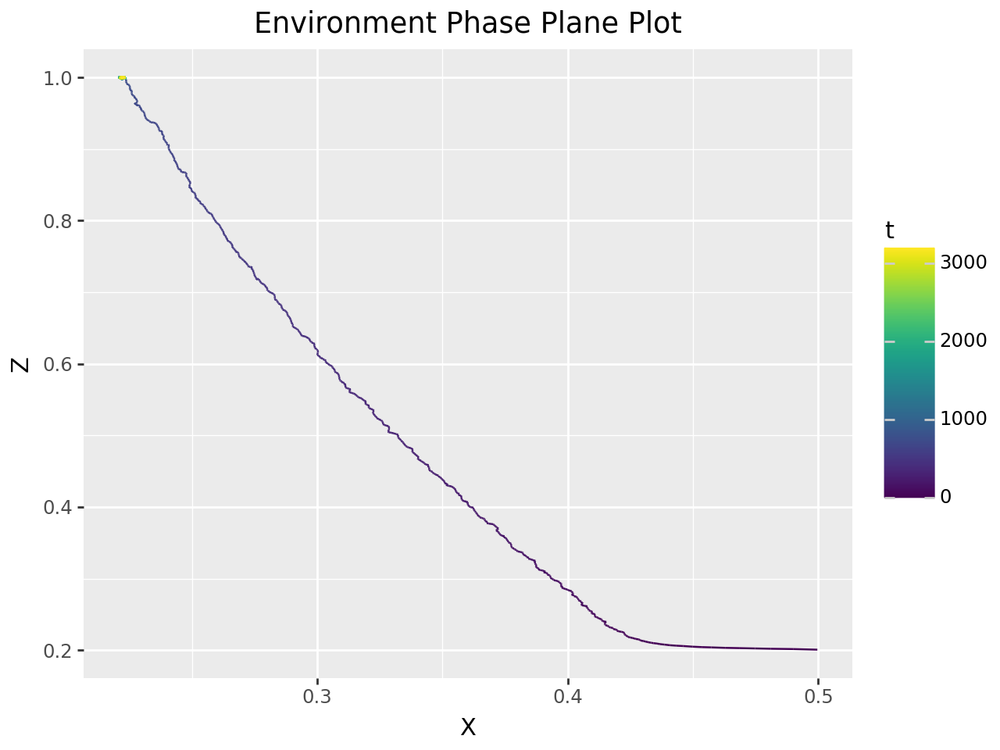

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.51


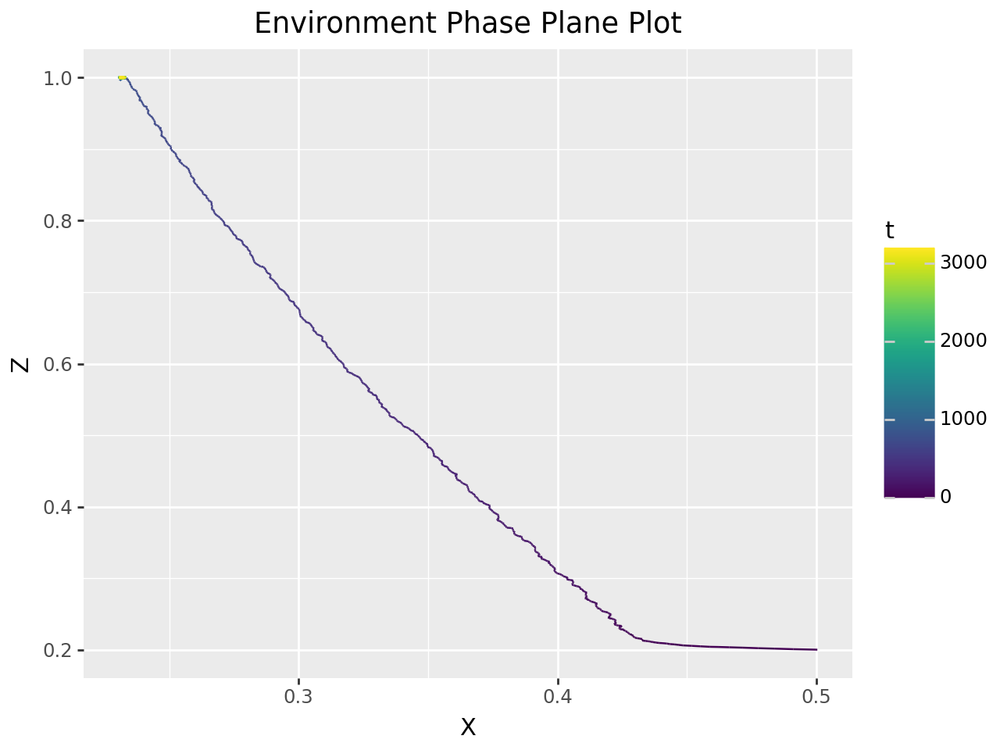

Salmon Final Population: 0.23
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.76


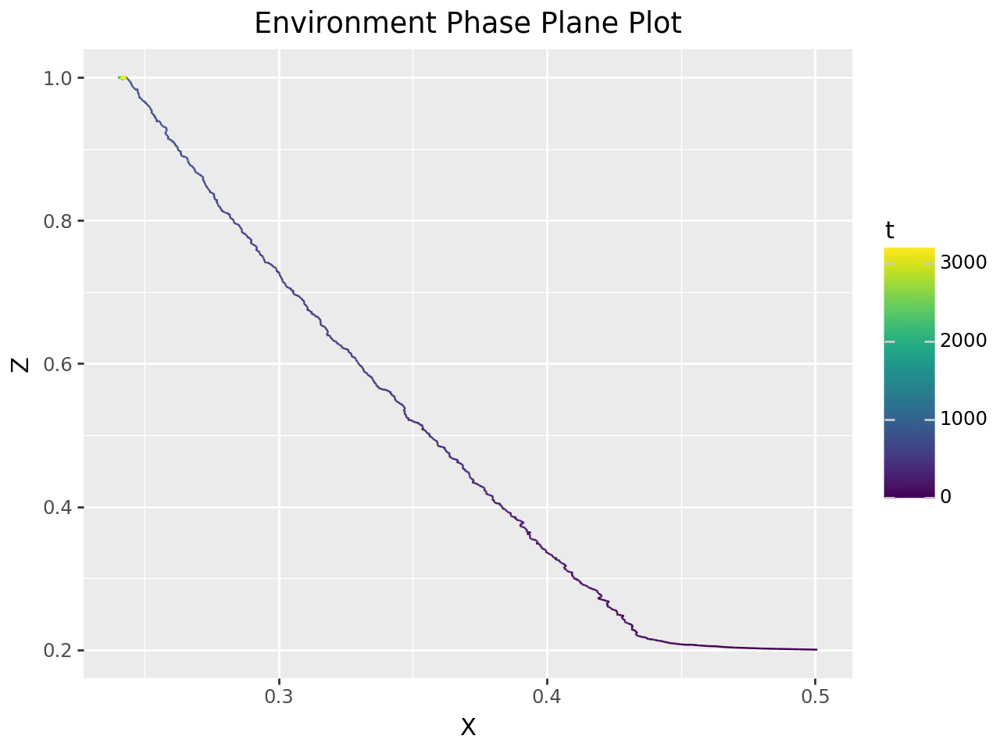

Salmon Final Population: 0.24
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.32
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.24
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.23



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.010000000000000009


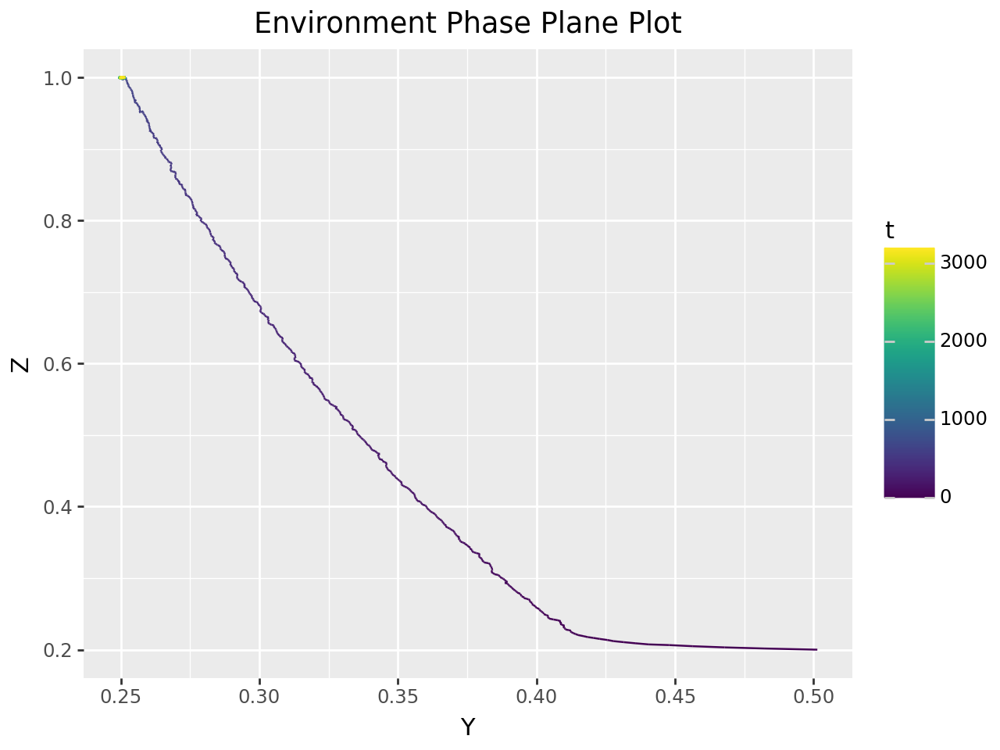

Salmon Final Population: 0.20
Lamprey Final Population: 0.25
Pinniped Final Population: 1.00

Salmon Mean Population: 0.21
Lamprey Mean Population: 0.26
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.18



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.26


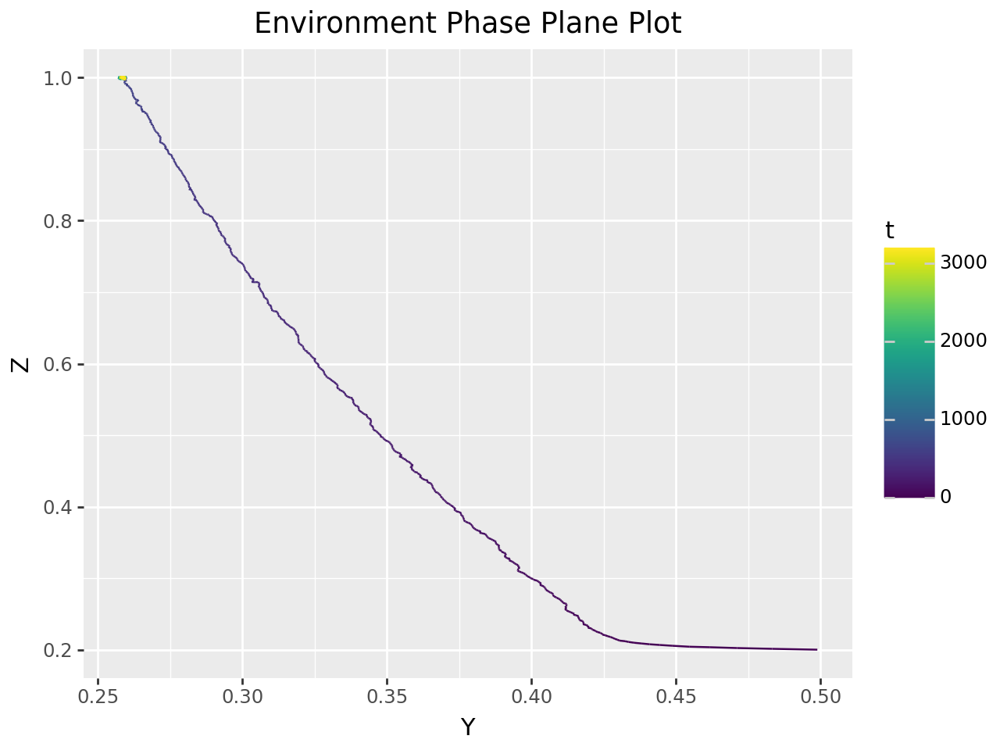

Salmon Final Population: 0.20
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.51


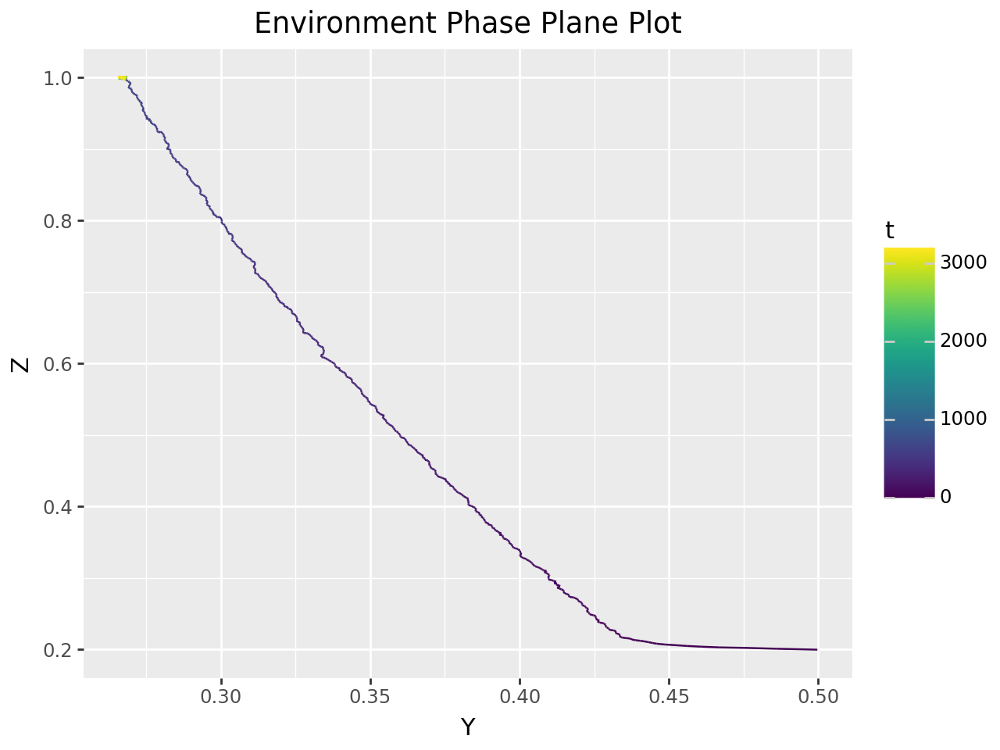

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.010000000000000009, Lamprey Handling Time: 0.76


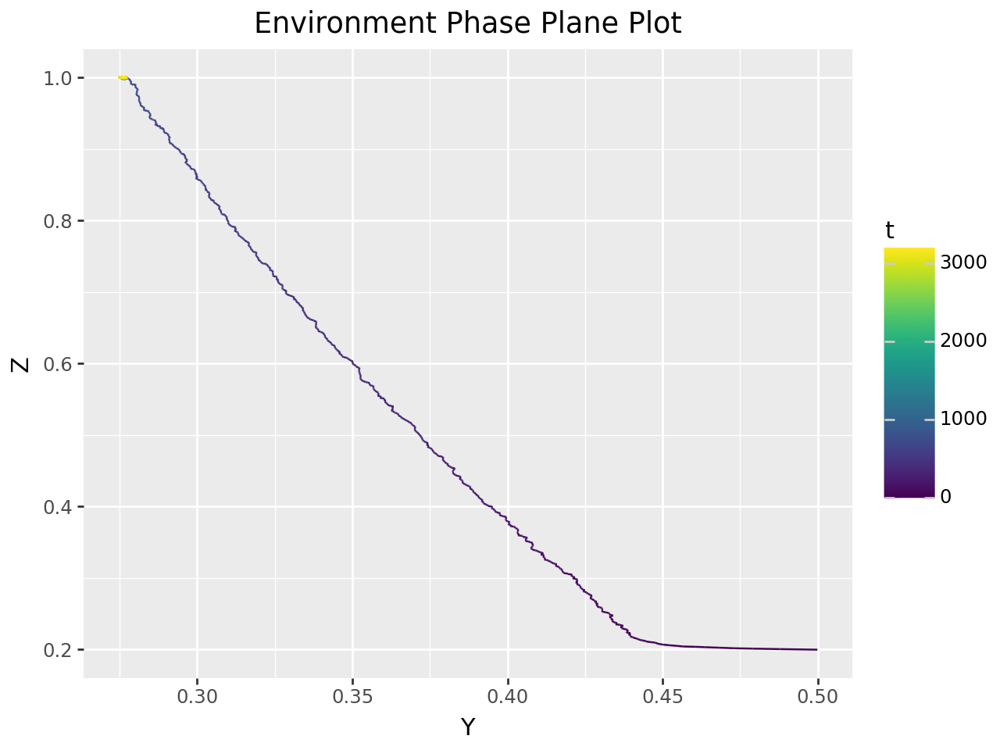

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.010000000000000009


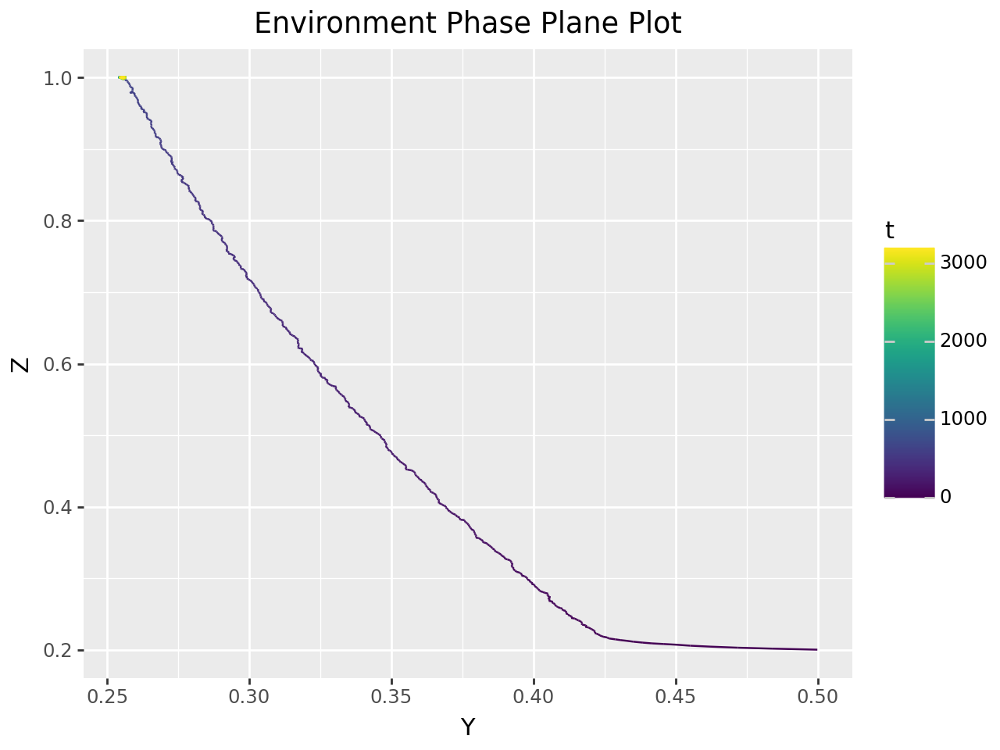

Salmon Final Population: 0.20
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.22
Lamprey Mean Population: 0.27
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.20
Lamprey Min Population: 0.25
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.26


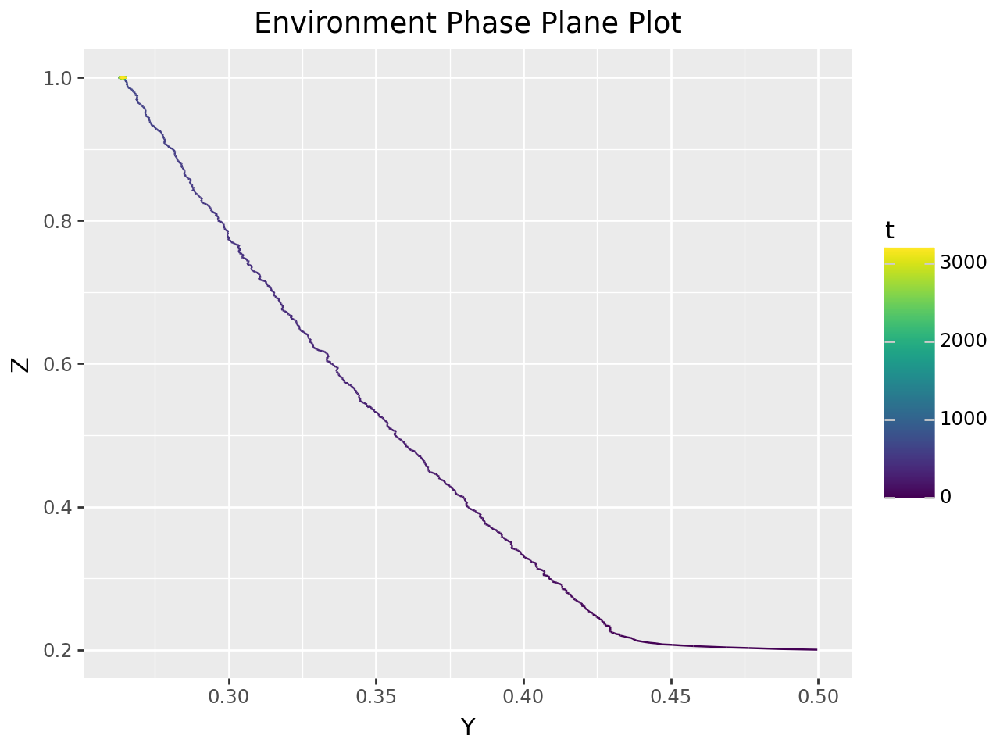

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.51


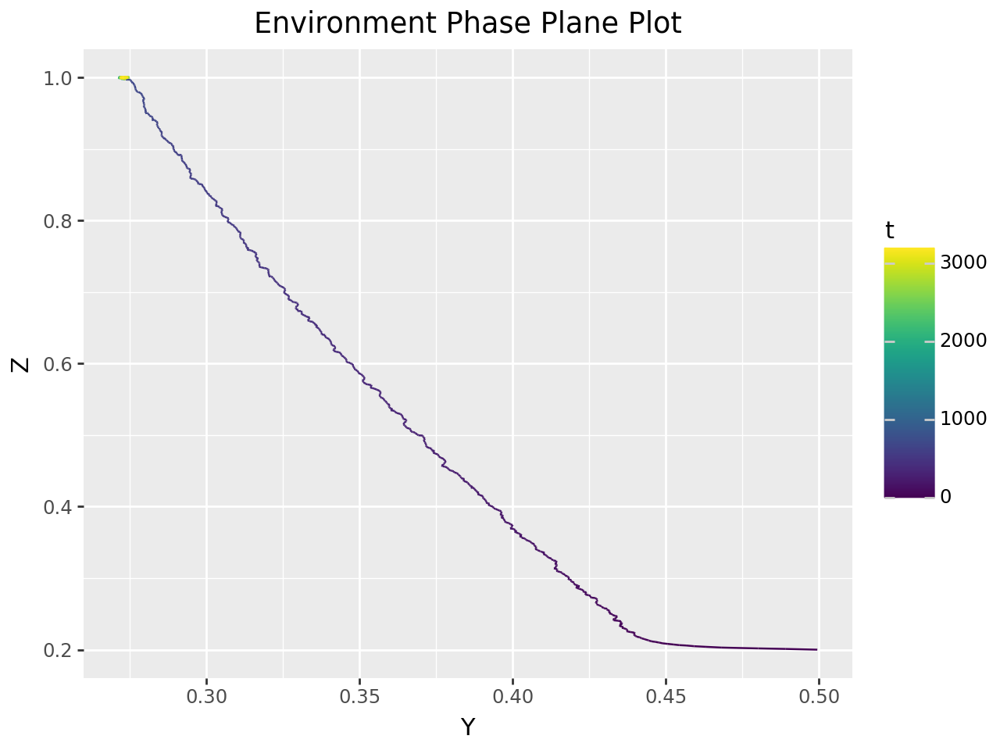

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.26, Lamprey Handling Time: 0.76


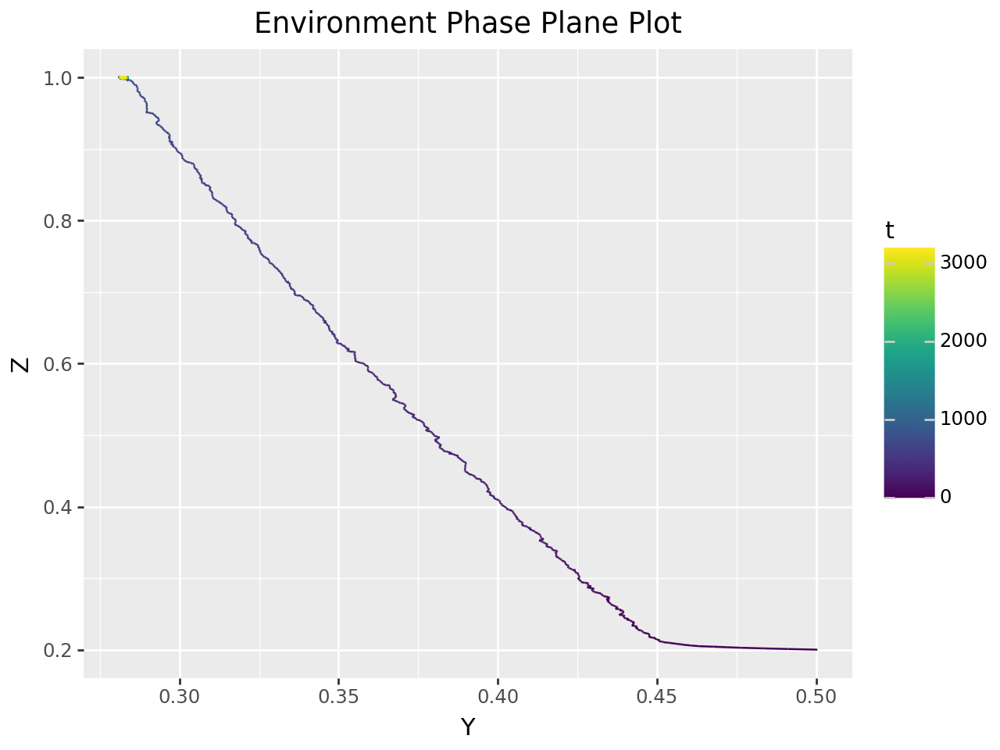

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.22



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.010000000000000009


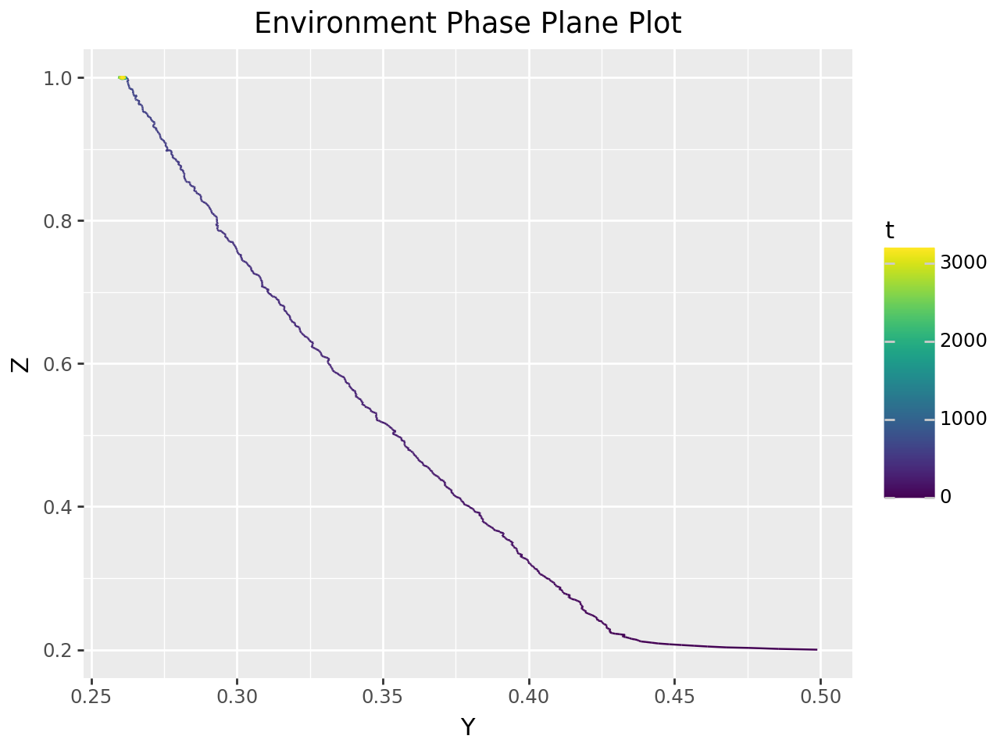

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.26


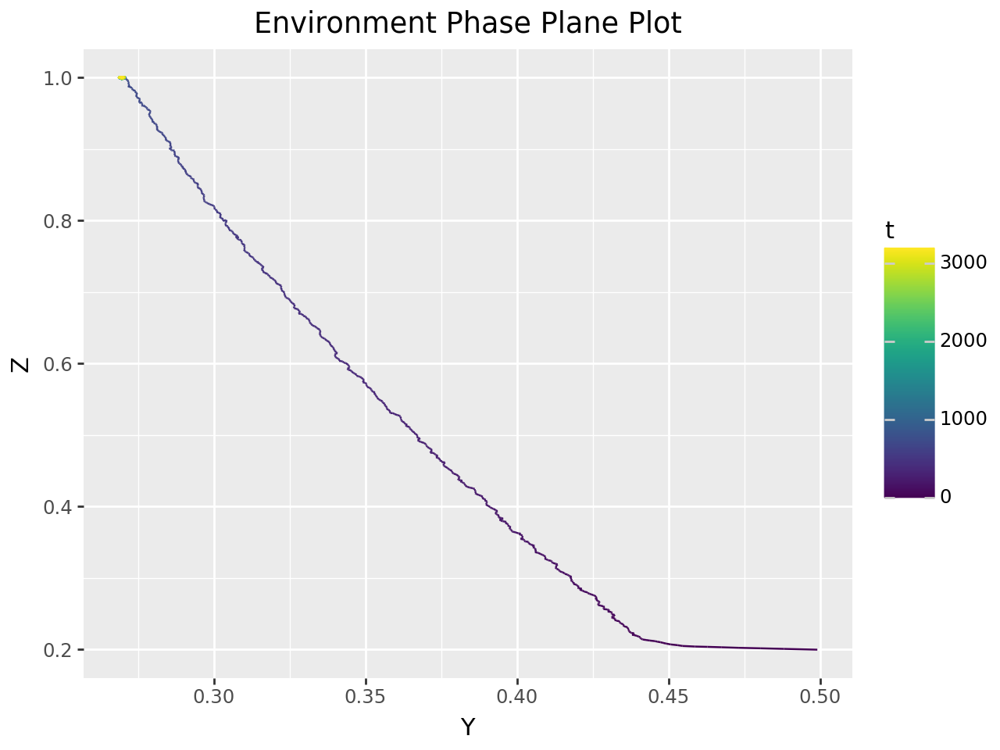

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.51


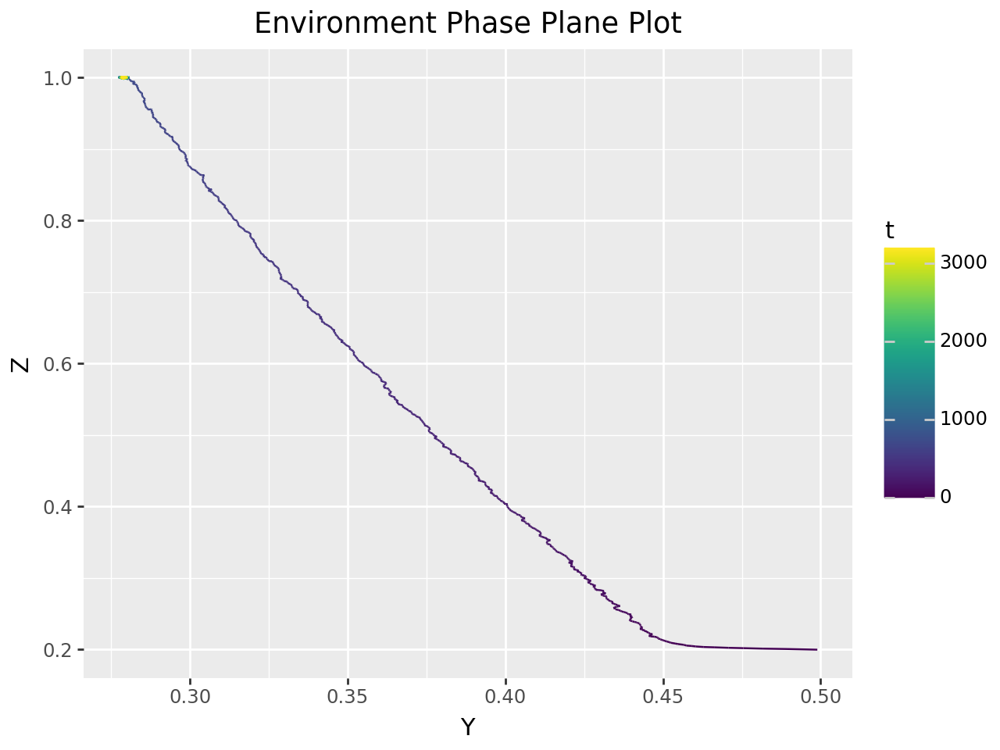

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.51, Lamprey Handling Time: 0.76


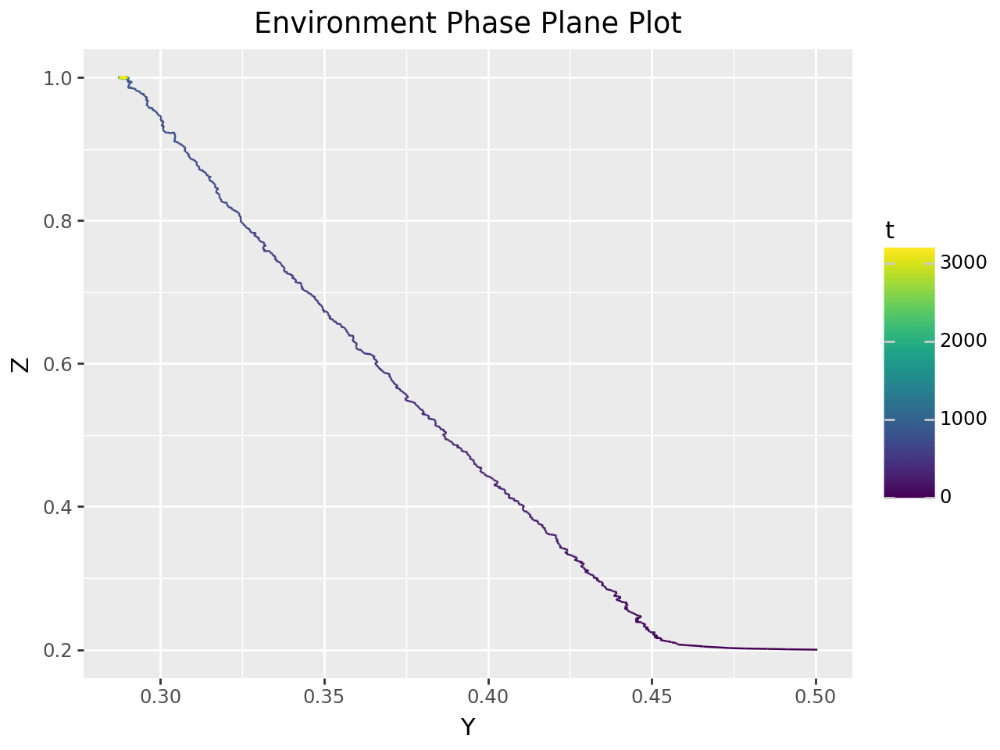

Salmon Final Population: 0.23
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.010000000000000009


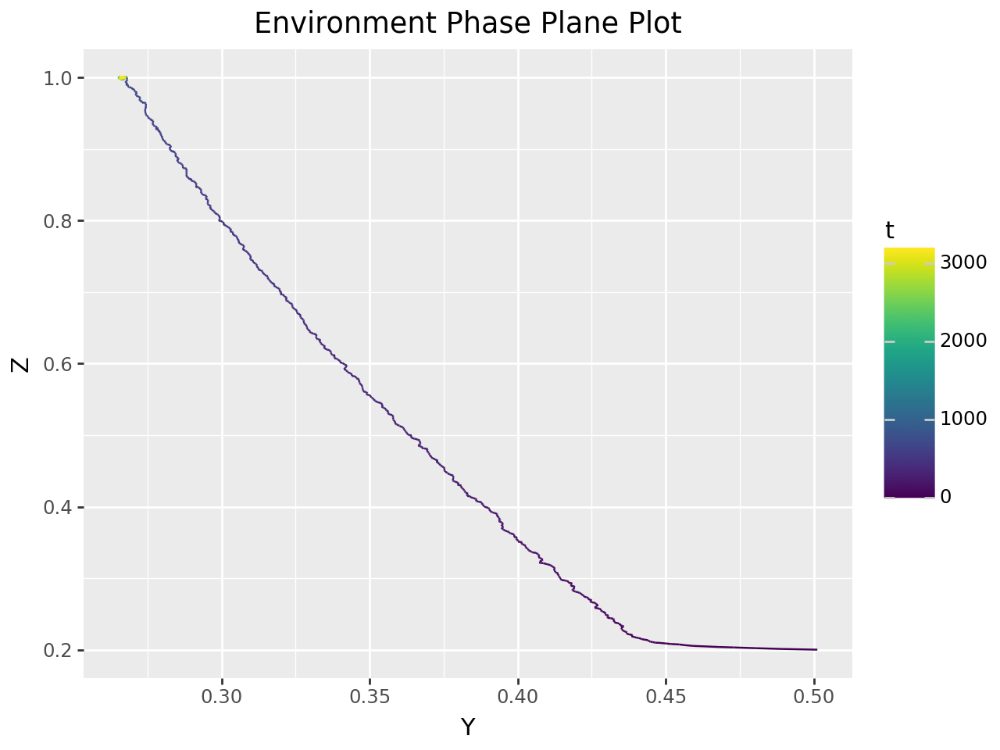

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.26


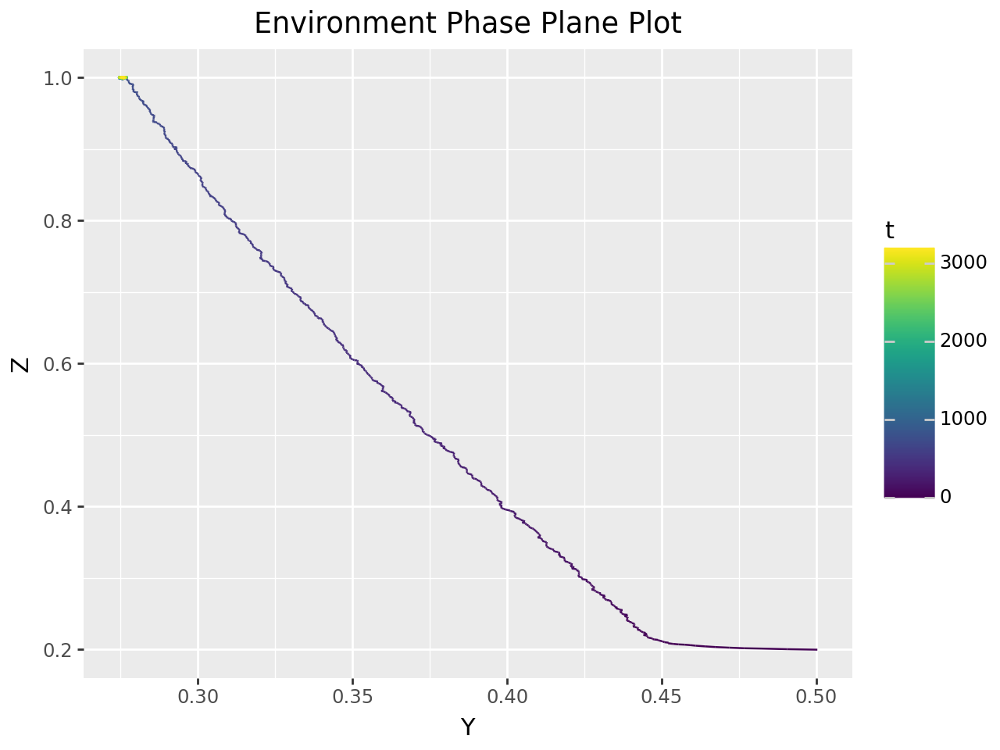

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.51


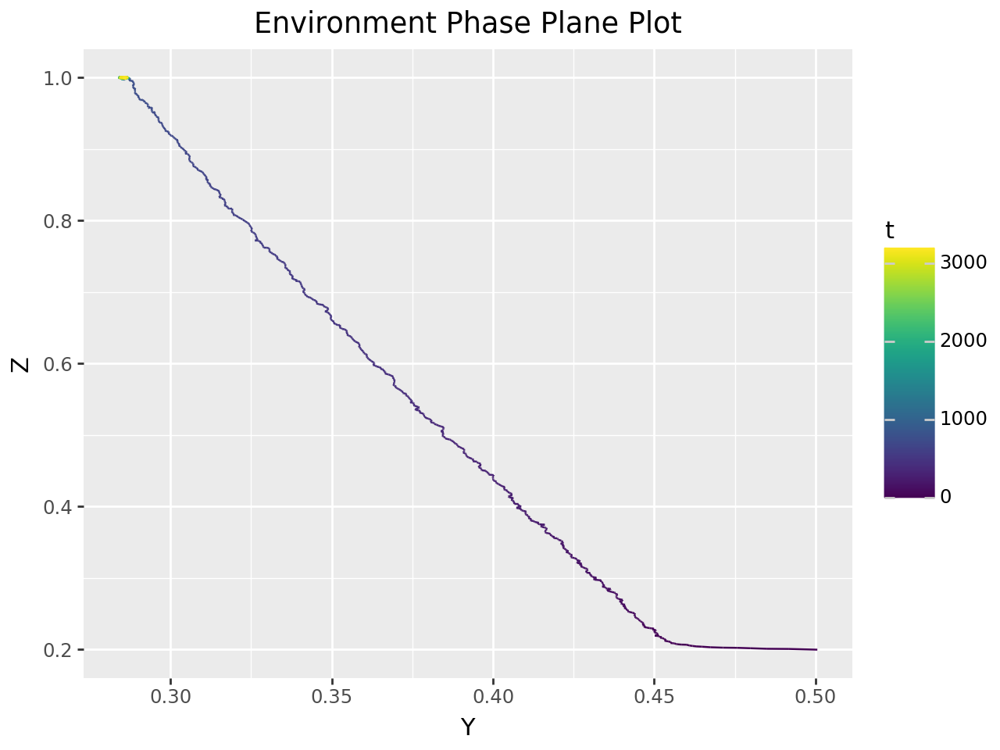

Salmon Final Population: 0.23
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22



Salmon Handling Time: 0.76, Lamprey Handling Time: 0.76


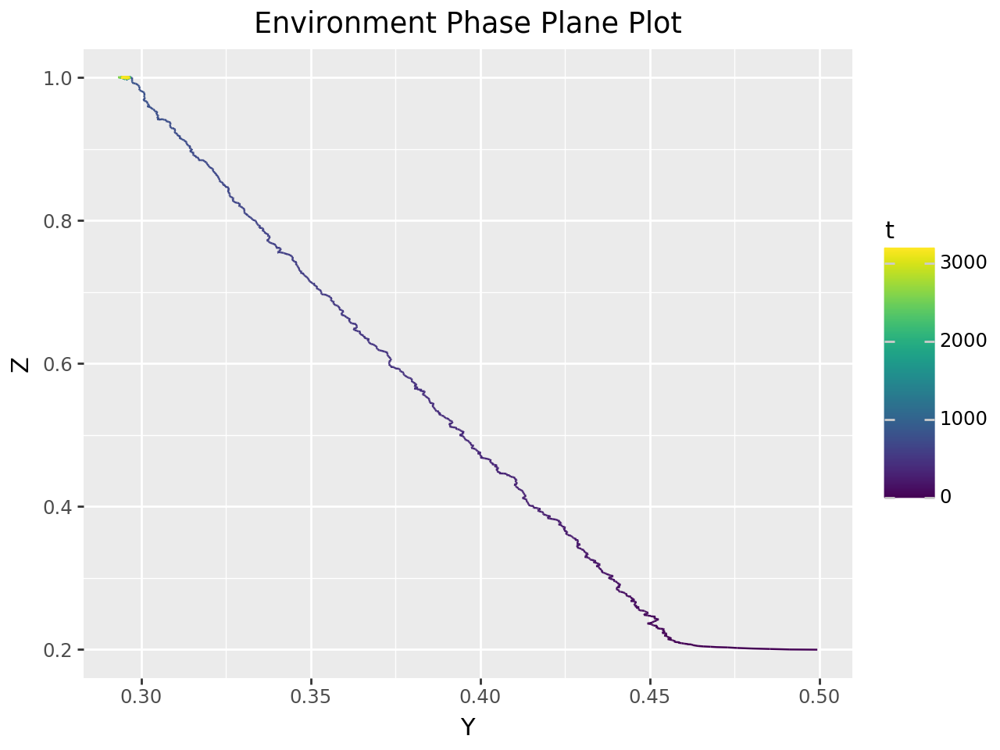

Salmon Final Population: 0.24
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.32
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.24
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.23





In [ ]:
simulate_param_changes(n_timesteps, hv_increment_range, "h", high_alpha=False, plot_funcs=(False, True), focus=("X", "Y"))
simulate_param_changes(n_timesteps, hv_increment_range, "h", high_alpha=False, plot_funcs=(False, True), focus=("X", "Z"))
simulate_param_changes(n_timesteps, hv_increment_range, "h", high_alpha=False, plot_funcs=(False, True), focus=("Y", "Z"))

Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.010000000000000009


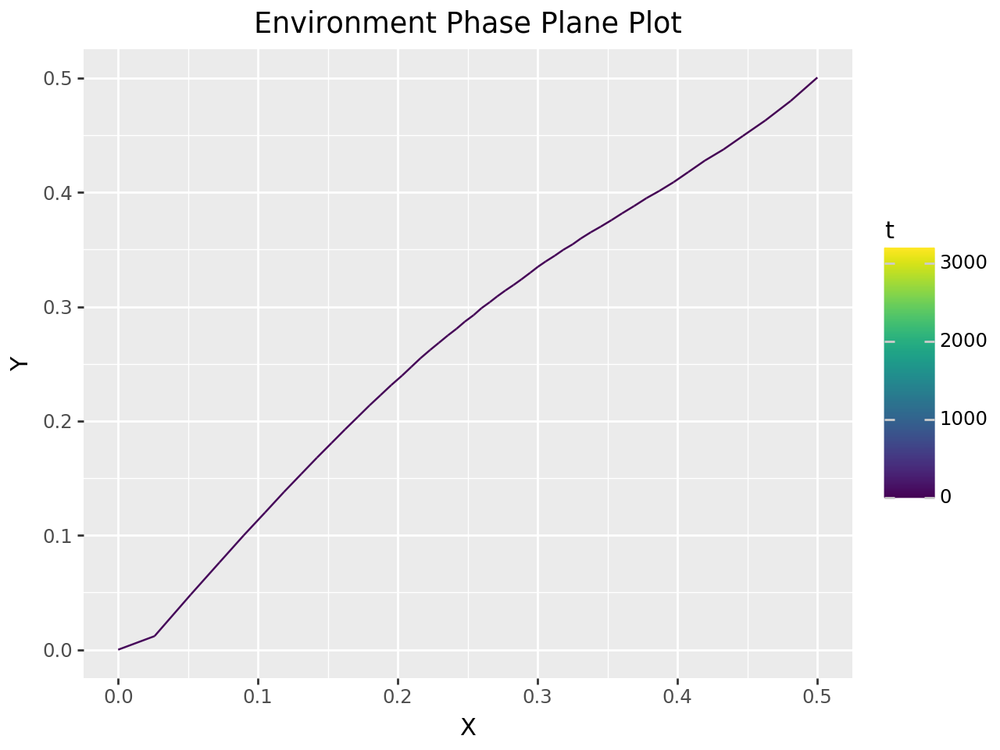

Salmon Final Population: 0.00
Lamprey Final Population: 0.00
Pinniped Final Population: 0.01

Salmon Mean Population: 0.00
Lamprey Mean Population: 0.00
Pinniped Mean Population: 0.09

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.31

Salmon Min Population: 0.00
Lamprey Min Population: 0.00
Pinniped Min Population: 0.01

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.01

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.08



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.26


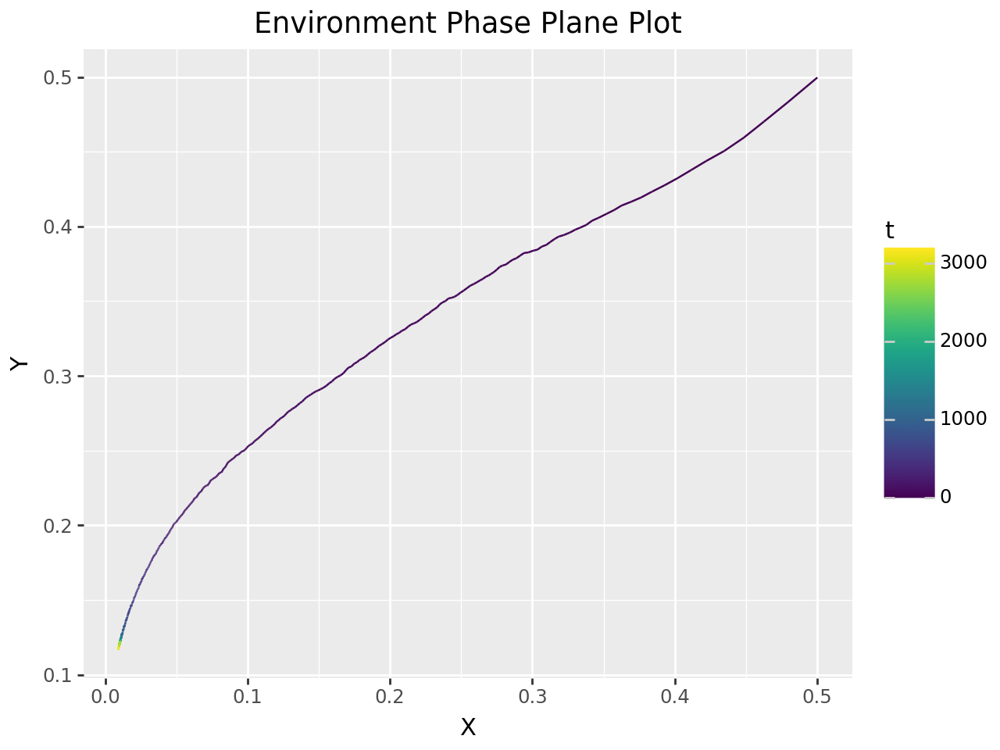

Salmon Final Population: 0.01
Lamprey Final Population: 0.12
Pinniped Final Population: 0.97

Salmon Mean Population: 0.02
Lamprey Mean Population: 0.14
Pinniped Mean Population: 0.85

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.98

Salmon Min Population: 0.01
Lamprey Min Population: 0.12
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.16



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.51


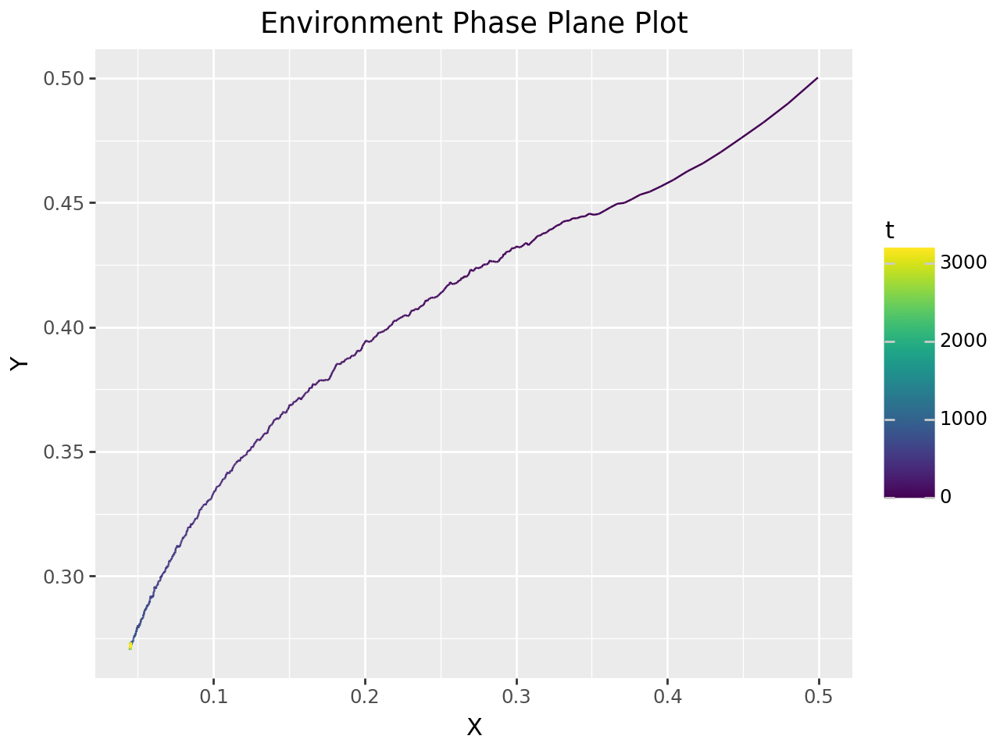

Salmon Final Population: 0.05
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.07
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.04
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.76


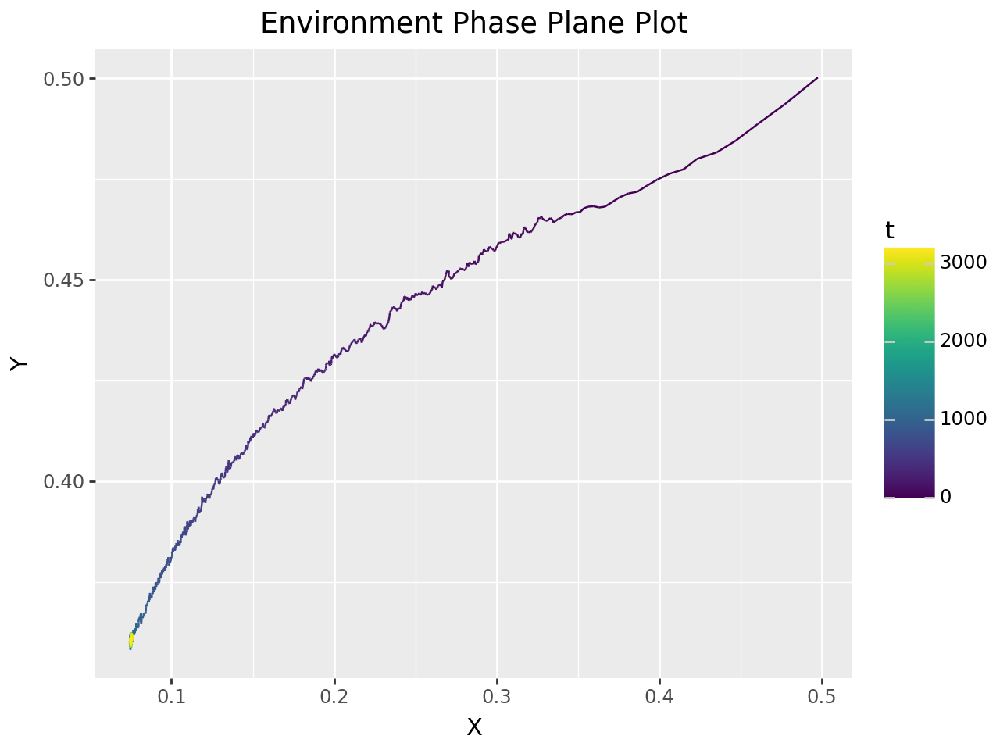

Salmon Final Population: 0.08
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.10
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.07
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.03
Pinniped Population SD: 0.21



Salmon Velocity: 0.26, Lamprey Velocity: 0.010000000000000009


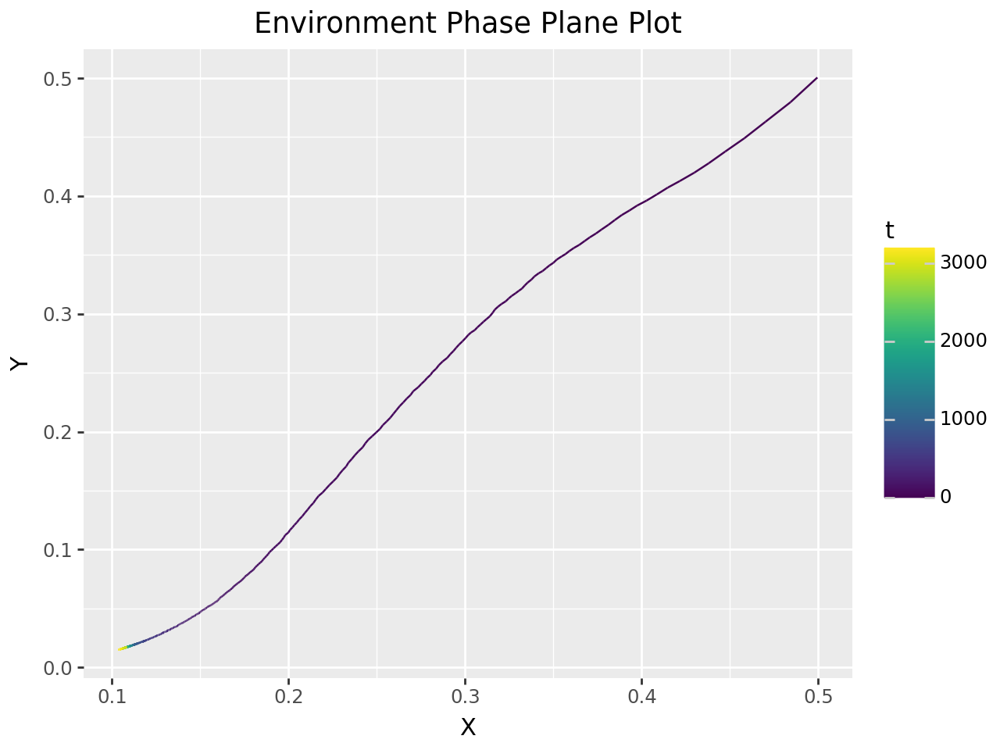

Salmon Final Population: 0.10
Lamprey Final Population: 0.02
Pinniped Final Population: 0.72

Salmon Mean Population: 0.12
Lamprey Mean Population: 0.03
Pinniped Mean Population: 0.65

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.73

Salmon Min Population: 0.10
Lamprey Min Population: 0.01
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.01

Salmon Population SD: 0.04
Lamprey Population SD: 0.05
Pinniped Population SD: 0.09



Salmon Velocity: 0.26, Lamprey Velocity: 0.26


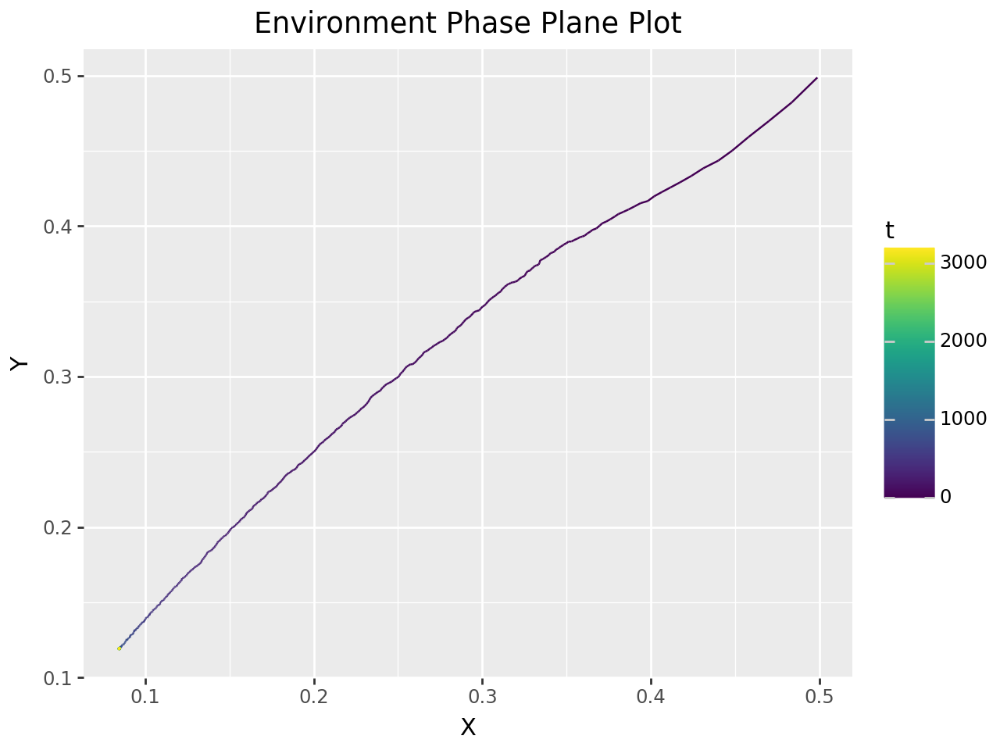

Salmon Final Population: 0.08
Lamprey Final Population: 0.12
Pinniped Final Population: 1.00

Salmon Mean Population: 0.10
Lamprey Mean Population: 0.14
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.08
Lamprey Min Population: 0.12
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.18



Salmon Velocity: 0.26, Lamprey Velocity: 0.51


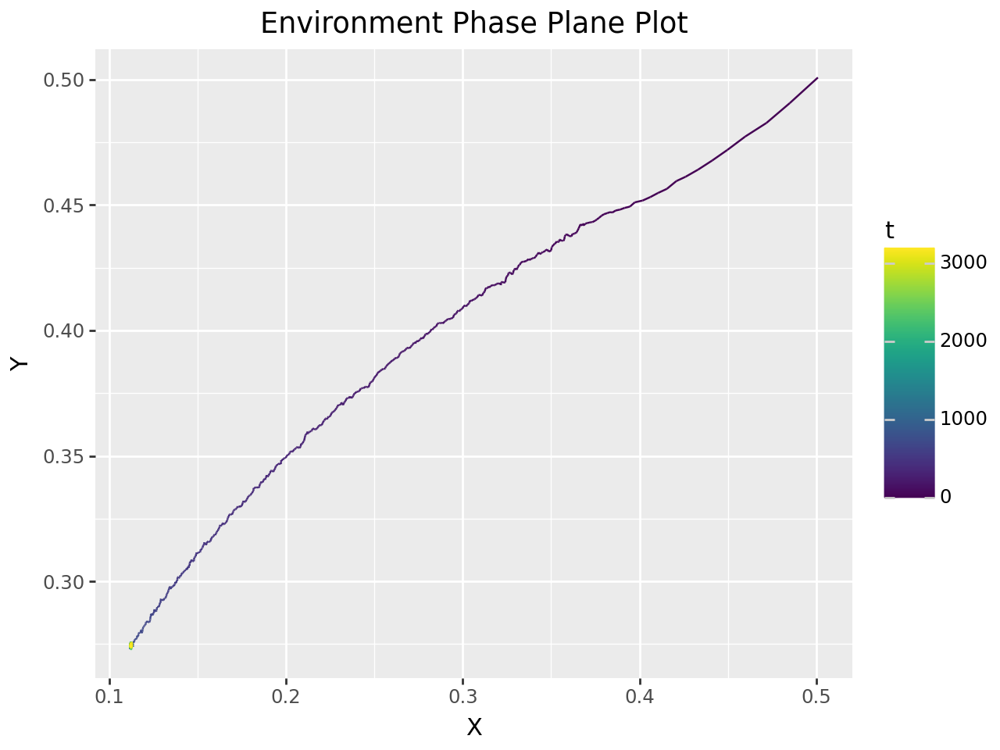

Salmon Final Population: 0.11
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.14
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.11
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Velocity: 0.26, Lamprey Velocity: 0.76


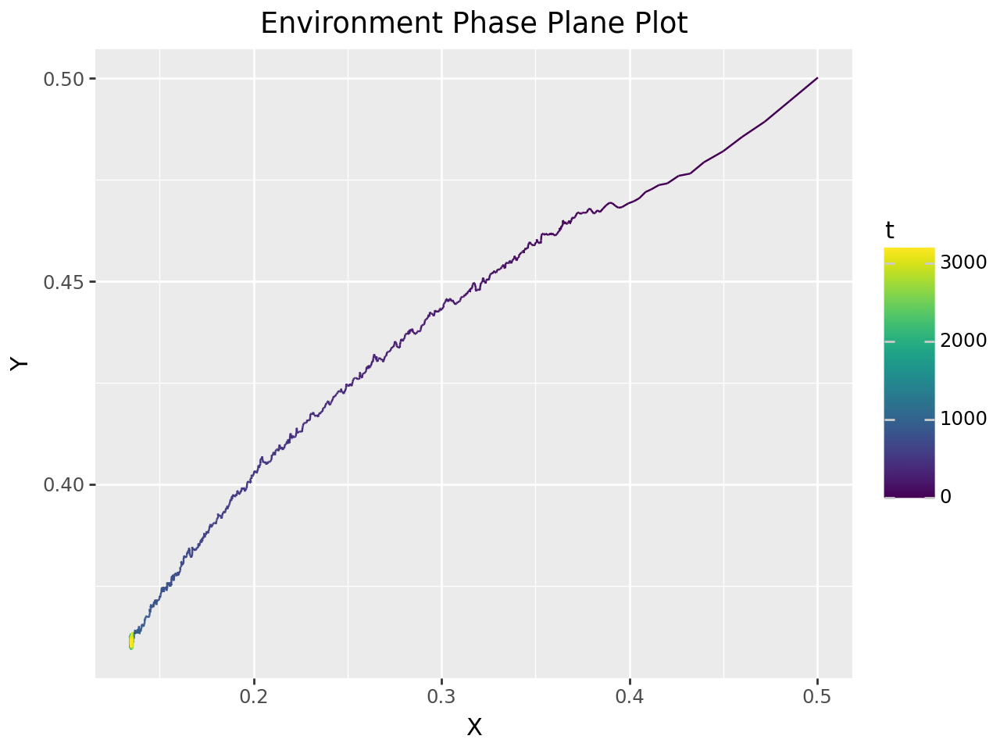

Salmon Final Population: 0.13
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.16
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.13
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.06
Lamprey Population SD: 0.03
Pinniped Population SD: 0.22



Salmon Velocity: 0.51, Lamprey Velocity: 0.010000000000000009


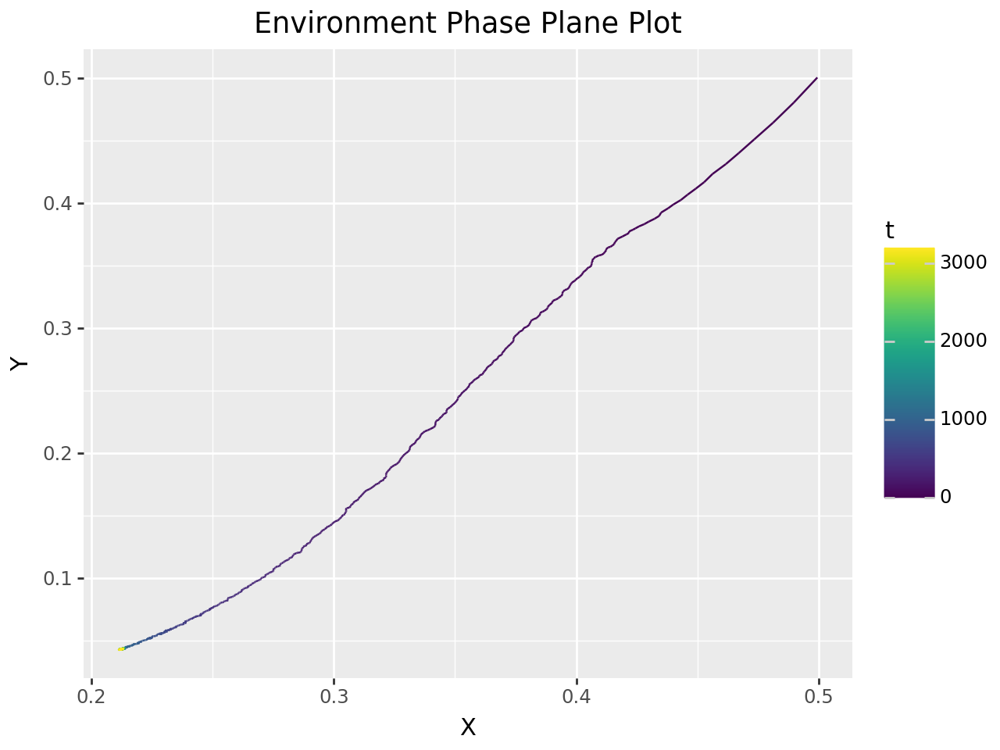

Salmon Final Population: 0.21
Lamprey Final Population: 0.04
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.07
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.04
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.06
Pinniped Population SD: 0.18



Salmon Velocity: 0.51, Lamprey Velocity: 0.26


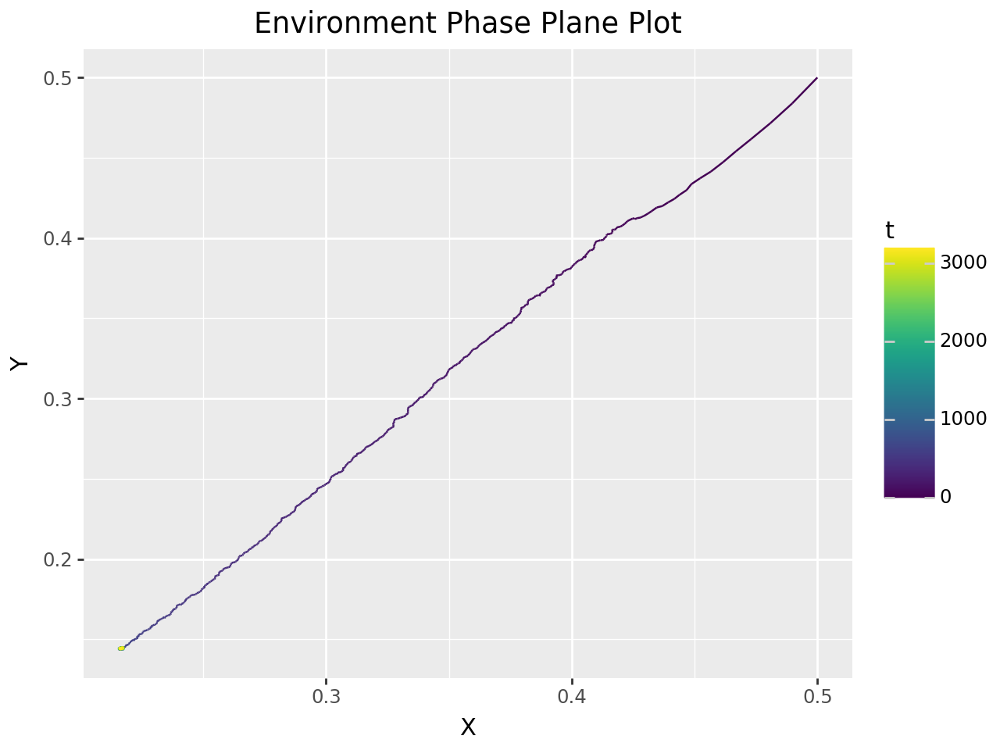

Salmon Final Population: 0.22
Lamprey Final Population: 0.14
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.17
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.14
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.06
Pinniped Population SD: 0.19



Salmon Velocity: 0.51, Lamprey Velocity: 0.51


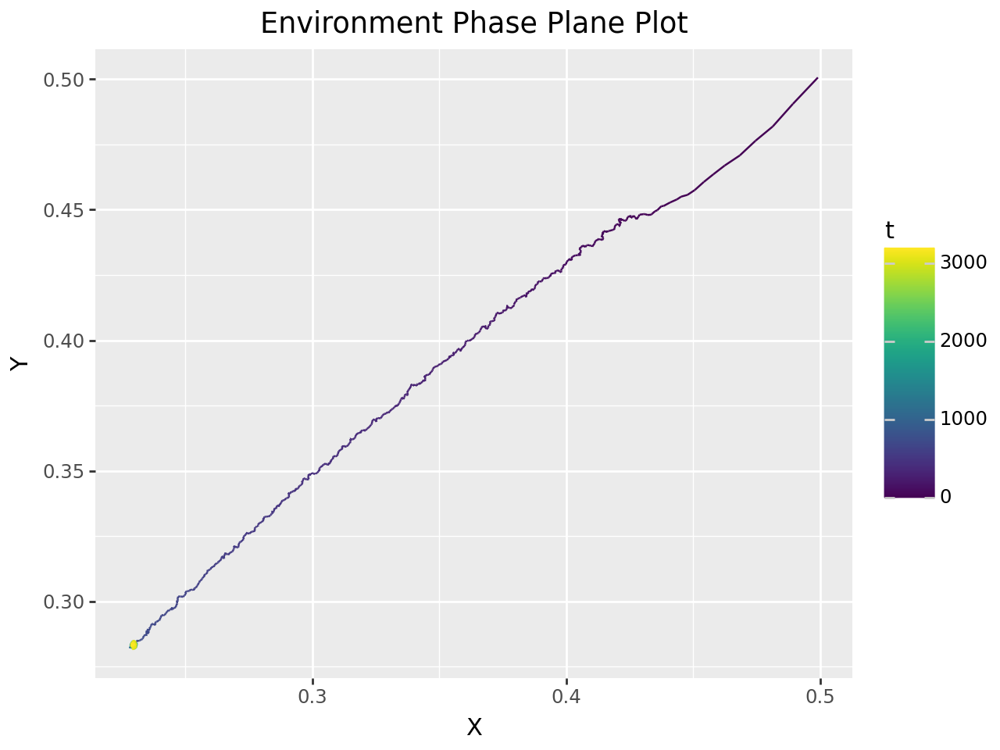

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Velocity: 0.51, Lamprey Velocity: 0.76


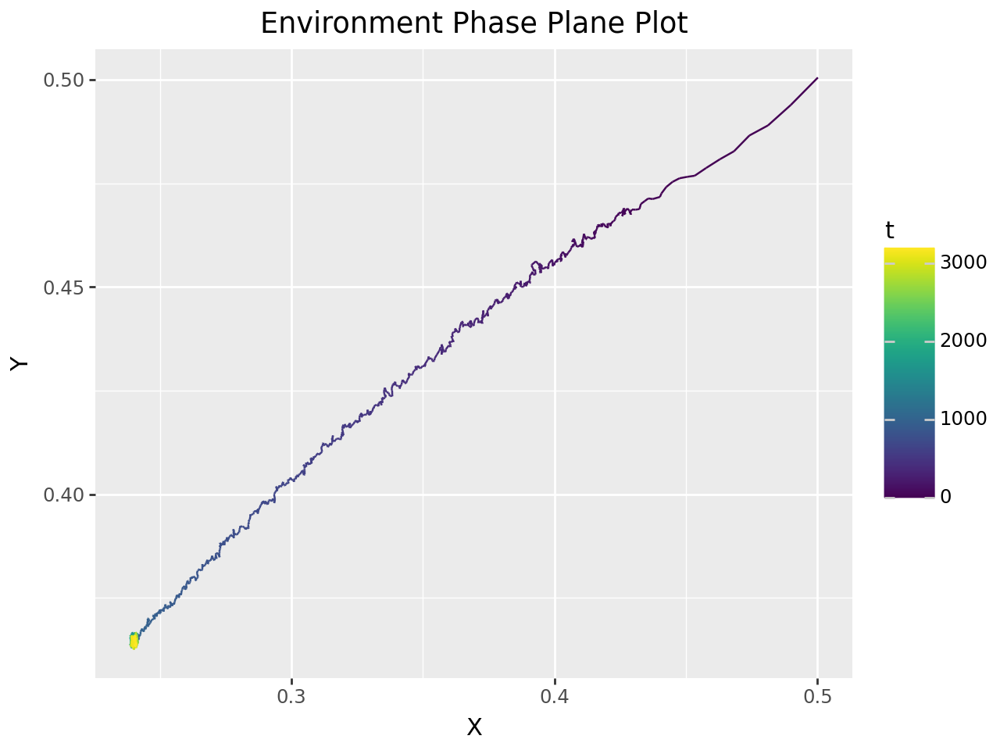

Salmon Final Population: 0.24
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.87

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.24
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.06

Salmon Population SD: 0.05
Lamprey Population SD: 0.03
Pinniped Population SD: 0.24



Salmon Velocity: 0.76, Lamprey Velocity: 0.010000000000000009


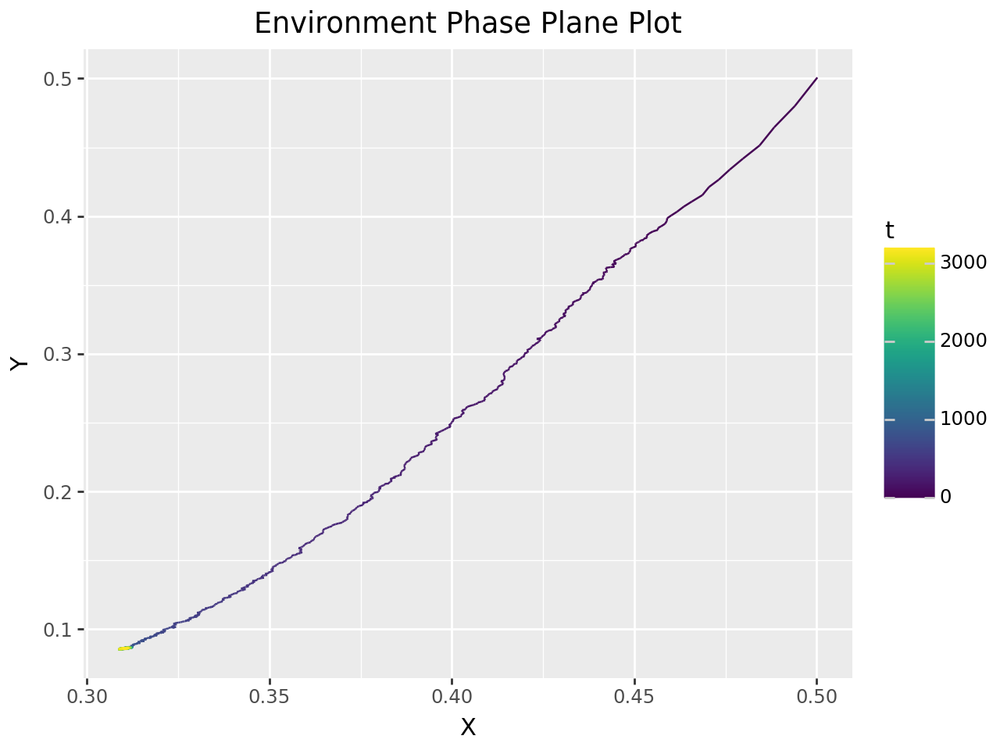

Salmon Final Population: 0.31
Lamprey Final Population: 0.09
Pinniped Final Population: 1.00

Salmon Mean Population: 0.32
Lamprey Mean Population: 0.11
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.31
Lamprey Min Population: 0.09
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.03
Lamprey Population SD: 0.07
Pinniped Population SD: 0.19



Salmon Velocity: 0.76, Lamprey Velocity: 0.26


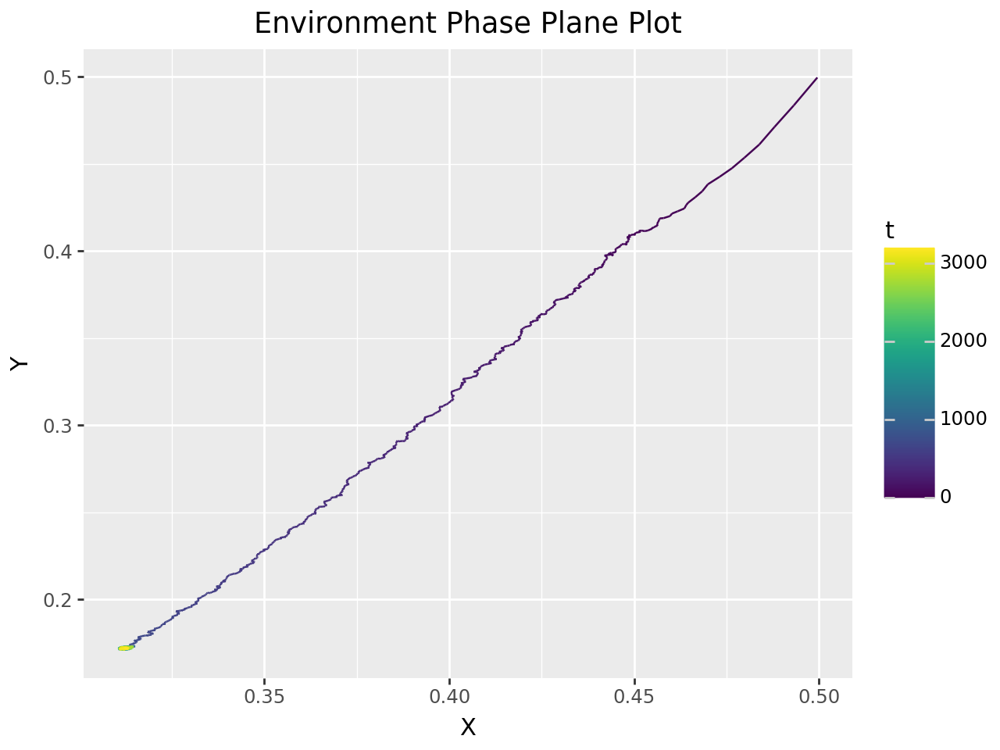

Salmon Final Population: 0.31
Lamprey Final Population: 0.17
Pinniped Final Population: 1.00

Salmon Mean Population: 0.33
Lamprey Mean Population: 0.20
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.31
Lamprey Min Population: 0.17
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.06
Pinniped Population SD: 0.21



Salmon Velocity: 0.76, Lamprey Velocity: 0.51


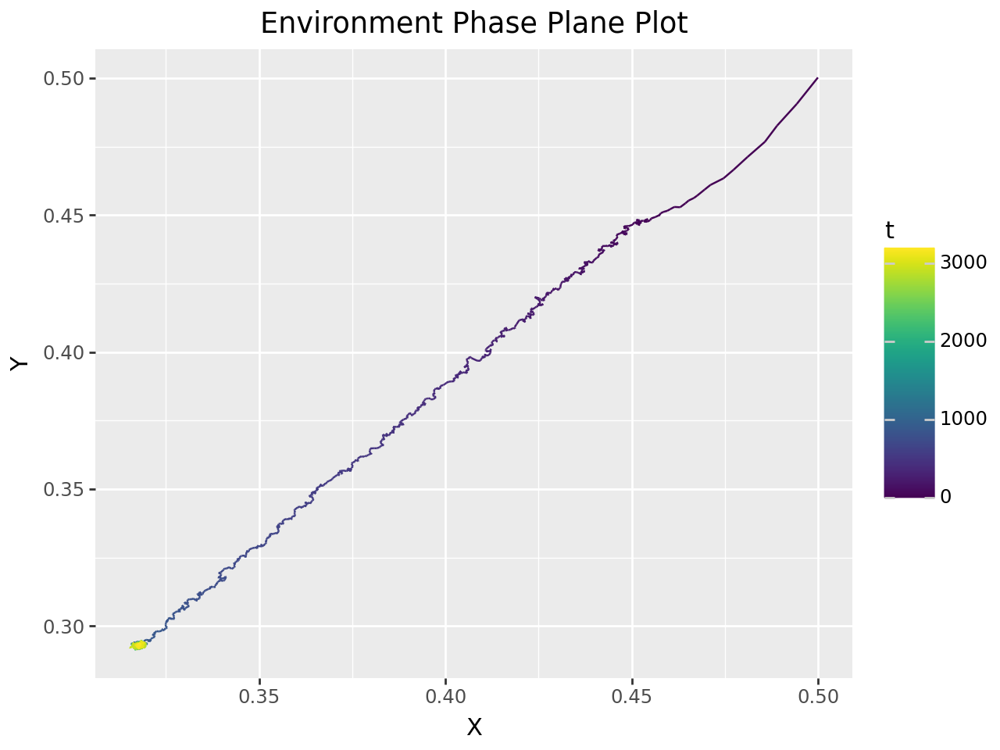

Salmon Final Population: 0.32
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.34
Lamprey Mean Population: 0.32
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.32
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.23



Salmon Velocity: 0.76, Lamprey Velocity: 0.76


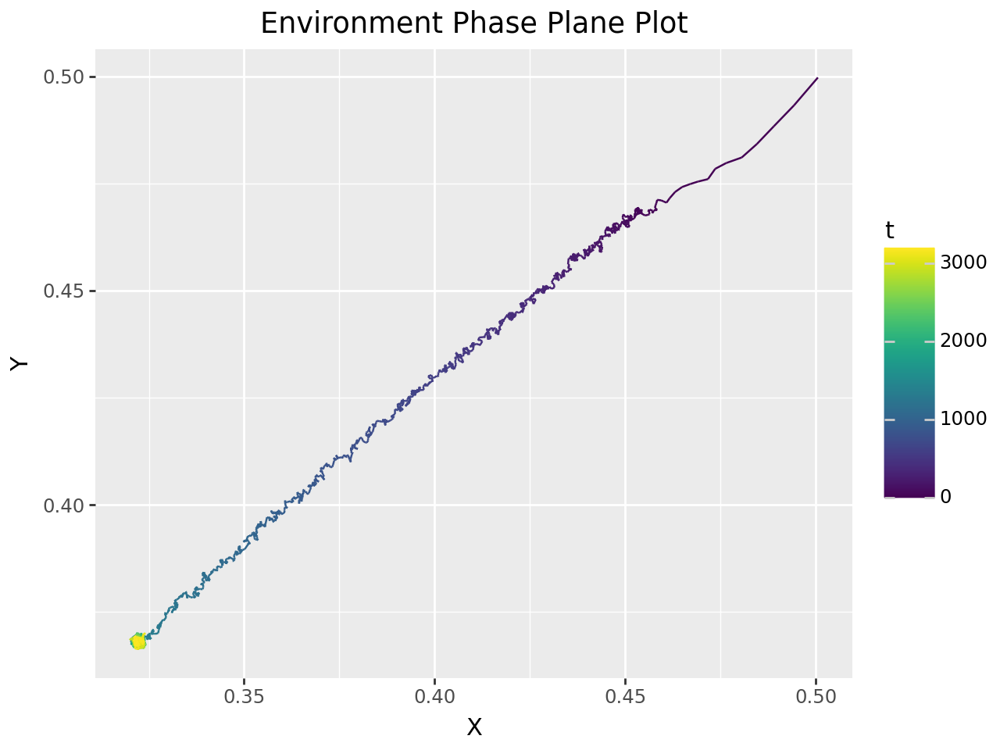

Salmon Final Population: 0.32
Lamprey Final Population: 0.37
Pinniped Final Population: 1.00

Salmon Mean Population: 0.35
Lamprey Mean Population: 0.39
Pinniped Mean Population: 0.82

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.32
Lamprey Min Population: 0.37
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.07

Salmon Population SD: 0.04
Lamprey Population SD: 0.03
Pinniped Population SD: 0.27



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.010000000000000009


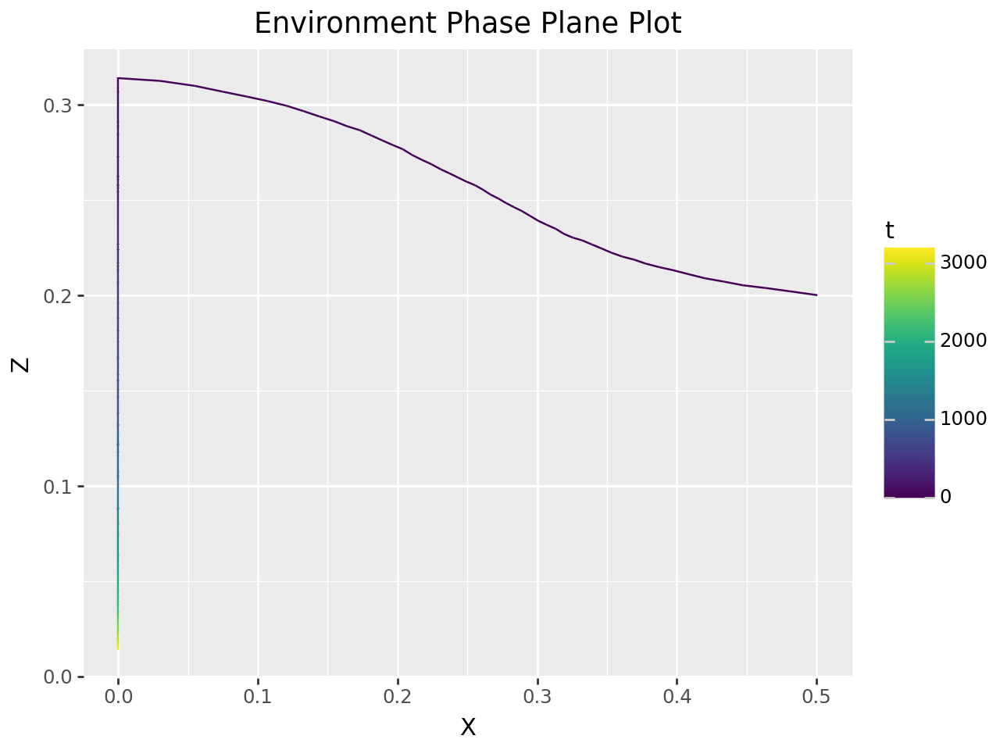

Salmon Final Population: 0.00
Lamprey Final Population: 0.00
Pinniped Final Population: 0.01

Salmon Mean Population: 0.00
Lamprey Mean Population: 0.00
Pinniped Mean Population: 0.10

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.31

Salmon Min Population: 0.00
Lamprey Min Population: 0.00
Pinniped Min Population: 0.01

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.01

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.08



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.26


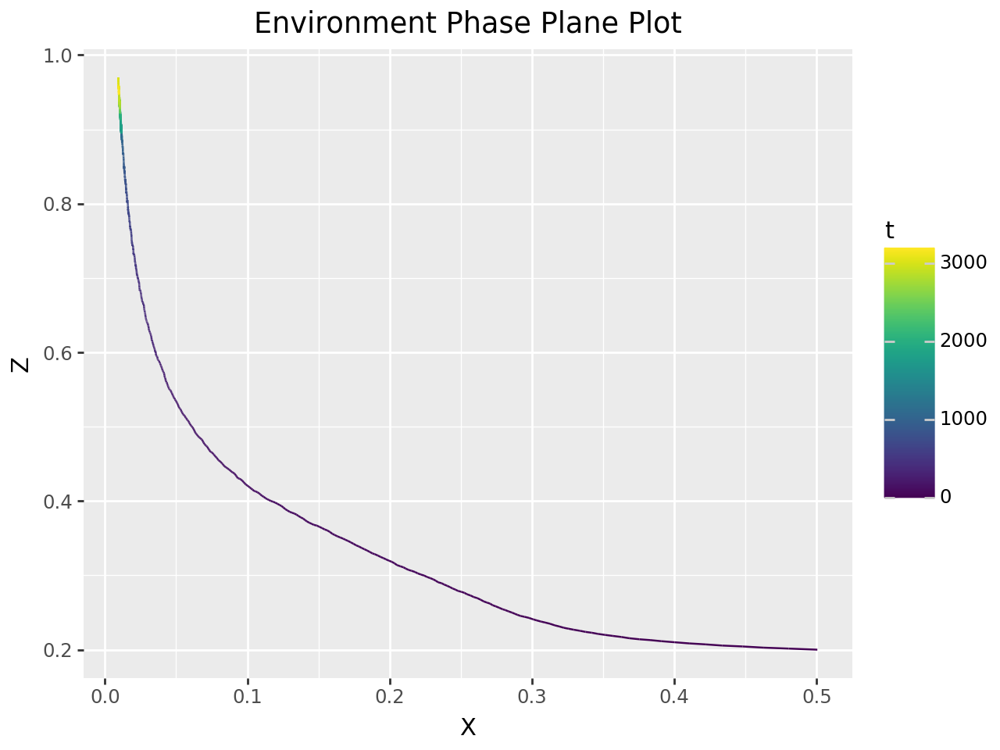

Salmon Final Population: 0.01
Lamprey Final Population: 0.12
Pinniped Final Population: 0.95

Salmon Mean Population: 0.02
Lamprey Mean Population: 0.14
Pinniped Mean Population: 0.84

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.97

Salmon Min Population: 0.01
Lamprey Min Population: 0.12
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.16



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.51


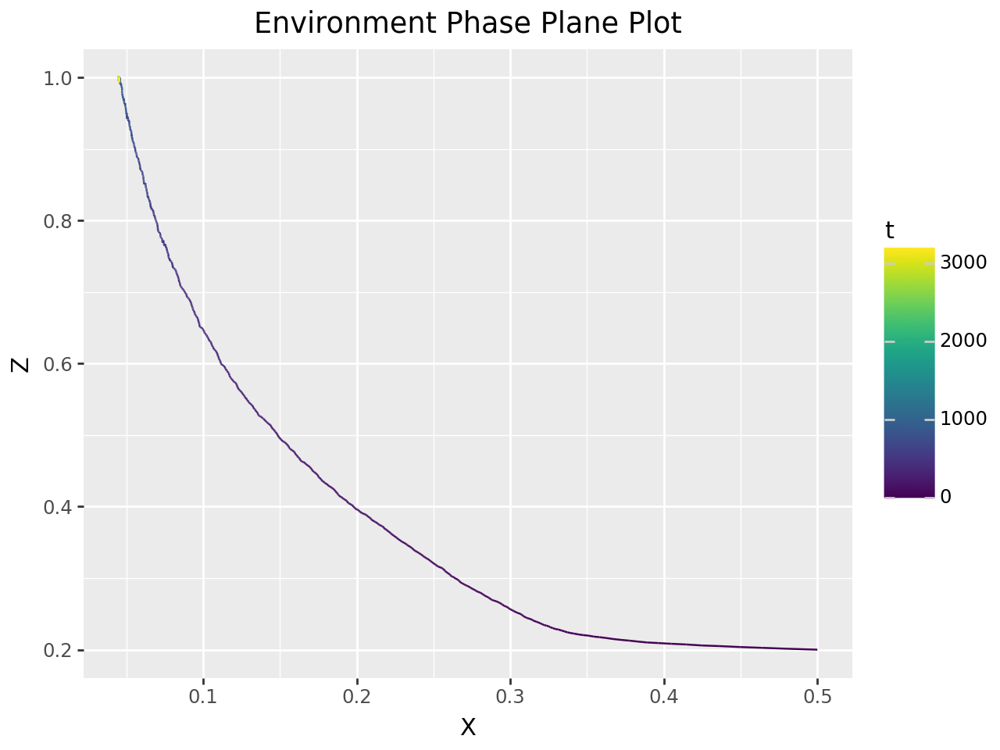

Salmon Final Population: 0.05
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.07
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.04
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.76


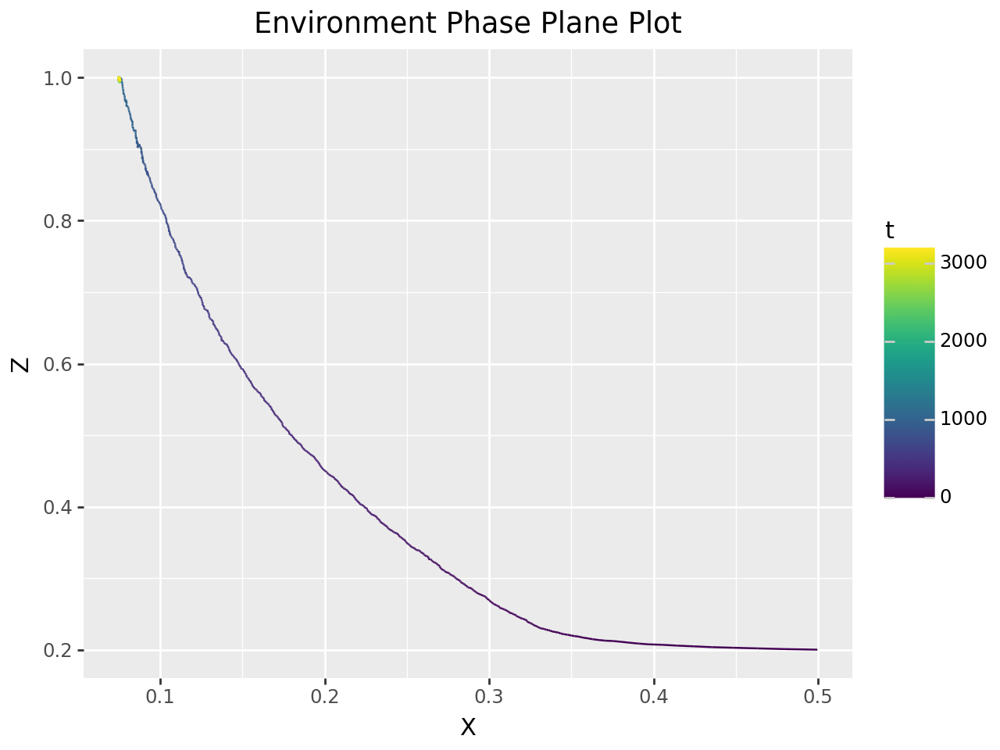

Salmon Final Population: 0.08
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.10
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.07
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.06
Lamprey Population SD: 0.03
Pinniped Population SD: 0.22



Salmon Velocity: 0.26, Lamprey Velocity: 0.010000000000000009


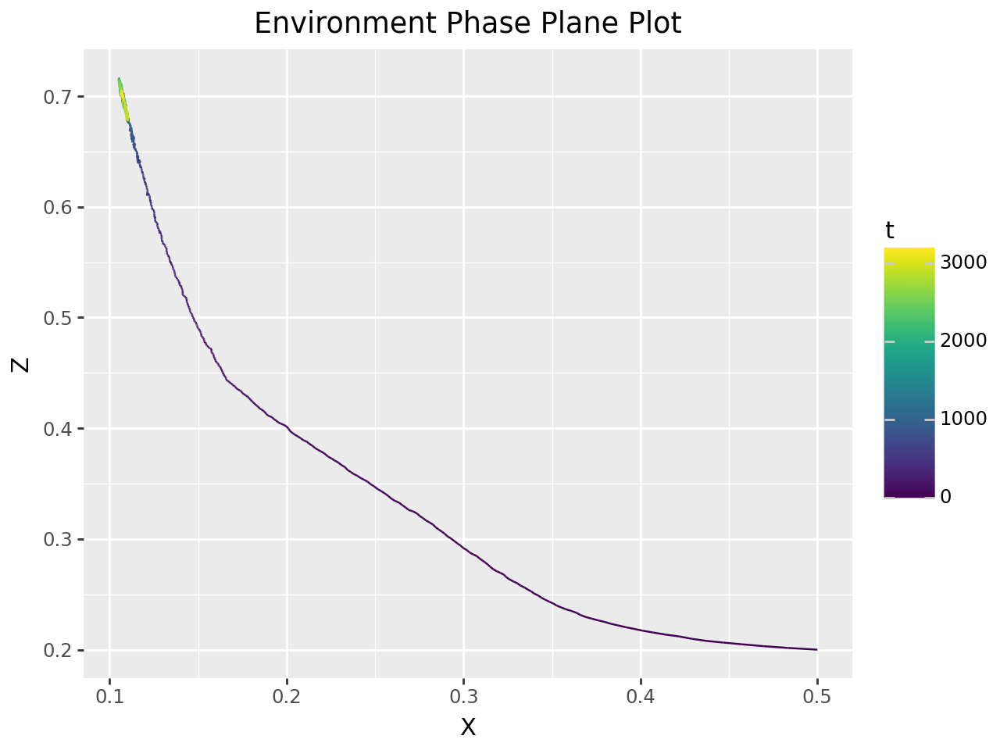

Salmon Final Population: 0.11
Lamprey Final Population: 0.02
Pinniped Final Population: 0.70

Salmon Mean Population: 0.12
Lamprey Mean Population: 0.03
Pinniped Mean Population: 0.66

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.72

Salmon Min Population: 0.10
Lamprey Min Population: 0.02
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.01

Salmon Population SD: 0.04
Lamprey Population SD: 0.05
Pinniped Population SD: 0.09



Salmon Velocity: 0.26, Lamprey Velocity: 0.26


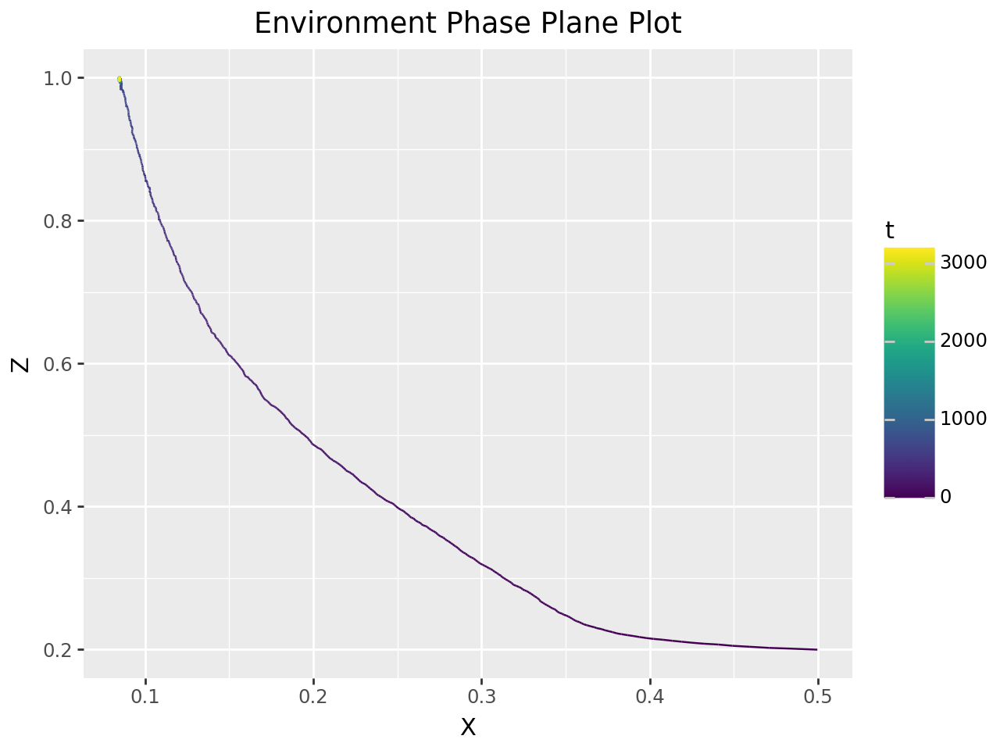

Salmon Final Population: 0.08
Lamprey Final Population: 0.12
Pinniped Final Population: 1.00

Salmon Mean Population: 0.10
Lamprey Mean Population: 0.14
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.08
Lamprey Min Population: 0.12
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.18



Salmon Velocity: 0.26, Lamprey Velocity: 0.51


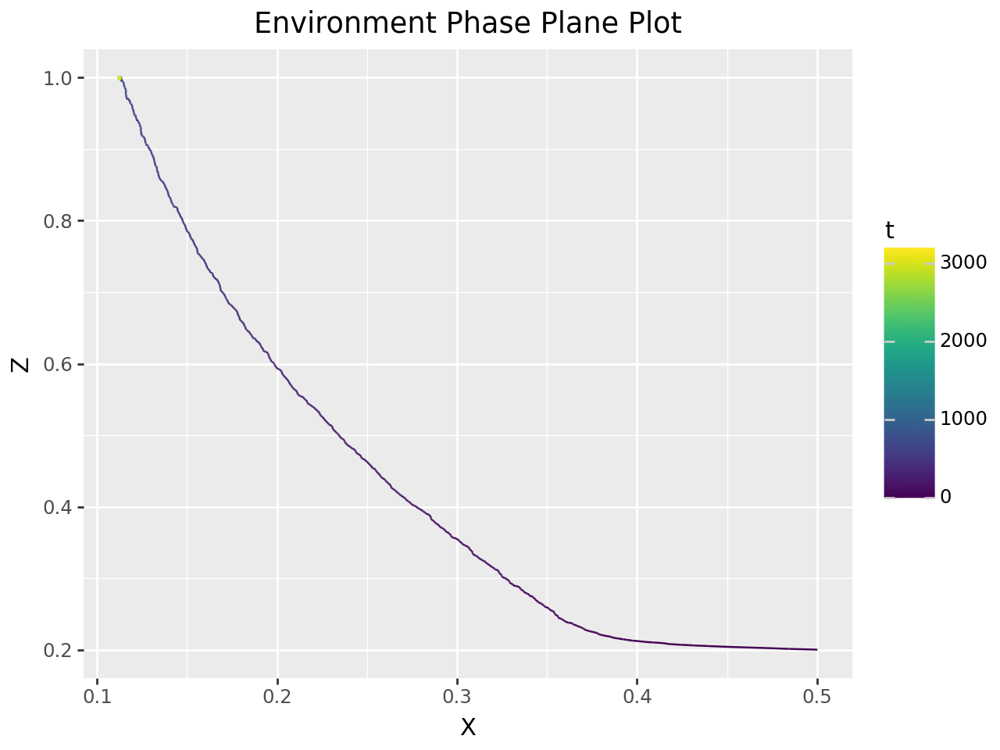

Salmon Final Population: 0.11
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.14
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.11
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Velocity: 0.26, Lamprey Velocity: 0.76


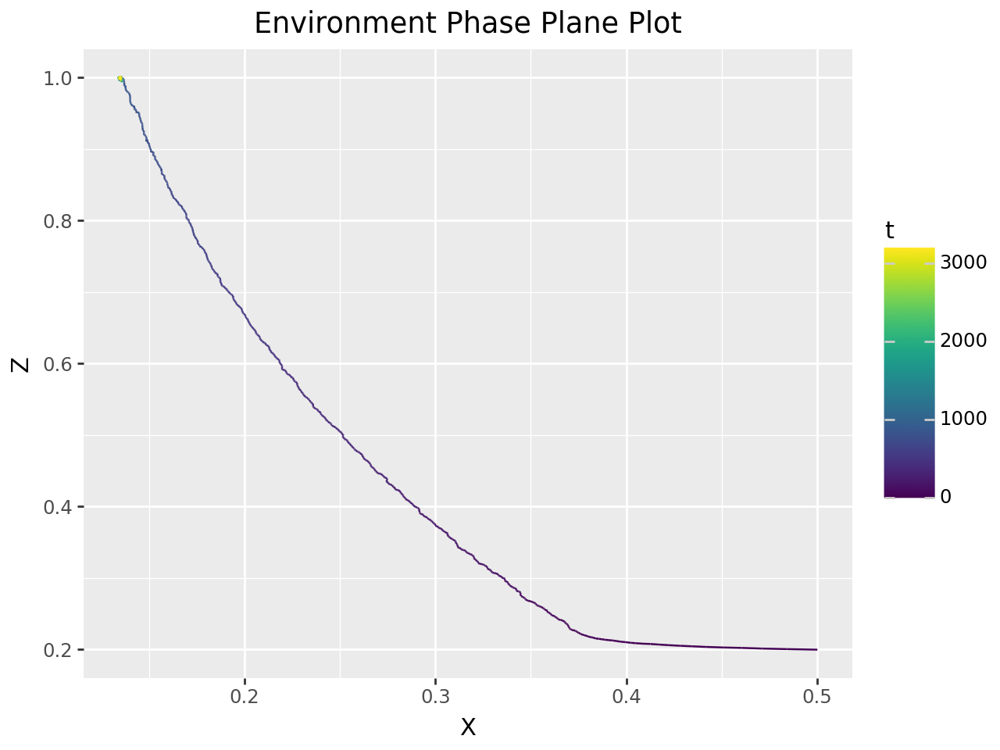

Salmon Final Population: 0.13
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.16
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.13
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.06
Lamprey Population SD: 0.03
Pinniped Population SD: 0.22



Salmon Velocity: 0.51, Lamprey Velocity: 0.010000000000000009


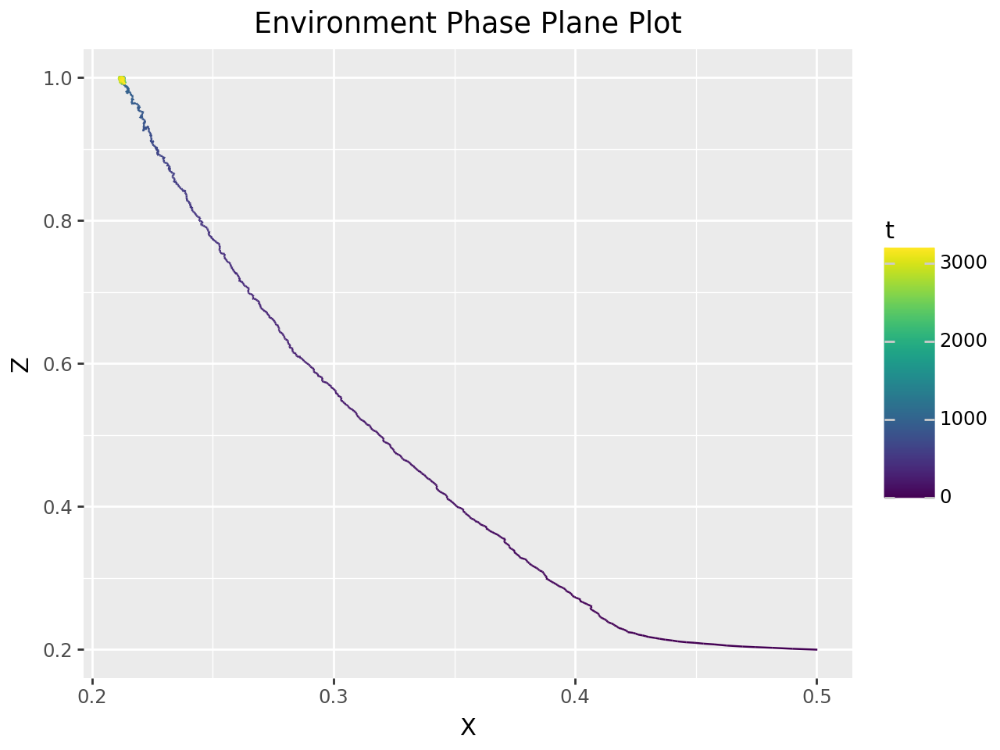

Salmon Final Population: 0.21
Lamprey Final Population: 0.04
Pinniped Final Population: 0.99

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.07
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.04
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.06
Pinniped Population SD: 0.18



Salmon Velocity: 0.51, Lamprey Velocity: 0.26


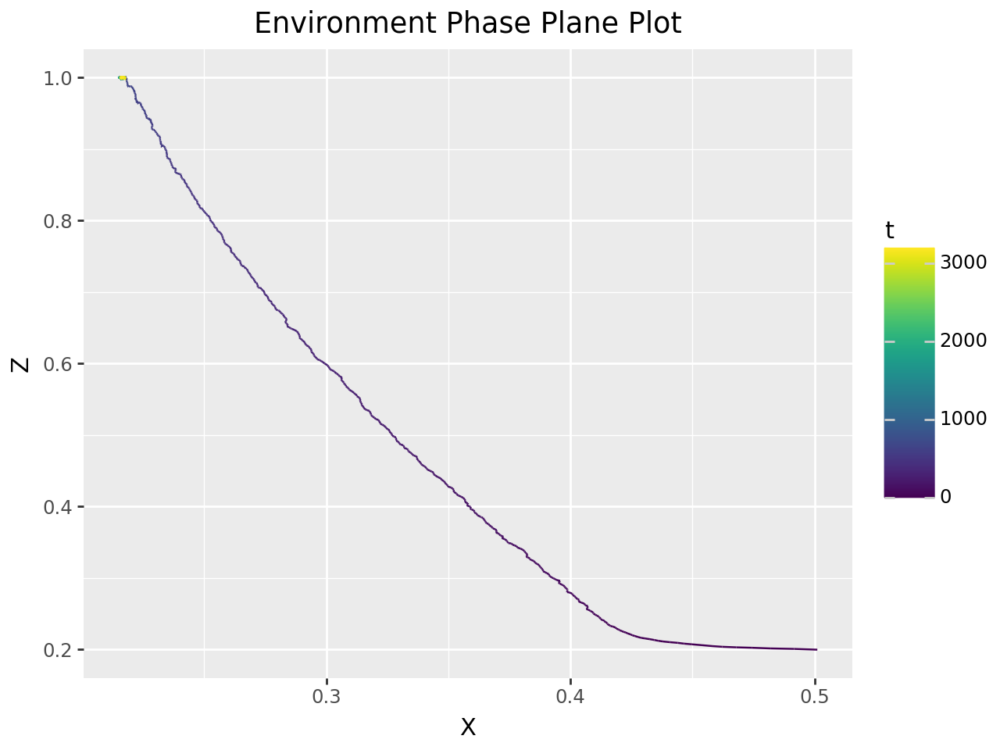

Salmon Final Population: 0.22
Lamprey Final Population: 0.14
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.17
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.14
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.06
Pinniped Population SD: 0.19



Salmon Velocity: 0.51, Lamprey Velocity: 0.51


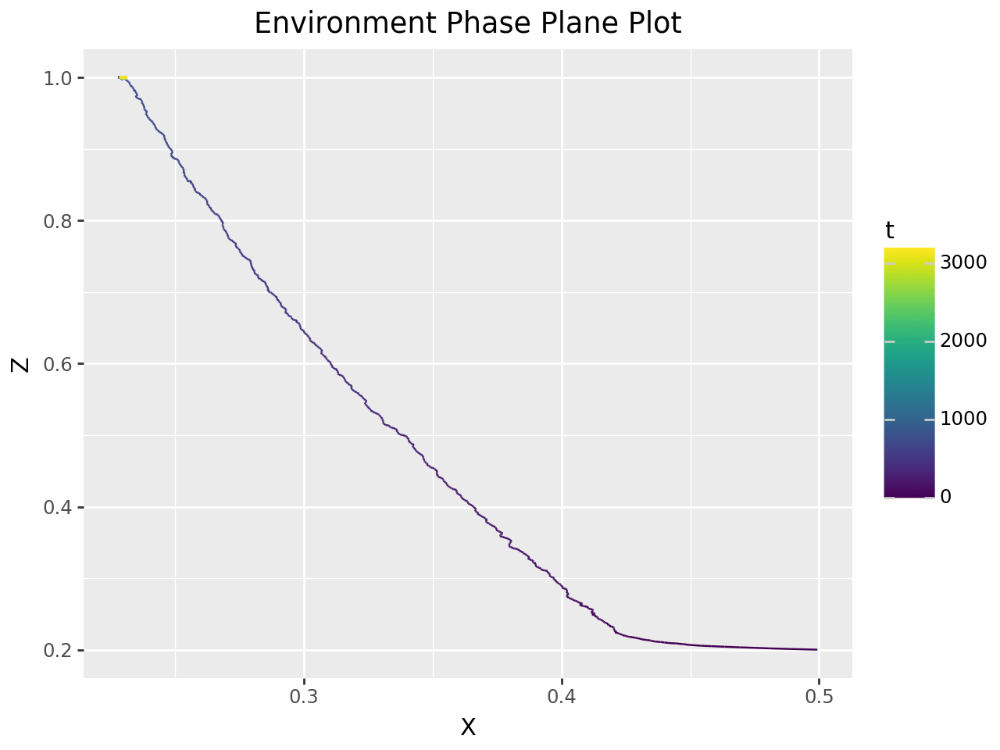

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.22



Salmon Velocity: 0.51, Lamprey Velocity: 0.76


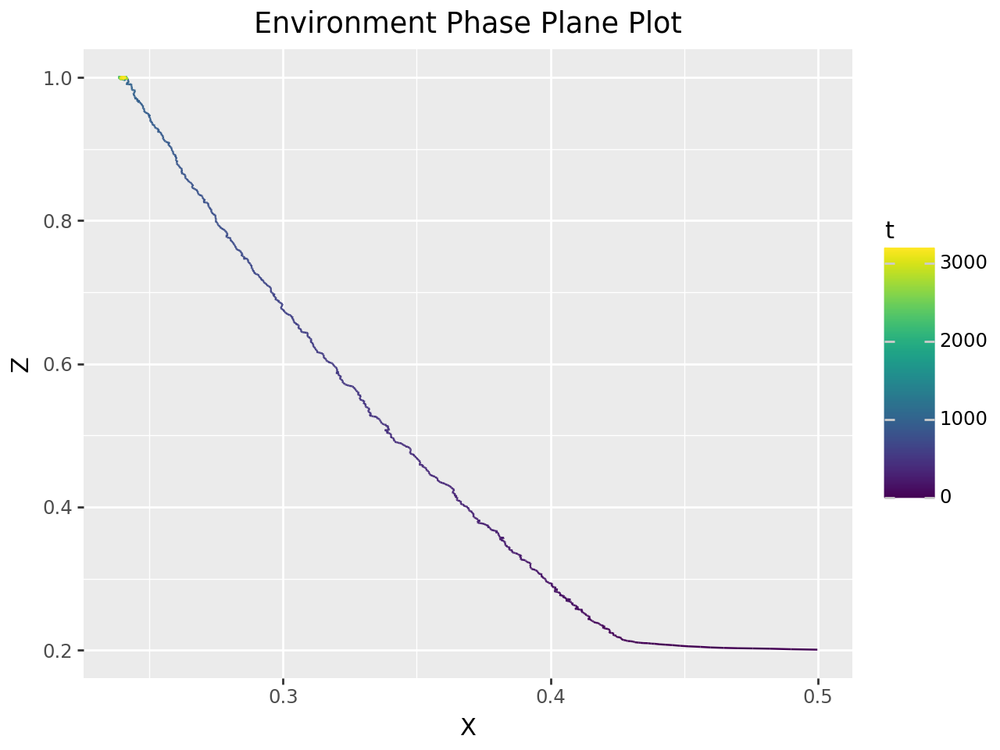

Salmon Final Population: 0.24
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.86

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.24
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.06

Salmon Population SD: 0.05
Lamprey Population SD: 0.03
Pinniped Population SD: 0.24



Salmon Velocity: 0.76, Lamprey Velocity: 0.010000000000000009


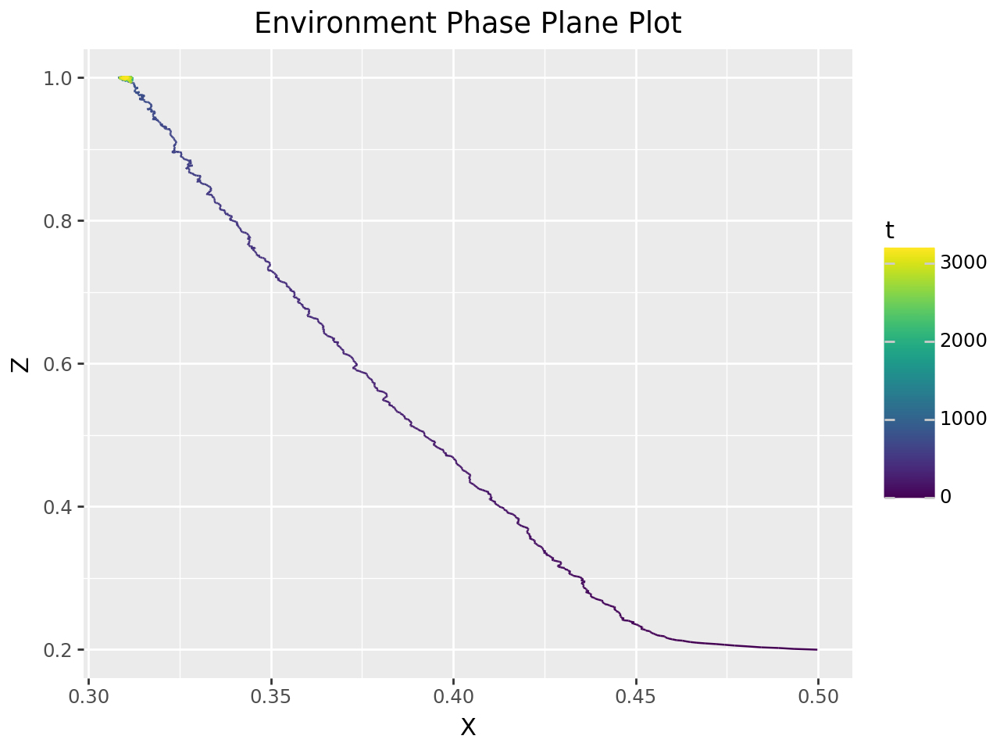

Salmon Final Population: 0.31
Lamprey Final Population: 0.09
Pinniped Final Population: 1.00

Salmon Mean Population: 0.33
Lamprey Mean Population: 0.11
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.31
Lamprey Min Population: 0.09
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.03
Lamprey Population SD: 0.07
Pinniped Population SD: 0.19



Salmon Velocity: 0.76, Lamprey Velocity: 0.26


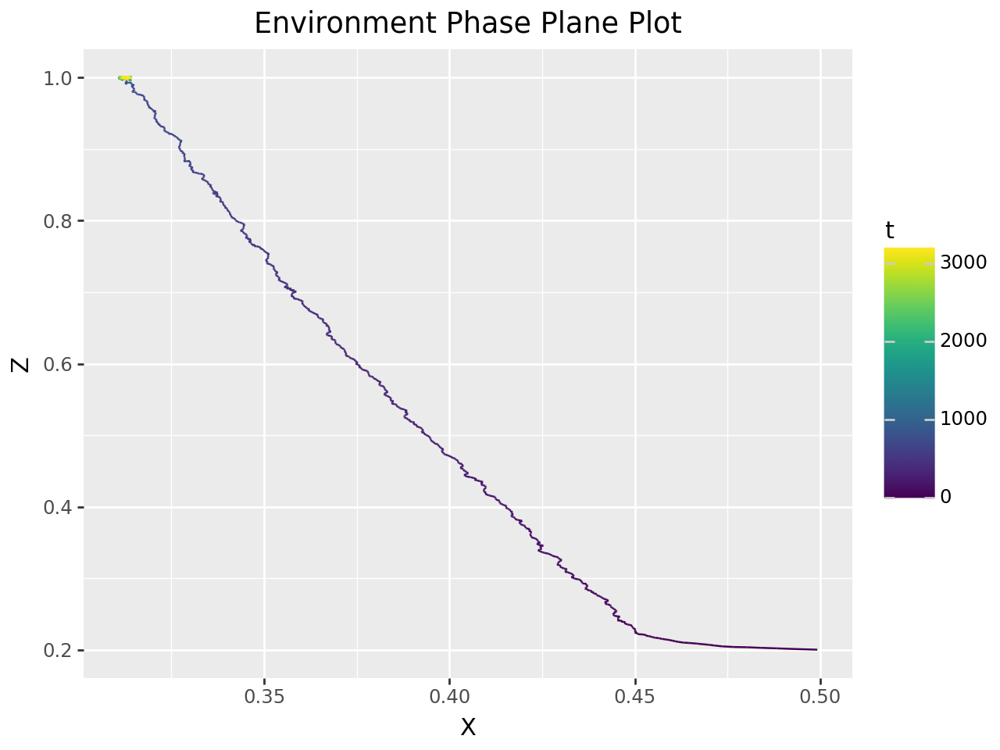

Salmon Final Population: 0.31
Lamprey Final Population: 0.17
Pinniped Final Population: 1.00

Salmon Mean Population: 0.33
Lamprey Mean Population: 0.20
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.31
Lamprey Min Population: 0.17
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.06
Pinniped Population SD: 0.20



Salmon Velocity: 0.76, Lamprey Velocity: 0.51


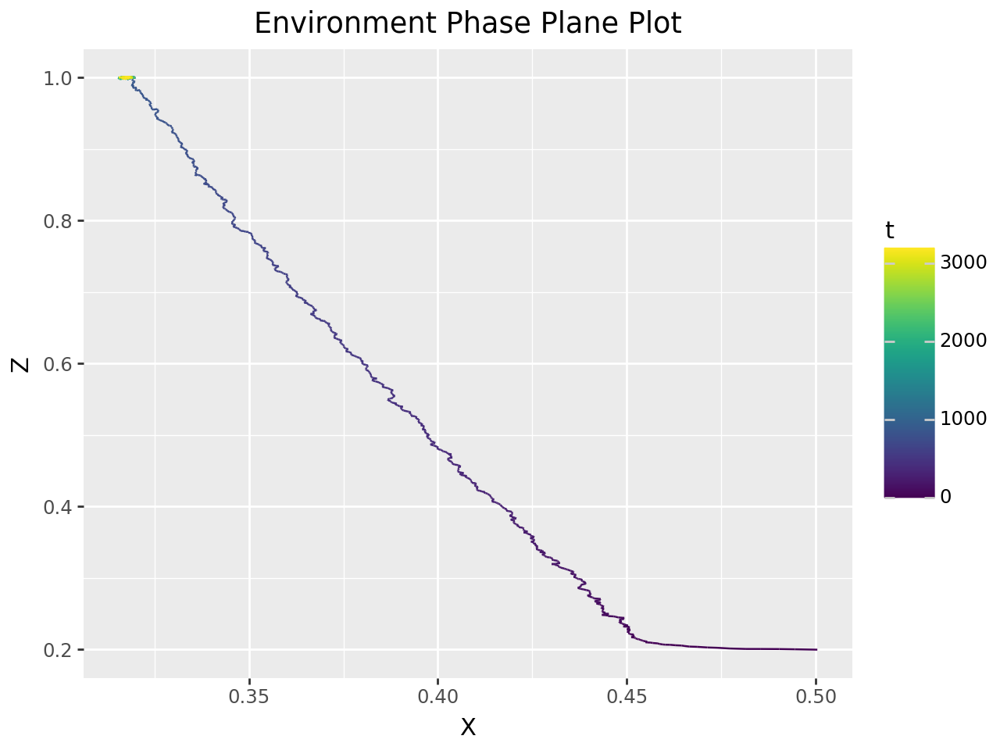

Salmon Final Population: 0.32
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.34
Lamprey Mean Population: 0.32
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.32
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.23



Salmon Velocity: 0.76, Lamprey Velocity: 0.76


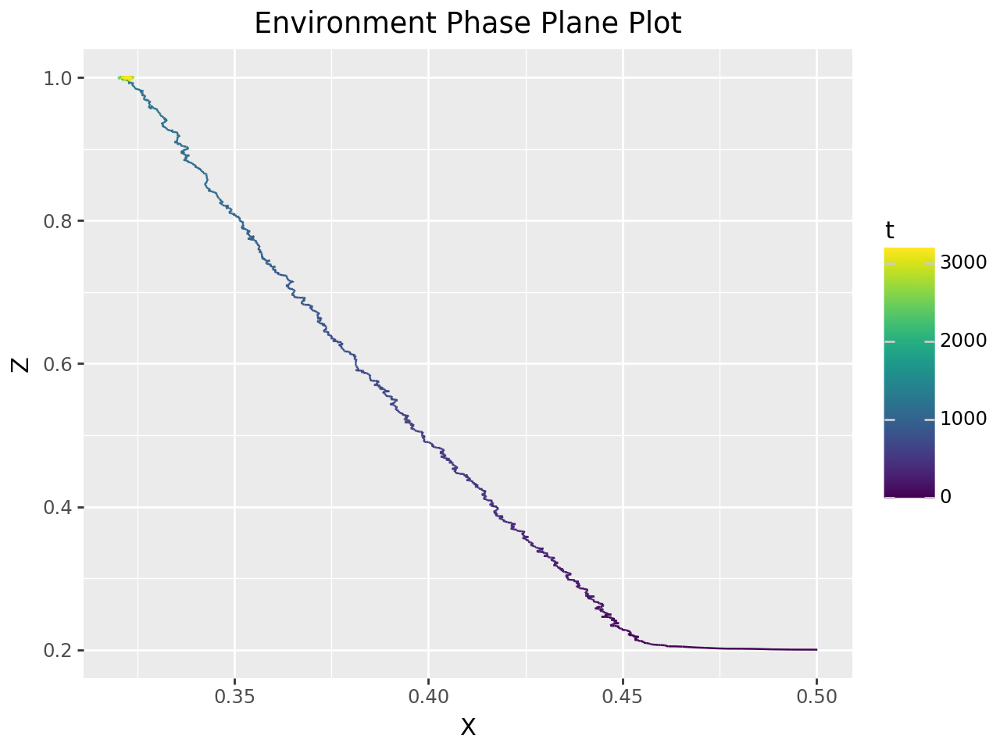

Salmon Final Population: 0.32
Lamprey Final Population: 0.37
Pinniped Final Population: 1.00

Salmon Mean Population: 0.35
Lamprey Mean Population: 0.39
Pinniped Mean Population: 0.82

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.32
Lamprey Min Population: 0.37
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.07

Salmon Population SD: 0.04
Lamprey Population SD: 0.03
Pinniped Population SD: 0.26



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.010000000000000009


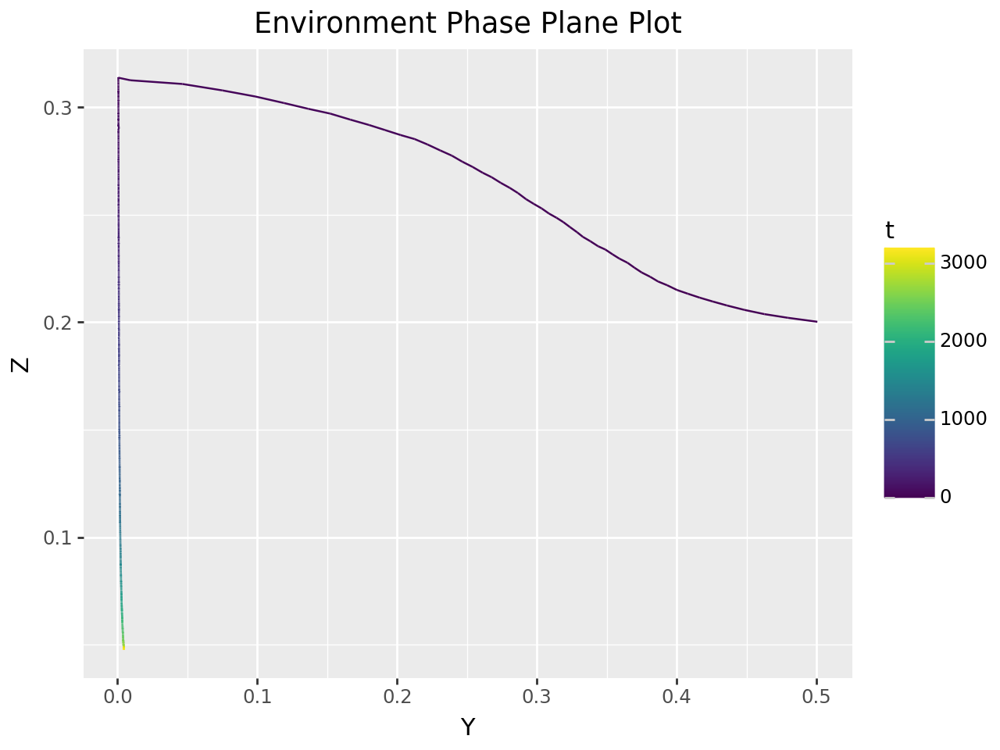

Salmon Final Population: 0.00
Lamprey Final Population: 0.00
Pinniped Final Population: 0.05

Salmon Mean Population: 0.00
Lamprey Mean Population: 0.01
Pinniped Mean Population: 0.11

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.31

Salmon Min Population: 0.00
Lamprey Min Population: 0.00
Pinniped Min Population: 0.05

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.01

Salmon Population SD: 0.04
Lamprey Population SD: 0.04
Pinniped Population SD: 0.07



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.26


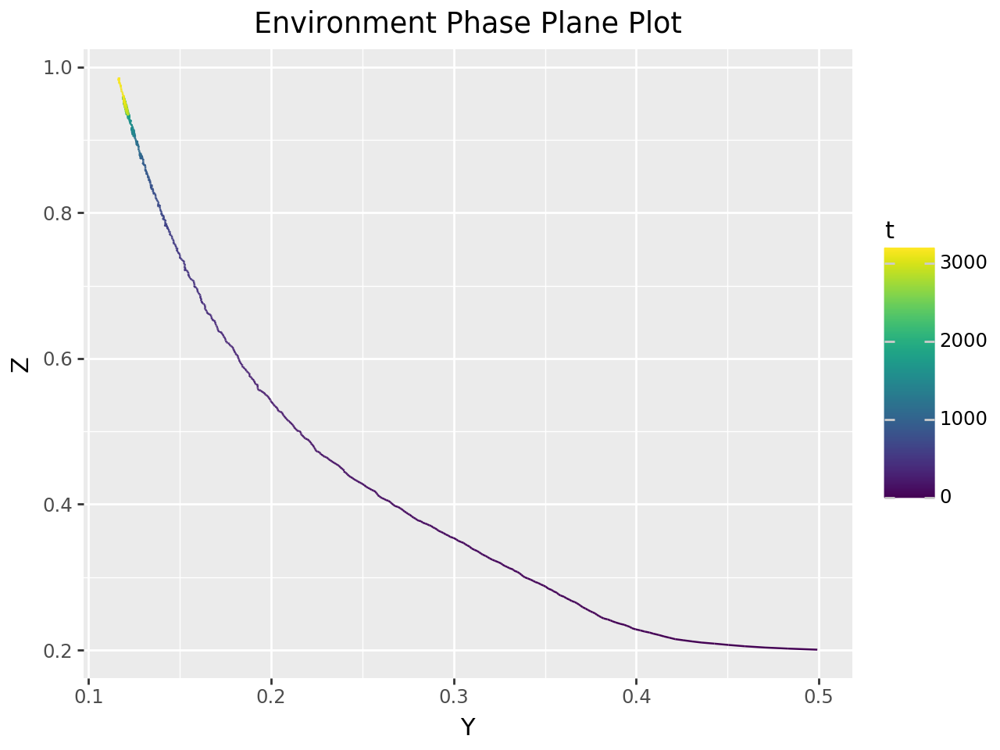

Salmon Final Population: 0.01
Lamprey Final Population: 0.12
Pinniped Final Population: 0.98

Salmon Mean Population: 0.02
Lamprey Mean Population: 0.14
Pinniped Mean Population: 0.85

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.99

Salmon Min Population: 0.01
Lamprey Min Population: 0.12
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.16



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.51


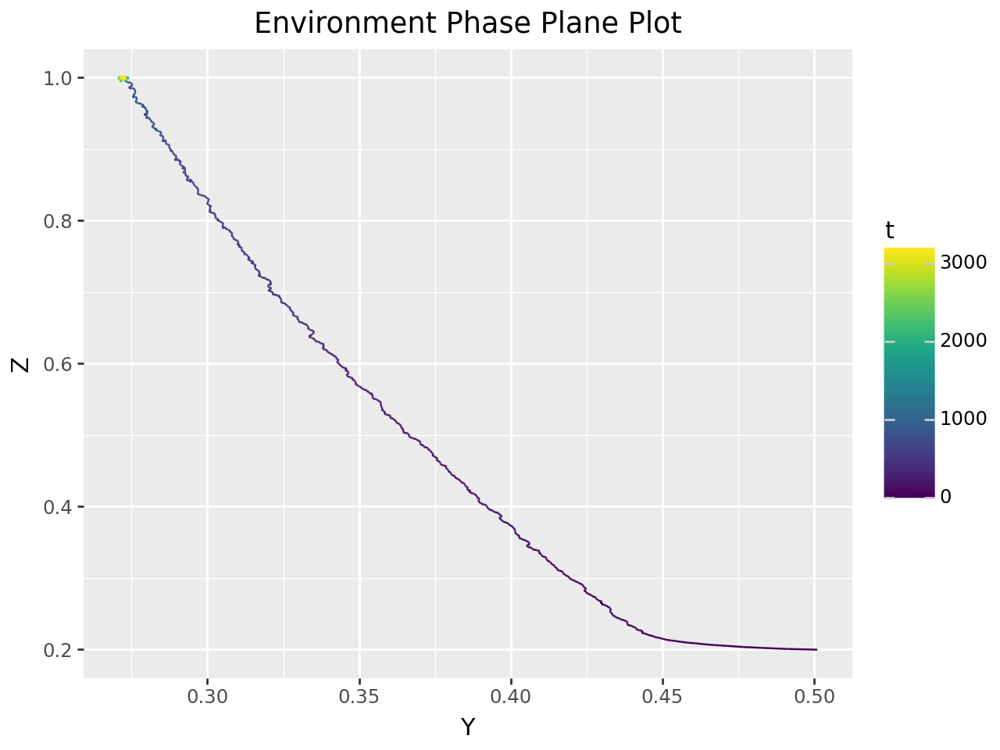

Salmon Final Population: 0.04
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.07
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.04
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Velocity: 0.010000000000000009, Lamprey Velocity: 0.76


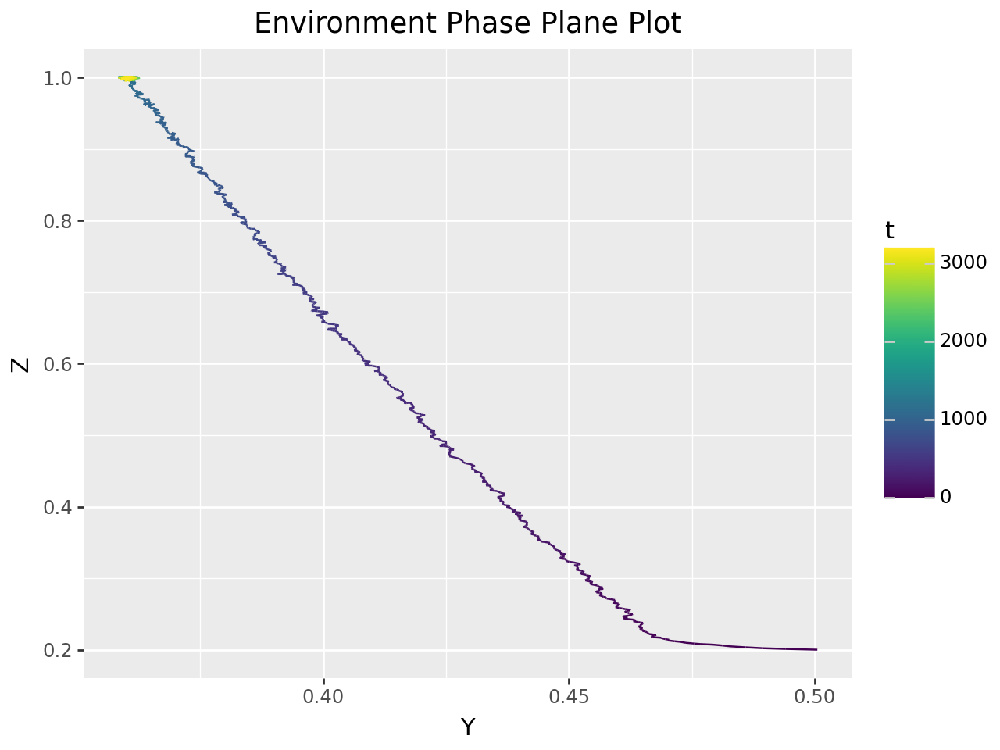

Salmon Final Population: 0.07
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.10
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.07
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.06
Lamprey Population SD: 0.03
Pinniped Population SD: 0.21



Salmon Velocity: 0.26, Lamprey Velocity: 0.010000000000000009


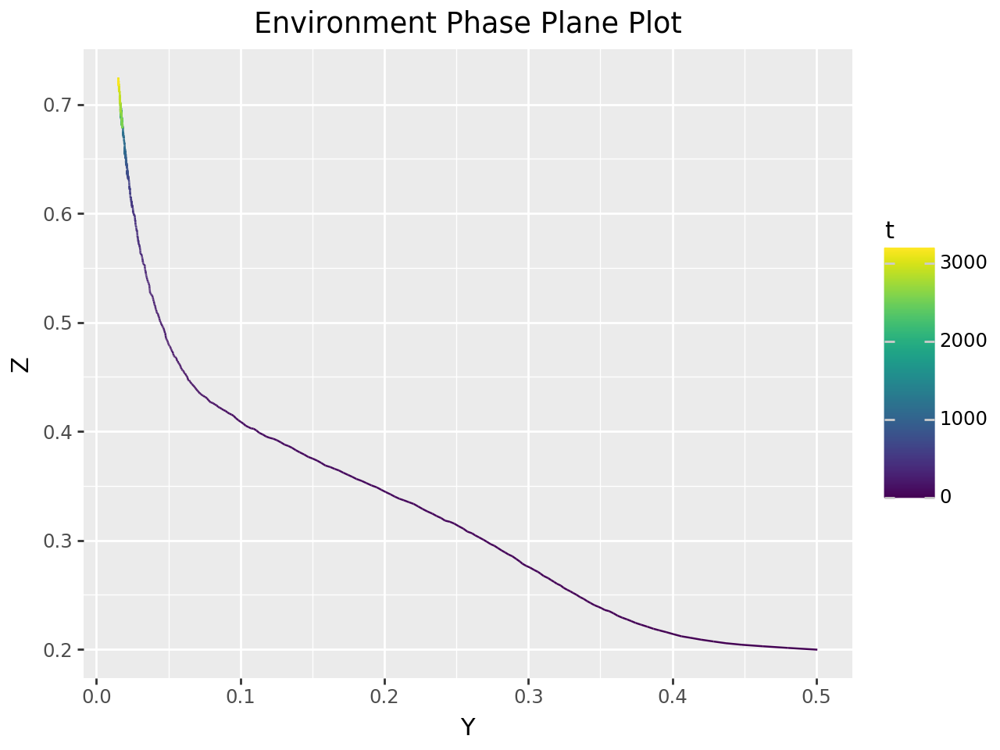

Salmon Final Population: 0.10
Lamprey Final Population: 0.02
Pinniped Final Population: 0.72

Salmon Mean Population: 0.12
Lamprey Mean Population: 0.03
Pinniped Mean Population: 0.65

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.72

Salmon Min Population: 0.10
Lamprey Min Population: 0.02
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.01

Salmon Population SD: 0.04
Lamprey Population SD: 0.05
Pinniped Population SD: 0.09



Salmon Velocity: 0.26, Lamprey Velocity: 0.26


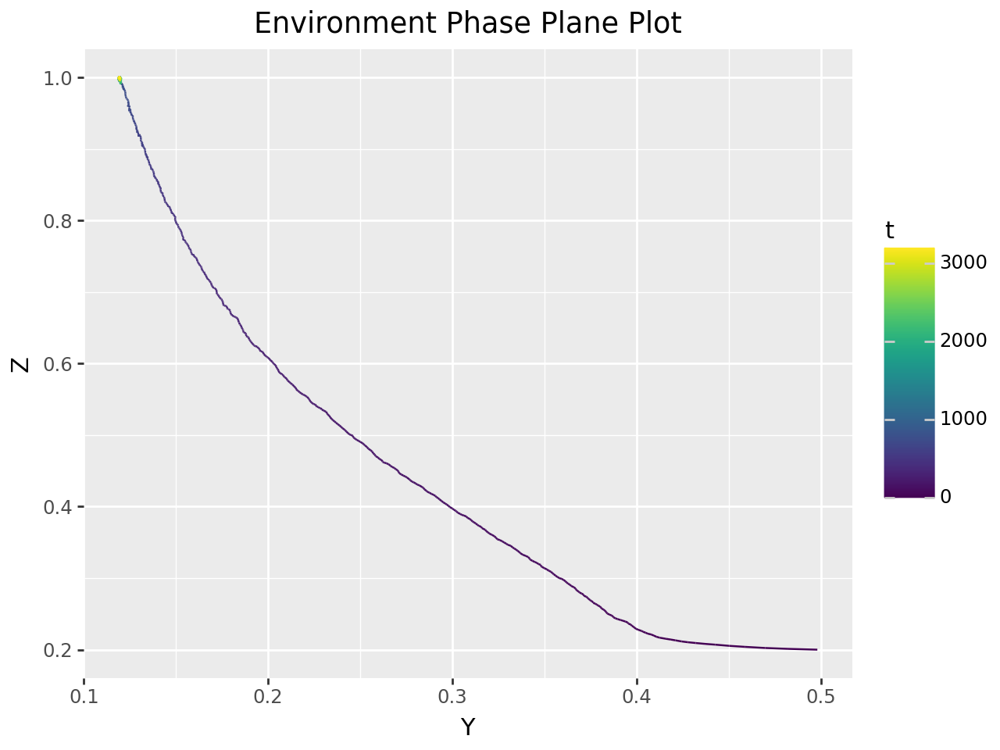

Salmon Final Population: 0.08
Lamprey Final Population: 0.12
Pinniped Final Population: 1.00

Salmon Mean Population: 0.10
Lamprey Mean Population: 0.14
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.08
Lamprey Min Population: 0.12
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.05
Lamprey Population SD: 0.06
Pinniped Population SD: 0.18



Salmon Velocity: 0.26, Lamprey Velocity: 0.51


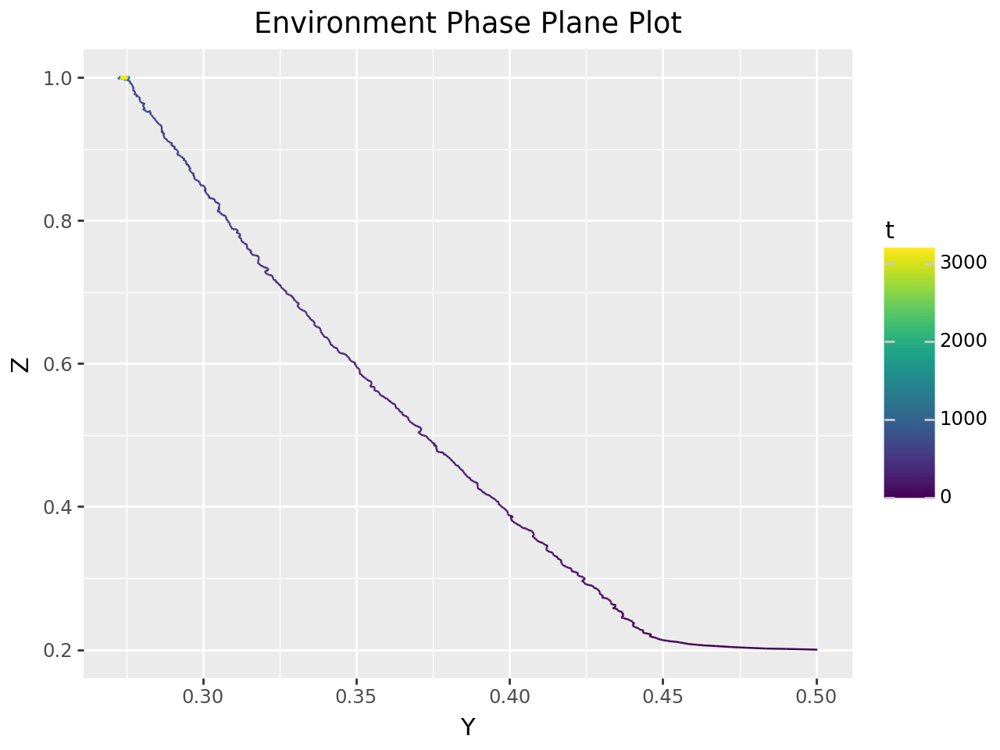

Salmon Final Population: 0.11
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.14
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.11
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Velocity: 0.26, Lamprey Velocity: 0.76


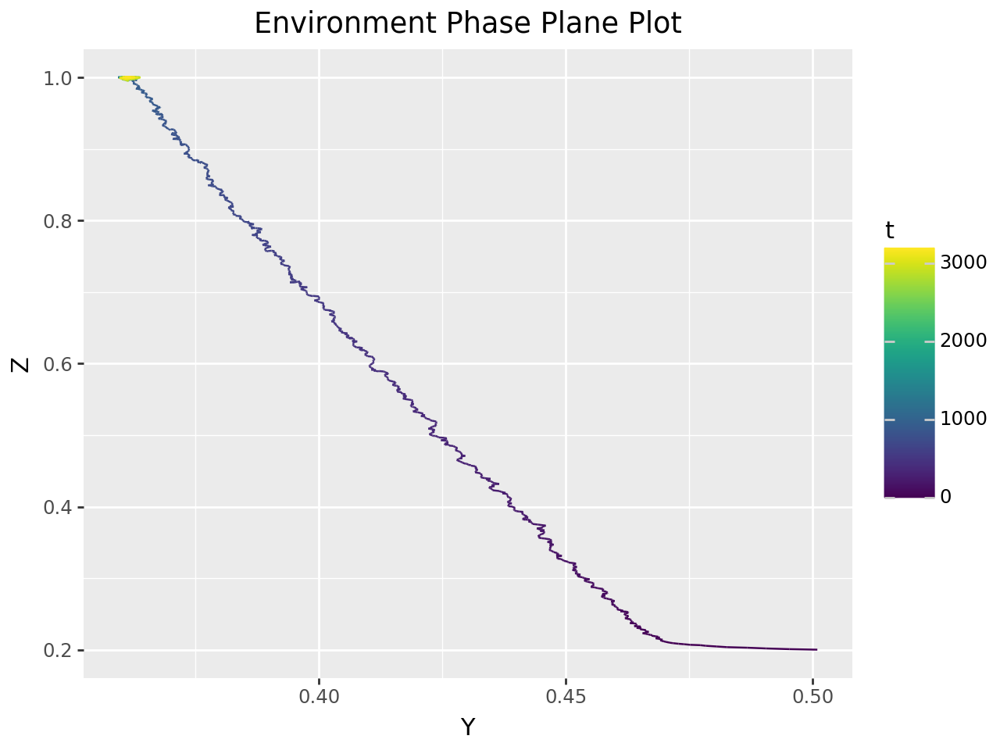

Salmon Final Population: 0.14
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.16
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.13
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.06
Lamprey Population SD: 0.03
Pinniped Population SD: 0.22



Salmon Velocity: 0.51, Lamprey Velocity: 0.010000000000000009


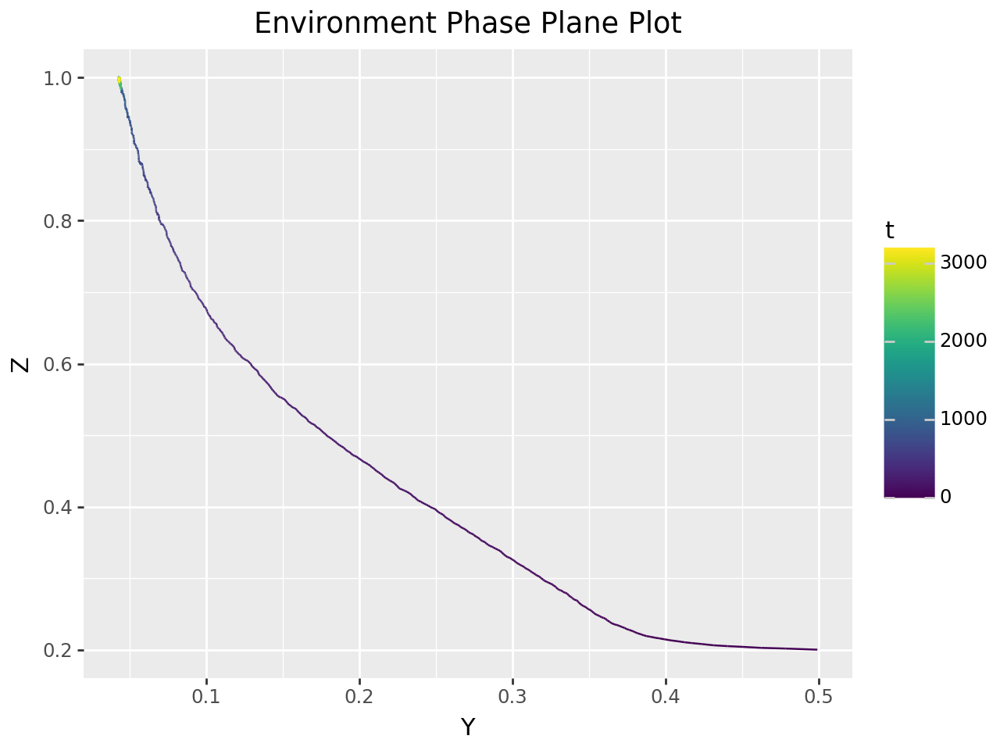

Salmon Final Population: 0.21
Lamprey Final Population: 0.04
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.07
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.04
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.06
Pinniped Population SD: 0.18



Salmon Velocity: 0.51, Lamprey Velocity: 0.26


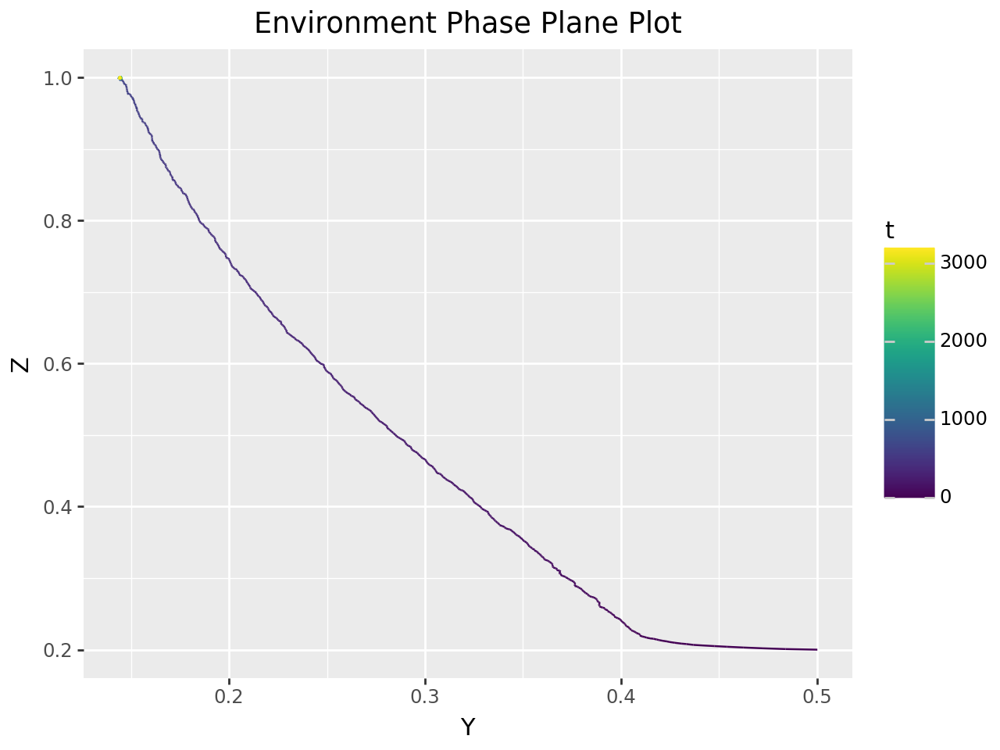

Salmon Final Population: 0.22
Lamprey Final Population: 0.14
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.17
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.14
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.06
Pinniped Population SD: 0.19



Salmon Velocity: 0.51, Lamprey Velocity: 0.51


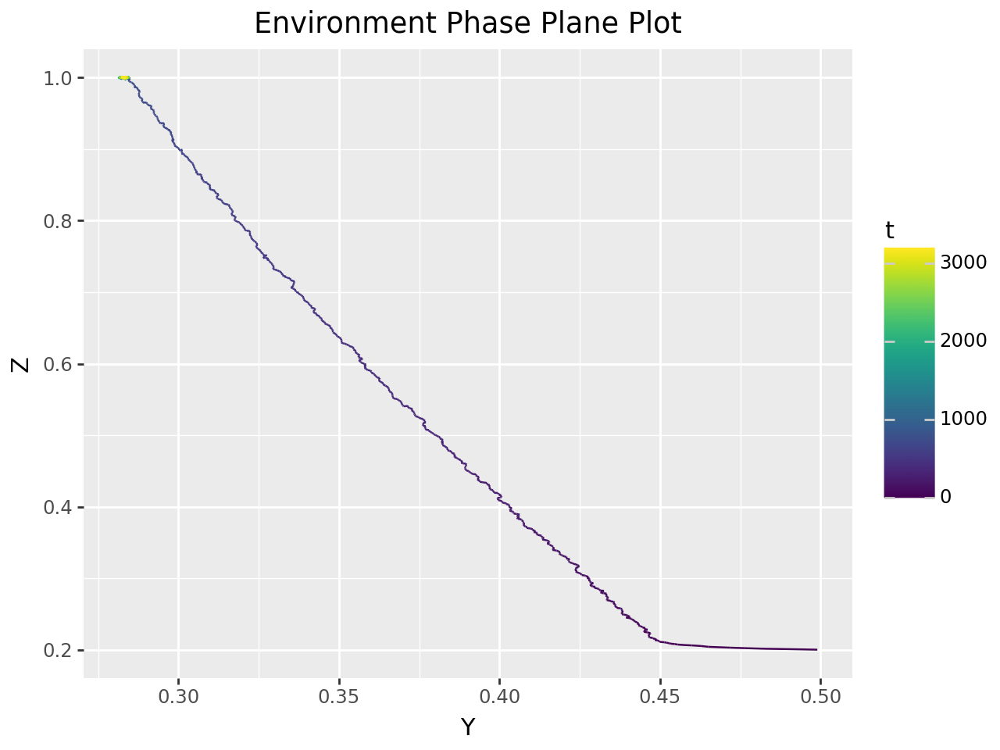

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Velocity: 0.51, Lamprey Velocity: 0.76


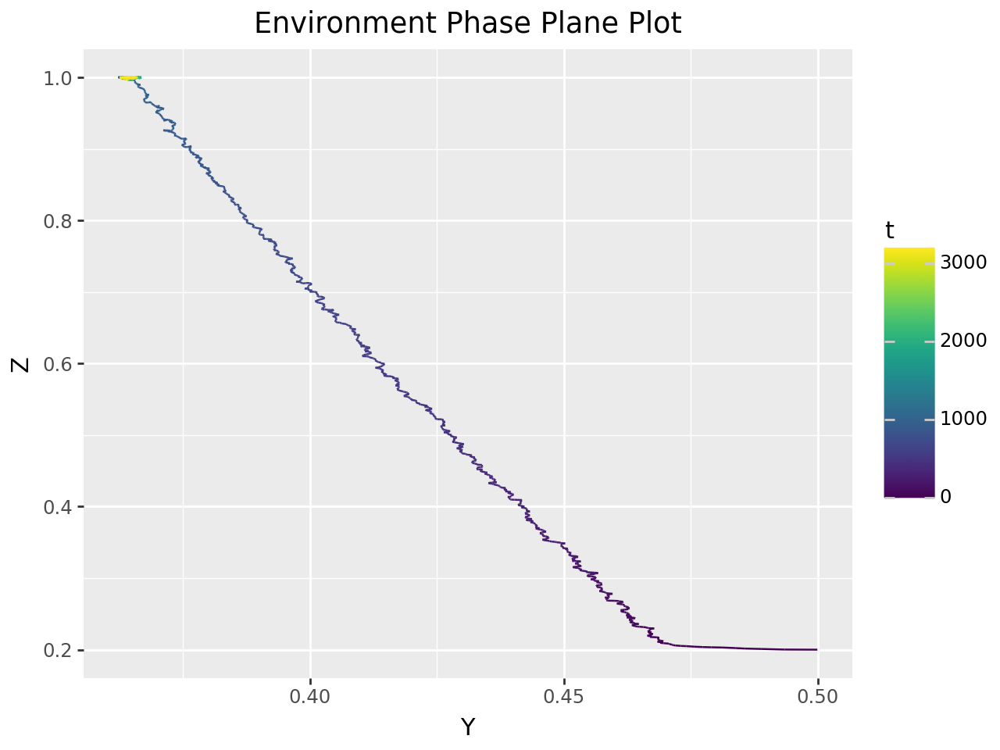

Salmon Final Population: 0.24
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.86

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.24
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.06

Salmon Population SD: 0.05
Lamprey Population SD: 0.03
Pinniped Population SD: 0.24



Salmon Velocity: 0.76, Lamprey Velocity: 0.010000000000000009


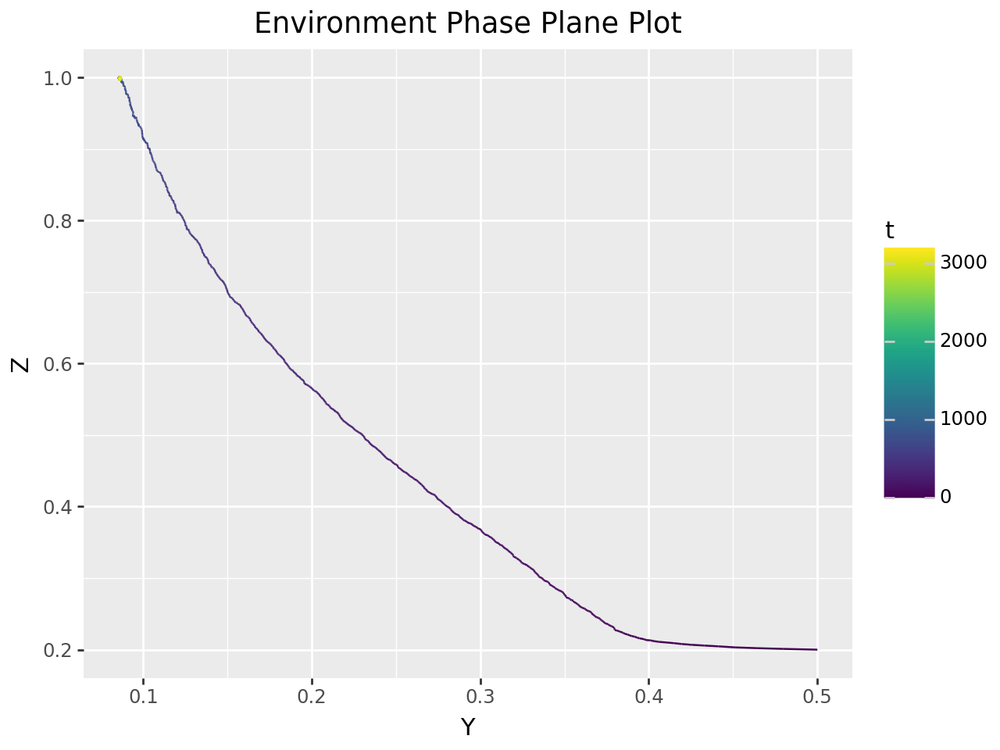

Salmon Final Population: 0.31
Lamprey Final Population: 0.09
Pinniped Final Population: 1.00

Salmon Mean Population: 0.32
Lamprey Mean Population: 0.11
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.31
Lamprey Min Population: 0.09
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.03
Lamprey Population SD: 0.07
Pinniped Population SD: 0.19



Salmon Velocity: 0.76, Lamprey Velocity: 0.26


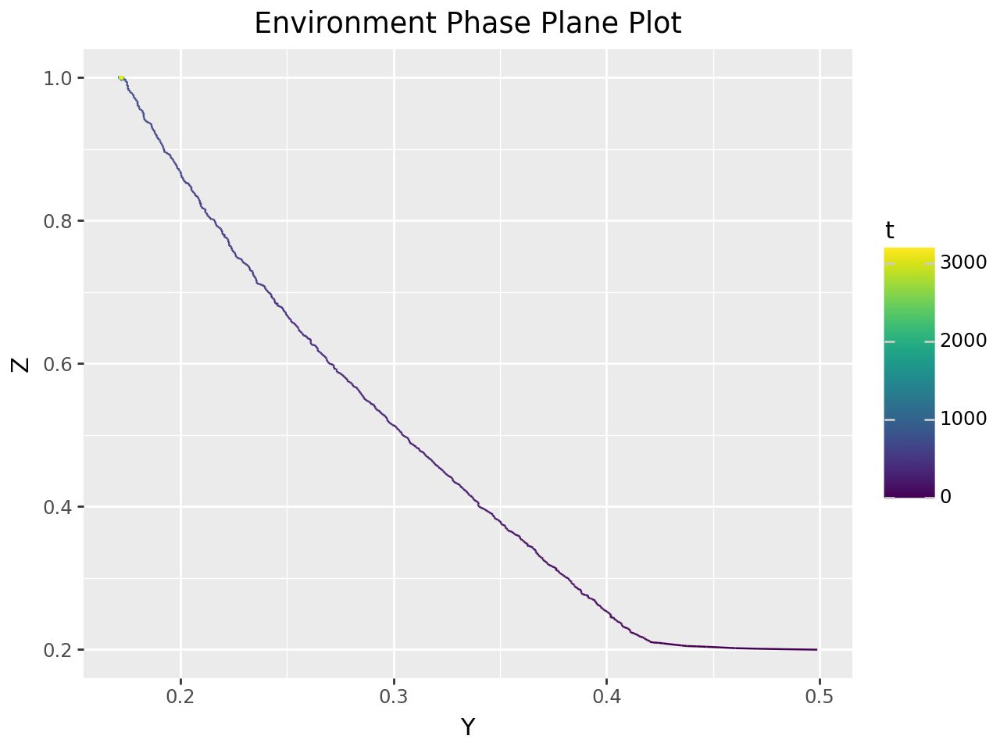

Salmon Final Population: 0.31
Lamprey Final Population: 0.17
Pinniped Final Population: 1.00

Salmon Mean Population: 0.33
Lamprey Mean Population: 0.20
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.31
Lamprey Min Population: 0.17
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.04
Lamprey Population SD: 0.06
Pinniped Population SD: 0.20



Salmon Velocity: 0.76, Lamprey Velocity: 0.51


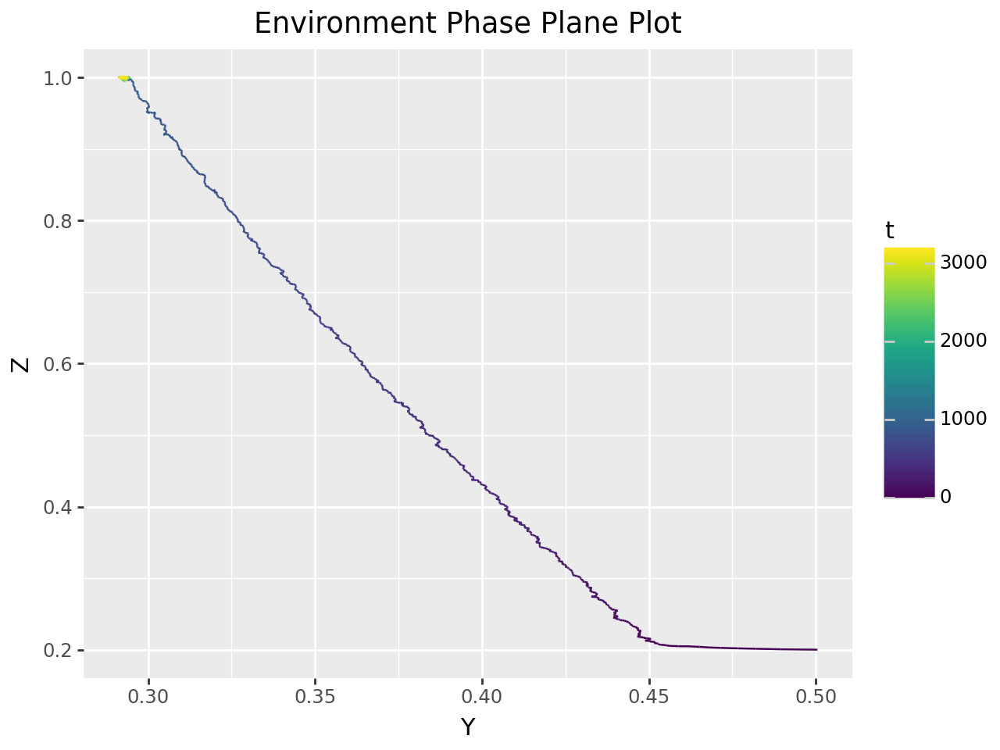

Salmon Final Population: 0.32
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.34
Lamprey Mean Population: 0.32
Pinniped Mean Population: 0.87

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.32
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.06

Salmon Population SD: 0.04
Lamprey Population SD: 0.05
Pinniped Population SD: 0.24



Salmon Velocity: 0.76, Lamprey Velocity: 0.76


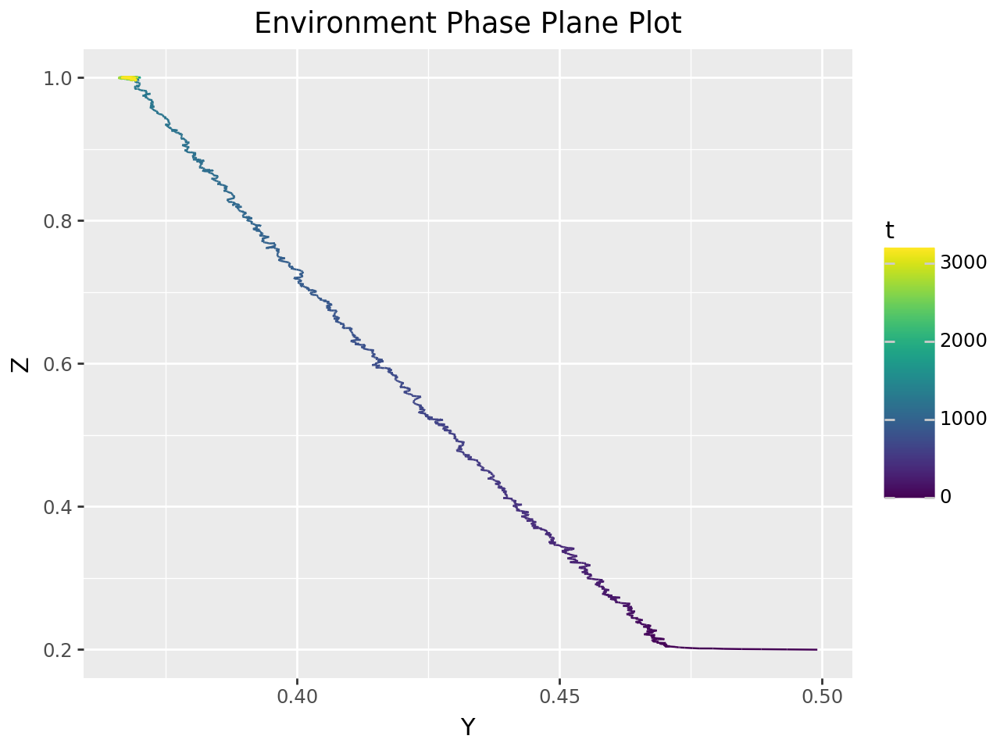

Salmon Final Population: 0.32
Lamprey Final Population: 0.37
Pinniped Final Population: 1.00

Salmon Mean Population: 0.35
Lamprey Mean Population: 0.39
Pinniped Mean Population: 0.82

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.32
Lamprey Min Population: 0.37
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.07

Salmon Population SD: 0.04
Lamprey Population SD: 0.03
Pinniped Population SD: 0.27





In [ ]:
simulate_param_changes(n_timesteps, hv_increment_range, "v", high_alpha=False, plot_funcs=(False, True), focus=("X", "Y"))
simulate_param_changes(n_timesteps, hv_increment_range, "v", high_alpha=False, plot_funcs=(False, True), focus=("X", "Z"))
simulate_param_changes(n_timesteps, hv_increment_range, "v", high_alpha=False, plot_funcs=(False, True), focus=("Y", "Z"))

Salmon Handling Rate: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


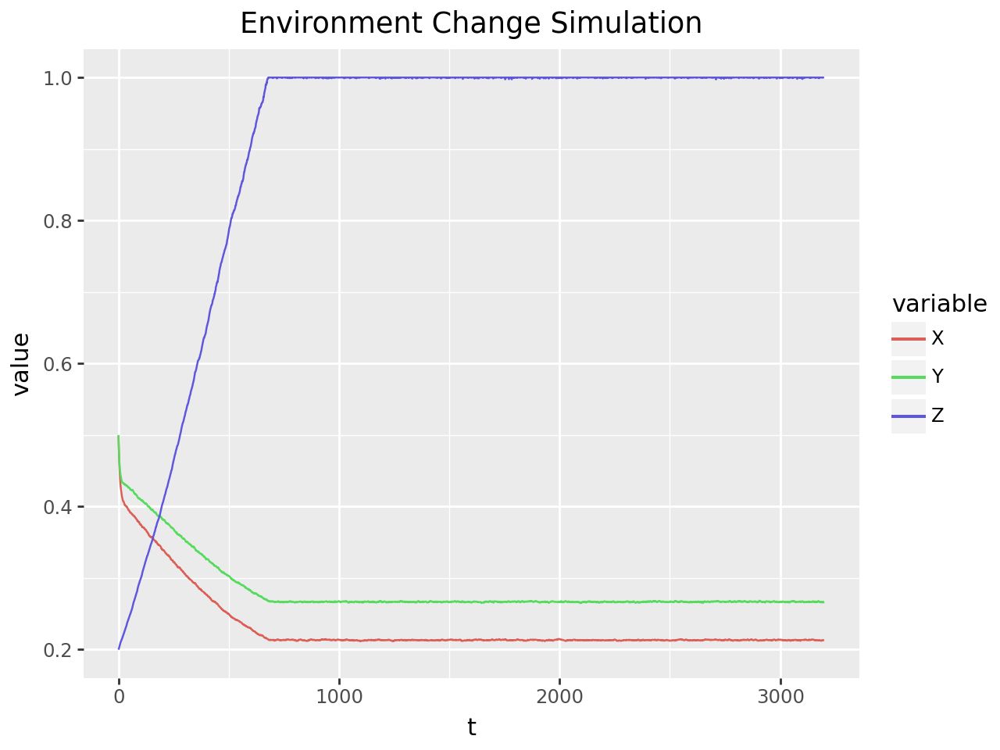

Salmon Final Population: 0.21
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Salmon Handling Rate: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


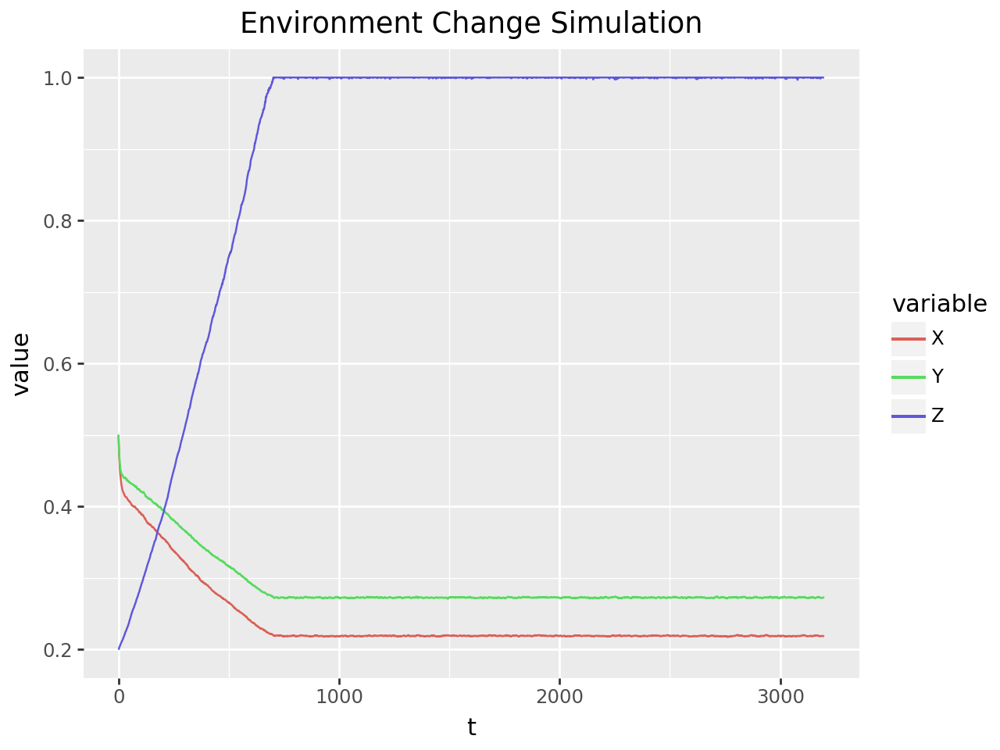

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Rate: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


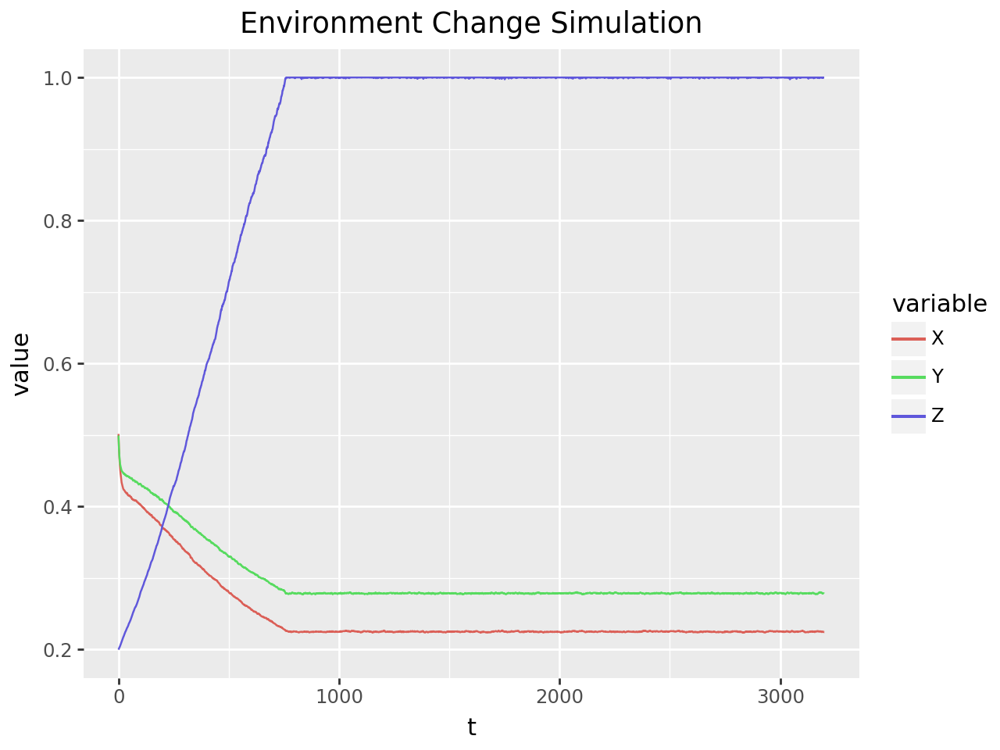

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Salmon Handling Rate: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


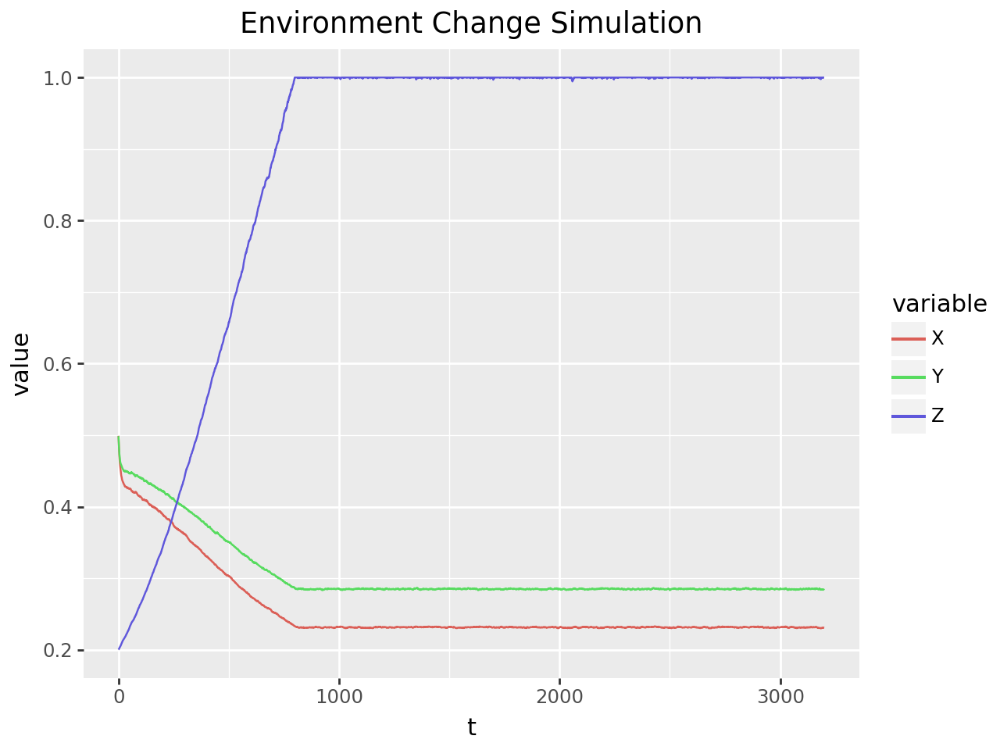

Salmon Final Population: 0.23
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22





In [ ]:
simulate_single_param_change(n_timesteps, hv_increment_range, "h_x", plot_funcs=(True, False))

Lamprey Handling Rate: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


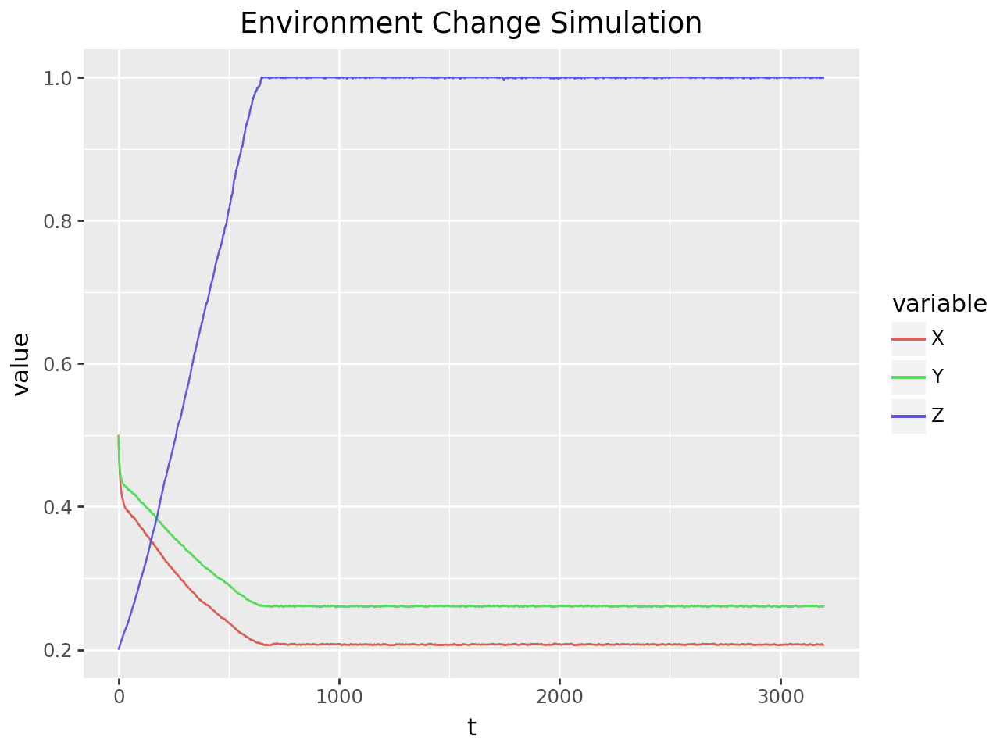

Salmon Final Population: 0.21
Lamprey Final Population: 0.26
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.26
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.20



Lamprey Handling Rate: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


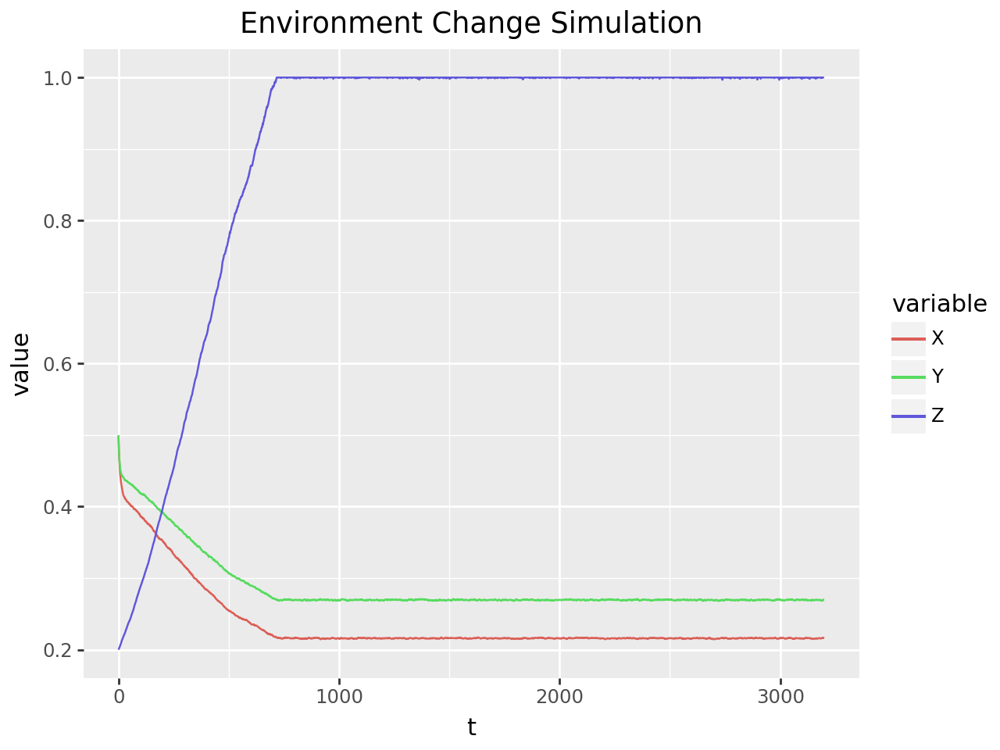

Salmon Final Population: 0.22
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.24
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Lamprey Handling Rate: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


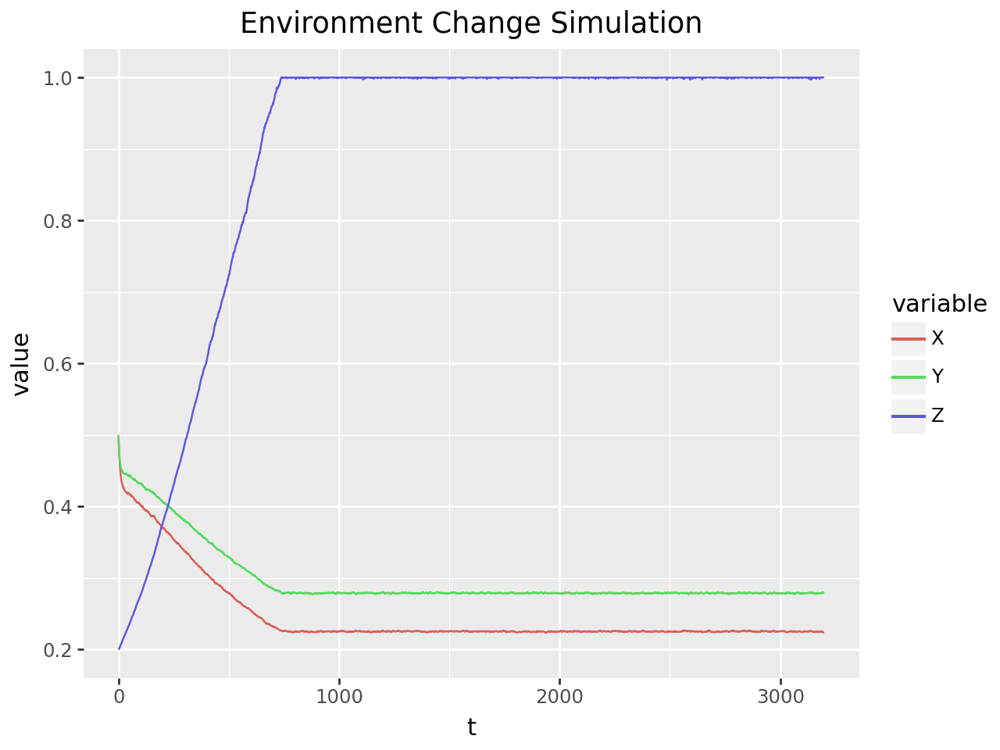

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Lamprey Handling Rate: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


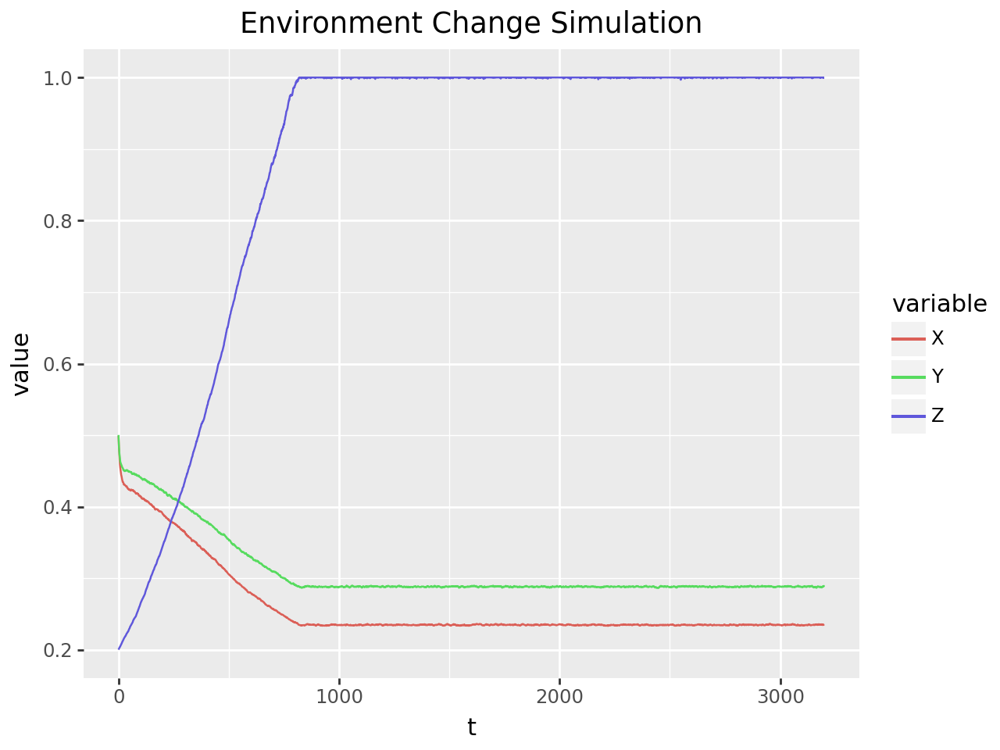

Salmon Final Population: 0.24
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.26
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.05
Pinniped Population SD: 0.22





In [ ]:
simulate_single_param_change(n_timesteps, hv_increment_range, "h_y", plot_funcs=(True, False))

Salmon Velocity: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


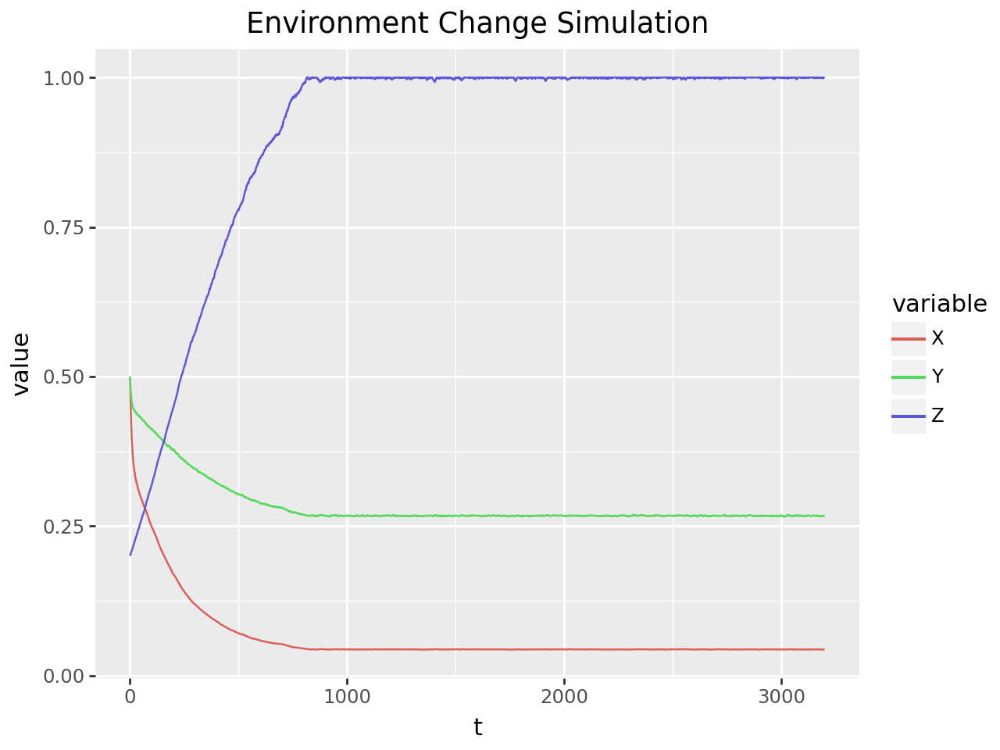

Salmon Final Population: 0.04
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.06
Lamprey Mean Population: 0.28
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.04
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Velocity: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


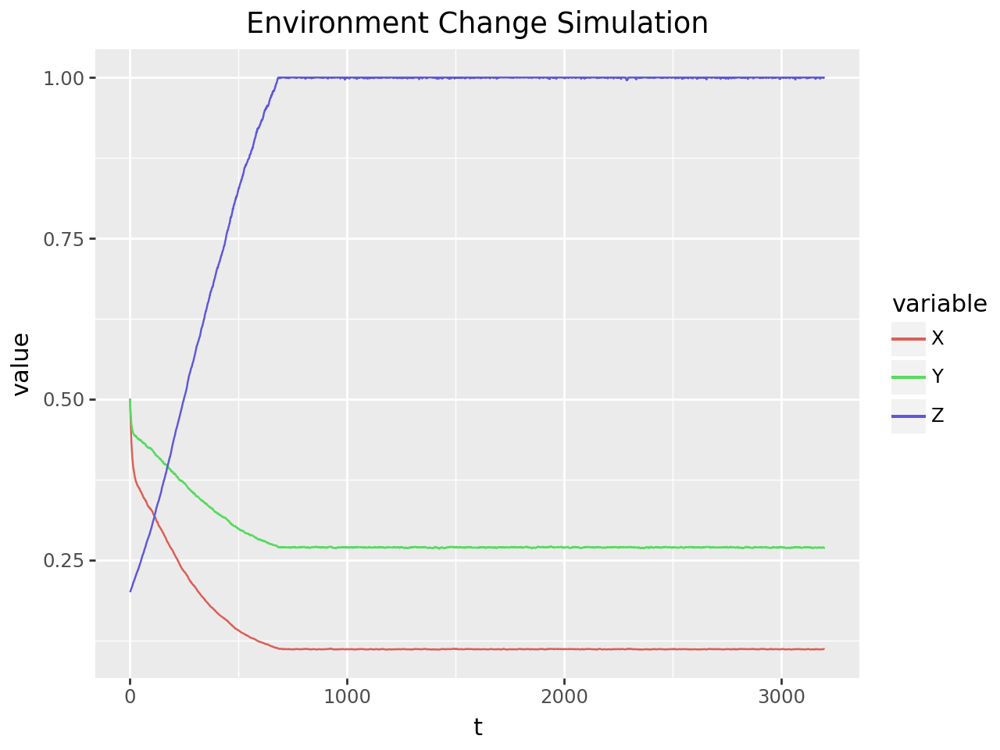

Salmon Final Population: 0.11
Lamprey Final Population: 0.27
Pinniped Final Population: 1.00

Salmon Mean Population: 0.13
Lamprey Mean Population: 0.29
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.11
Lamprey Min Population: 0.27
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.06
Lamprey Population SD: 0.04
Pinniped Population SD: 0.19



Salmon Velocity: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


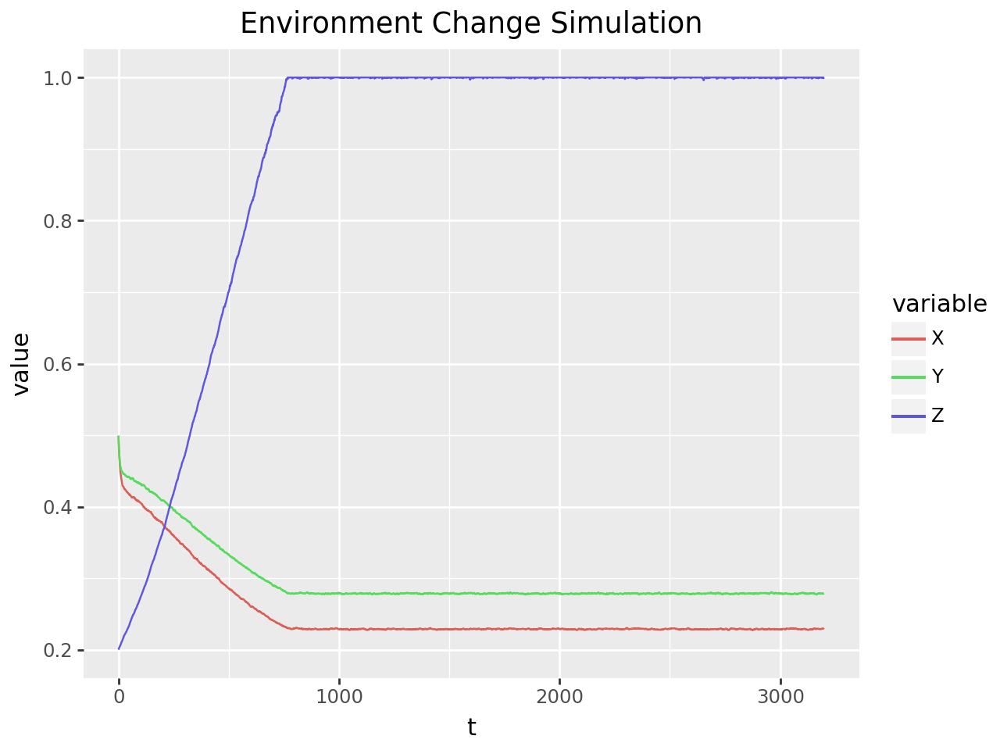

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.22



Salmon Velocity: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


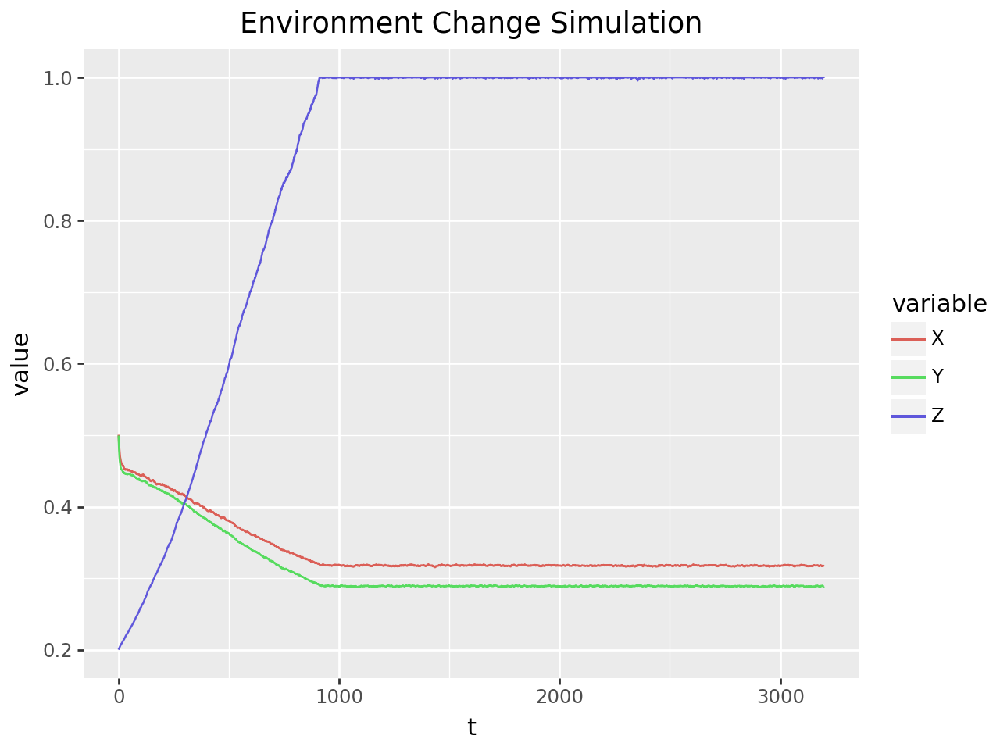

Salmon Final Population: 0.32
Lamprey Final Population: 0.29
Pinniped Final Population: 1.00

Salmon Mean Population: 0.34
Lamprey Mean Population: 0.31
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.32
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.04
Lamprey Population SD: 0.05
Pinniped Population SD: 0.23





In [ ]:
simulate_single_param_change(n_timesteps, hv_increment_range, "v_x", plot_funcs=(True, False))

Lamprey Velocity: 0.010000000000000009


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


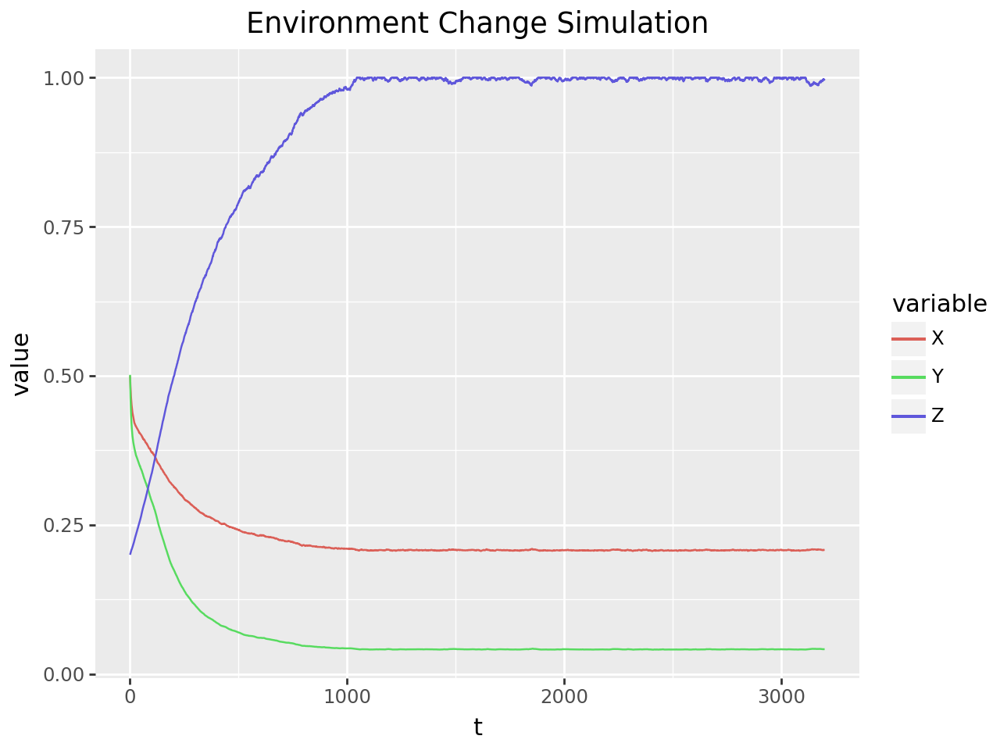

Salmon Final Population: 0.21
Lamprey Final Population: 0.04
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.06
Pinniped Mean Population: 0.91

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.04
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.03

Salmon Population SD: 0.04
Lamprey Population SD: 0.06
Pinniped Population SD: 0.18



Lamprey Velocity: 0.26


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


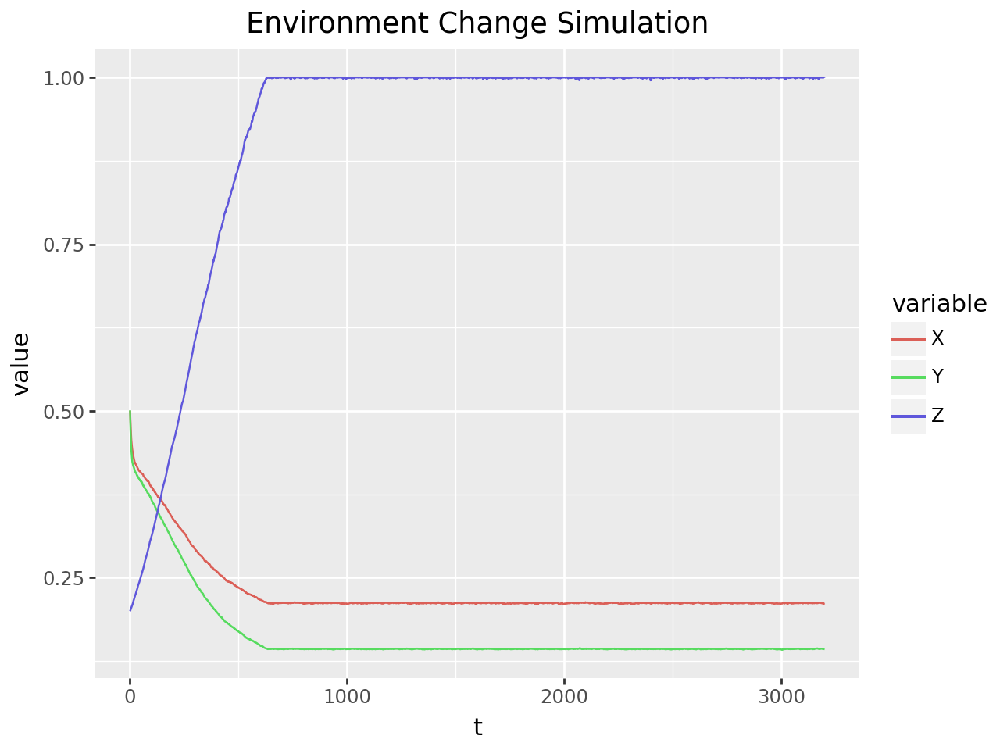

Salmon Final Population: 0.21
Lamprey Final Population: 0.14
Pinniped Final Population: 1.00

Salmon Mean Population: 0.23
Lamprey Mean Population: 0.17
Pinniped Mean Population: 0.92

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.21
Lamprey Min Population: 0.14
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.06
Pinniped Population SD: 0.19



Lamprey Velocity: 0.51


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


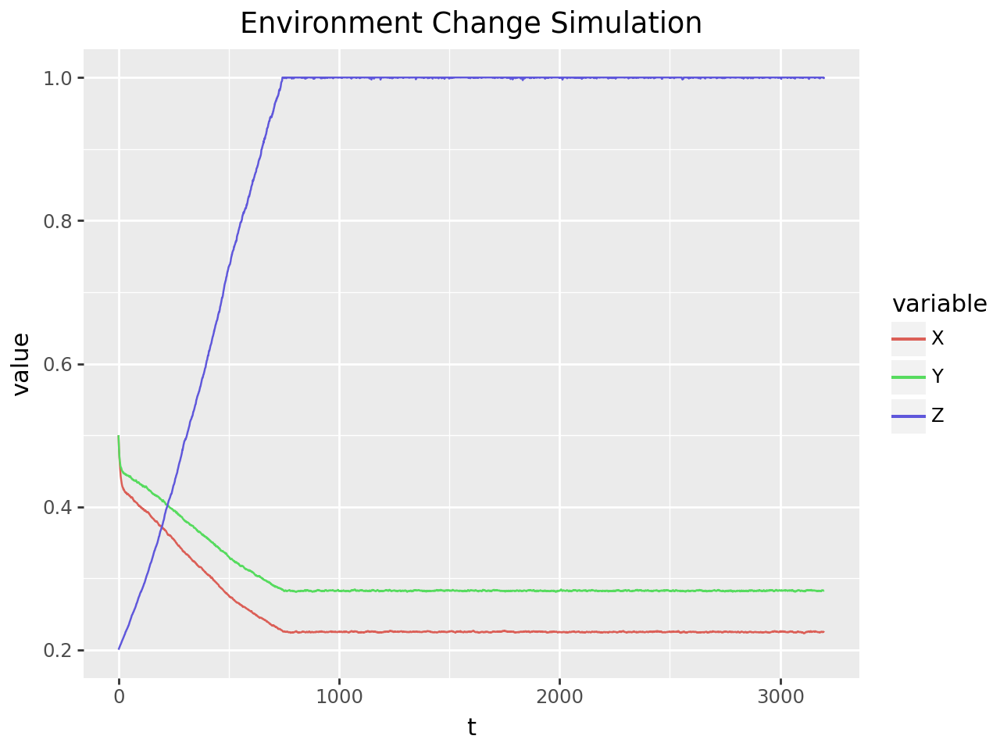

Salmon Final Population: 0.22
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21



Lamprey Velocity: 0.76


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


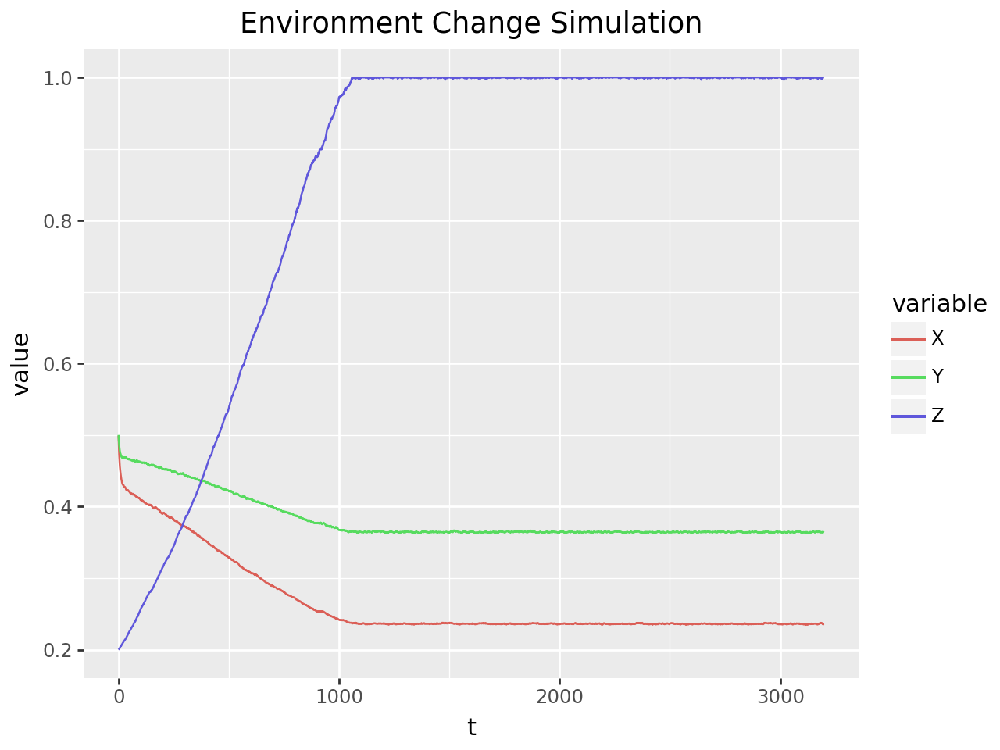

Salmon Final Population: 0.24
Lamprey Final Population: 0.36
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.86

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.23
Lamprey Min Population: 0.36
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.06

Salmon Population SD: 0.05
Lamprey Population SD: 0.03
Pinniped Population SD: 0.24





In [ ]:
simulate_single_param_change(n_timesteps, hv_increment_range, "v_y", plot_funcs=(True, False))

Beta: 0.010000001490116123


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


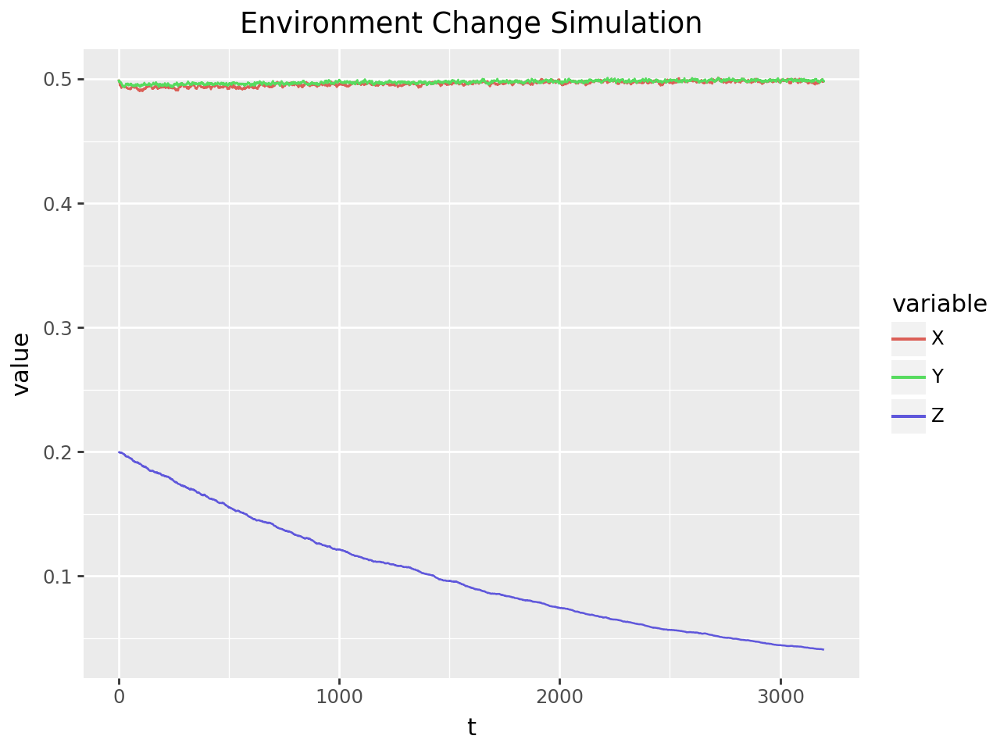

Salmon Final Population: 0.50
Lamprey Final Population: 0.50
Pinniped Final Population: 0.04

Salmon Mean Population: 0.50
Lamprey Mean Population: 0.50
Pinniped Mean Population: 0.10

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.49
Lamprey Min Population: 0.49
Pinniped Min Population: 0.04

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.05



Beta: 0.020000001490116118


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


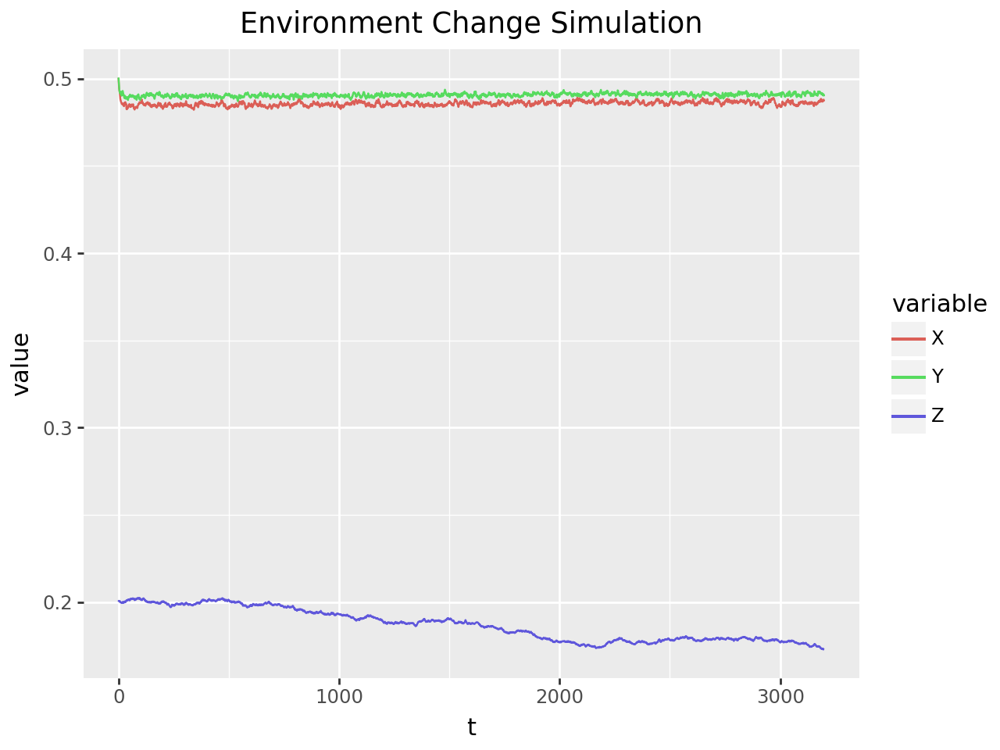

Salmon Final Population: 0.49
Lamprey Final Population: 0.49
Pinniped Final Population: 0.17

Salmon Mean Population: 0.49
Lamprey Mean Population: 0.49
Pinniped Mean Population: 0.19

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.17

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.01



Beta: 0.030000001490116113


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


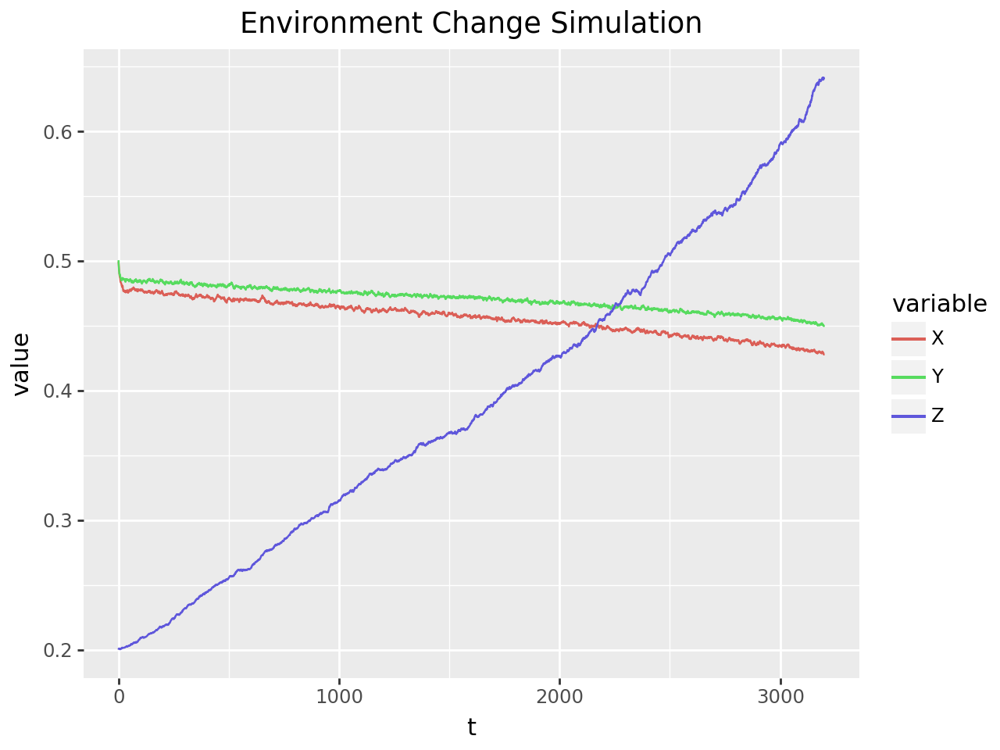

Salmon Final Population: 0.43
Lamprey Final Population: 0.45
Pinniped Final Population: 0.64

Salmon Mean Population: 0.46
Lamprey Mean Population: 0.47
Pinniped Mean Population: 0.39

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.64

Salmon Min Population: 0.43
Lamprey Min Population: 0.45
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.01

Salmon Population SD: 0.01
Lamprey Population SD: 0.01
Pinniped Population SD: 0.12



Beta: 0.04000000149011611


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


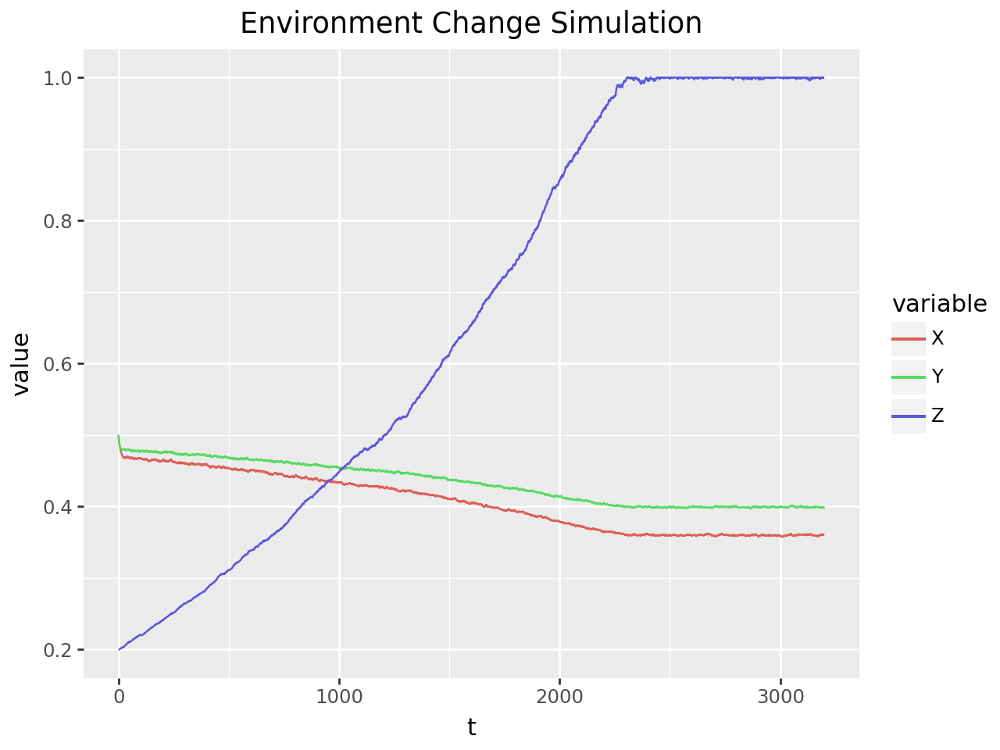

Salmon Final Population: 0.36
Lamprey Final Population: 0.40
Pinniped Final Population: 1.00

Salmon Mean Population: 0.41
Lamprey Mean Population: 0.43
Pinniped Mean Population: 0.66

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.36
Lamprey Min Population: 0.40
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.08

Salmon Population SD: 0.04
Lamprey Population SD: 0.03
Pinniped Population SD: 0.29



Beta: 0.0500000014901161


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


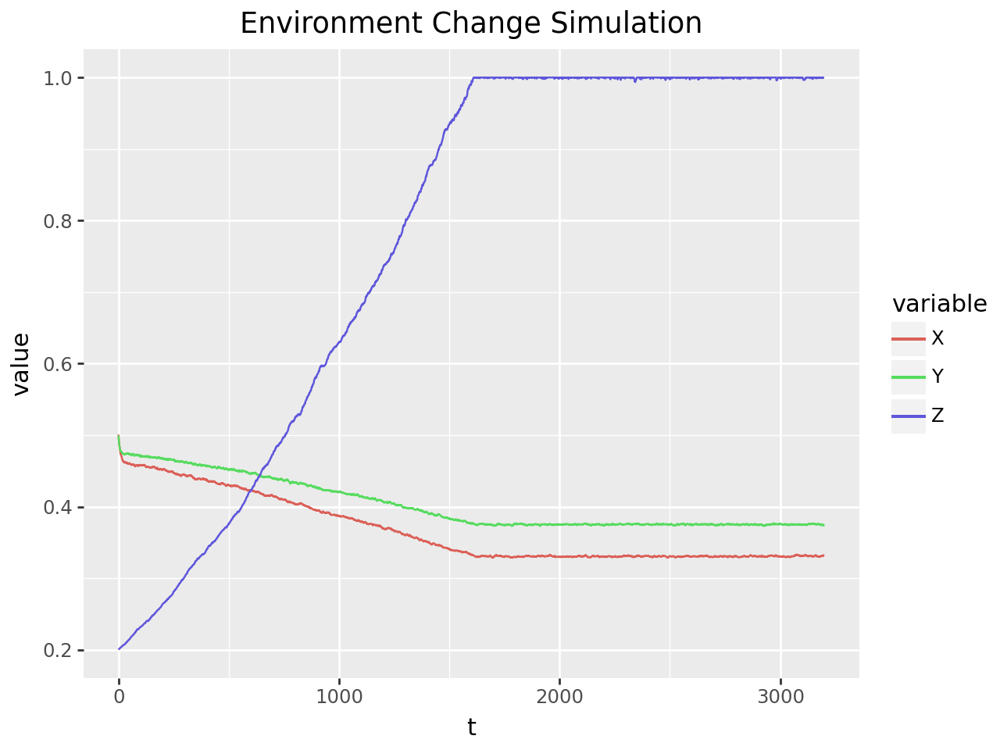

Salmon Final Population: 0.33
Lamprey Final Population: 0.37
Pinniped Final Population: 1.00

Salmon Mean Population: 0.37
Lamprey Mean Population: 0.40
Pinniped Mean Population: 0.77

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.33
Lamprey Min Population: 0.37
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.08

Salmon Population SD: 0.05
Lamprey Population SD: 0.03
Pinniped Population SD: 0.28



Beta: 0.0600000014901161


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


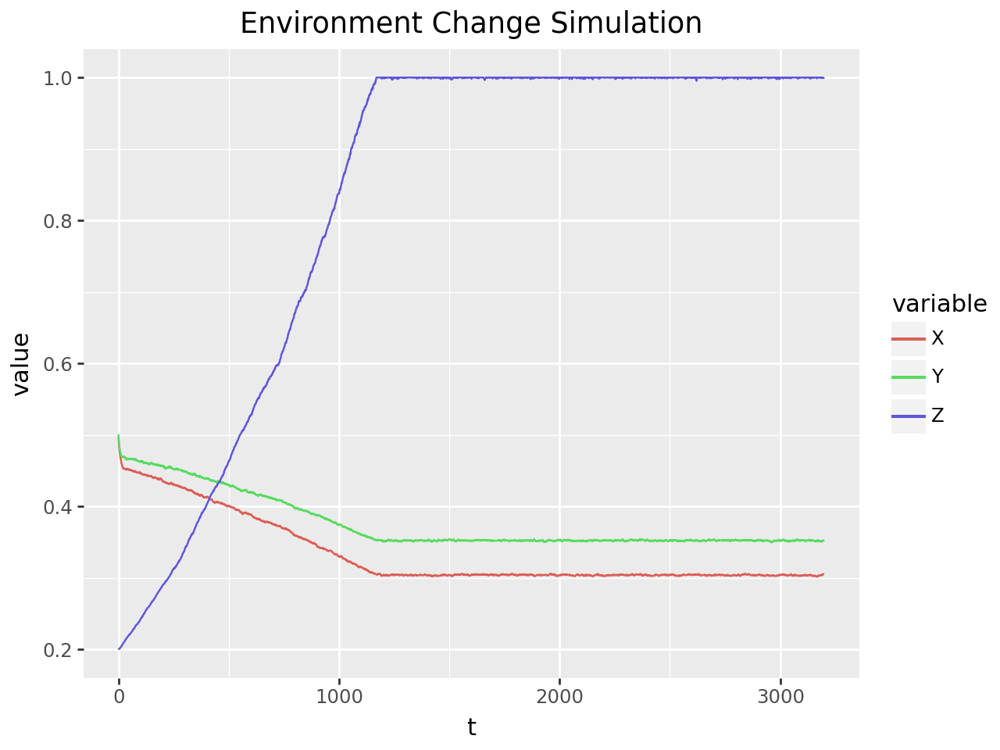

Salmon Final Population: 0.31
Lamprey Final Population: 0.35
Pinniped Final Population: 1.00

Salmon Mean Population: 0.33
Lamprey Mean Population: 0.38
Pinniped Mean Population: 0.83

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.30
Lamprey Min Population: 0.35
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.07

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.26



Beta: 0.07000000149011609


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


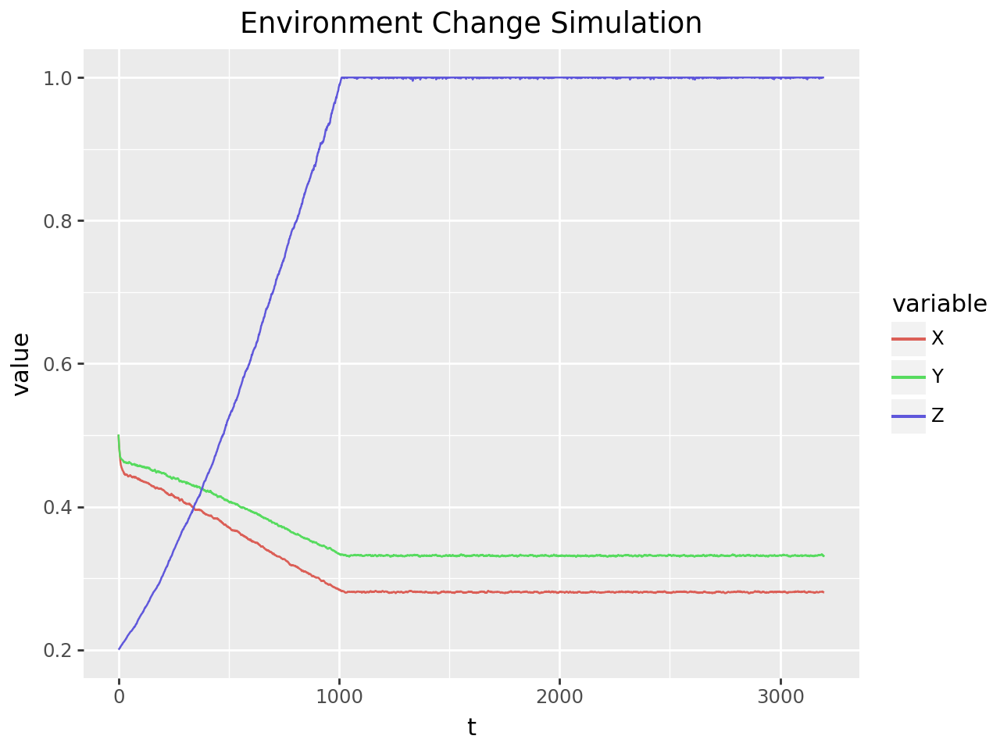

Salmon Final Population: 0.28
Lamprey Final Population: 0.33
Pinniped Final Population: 1.00

Salmon Mean Population: 0.31
Lamprey Mean Population: 0.35
Pinniped Mean Population: 0.86

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.28
Lamprey Min Population: 0.33
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.06

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.25



Beta: 0.08000000149011609


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


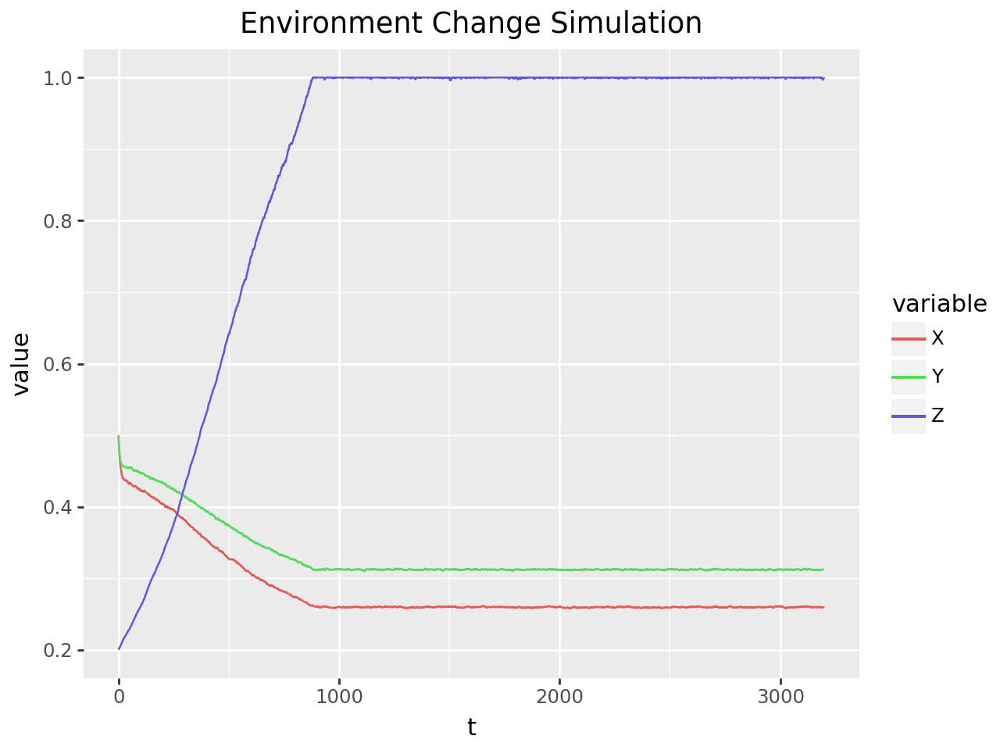

Salmon Final Population: 0.26
Lamprey Final Population: 0.31
Pinniped Final Population: 1.00

Salmon Mean Population: 0.28
Lamprey Mean Population: 0.33
Pinniped Mean Population: 0.88

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.26
Lamprey Min Population: 0.31
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.23



Beta: 0.09000000149011608


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


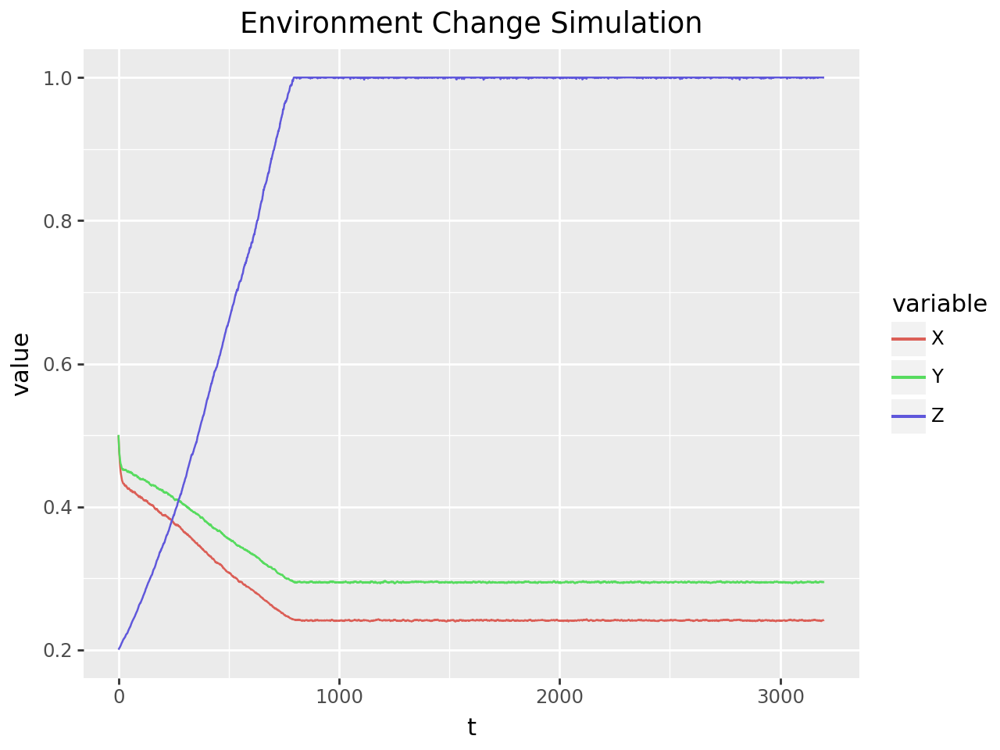

Salmon Final Population: 0.24
Lamprey Final Population: 0.30
Pinniped Final Population: 1.00

Salmon Mean Population: 0.27
Lamprey Mean Population: 0.32
Pinniped Mean Population: 0.89

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.24
Lamprey Min Population: 0.29
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.22



Beta: 0.10000000149011608


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


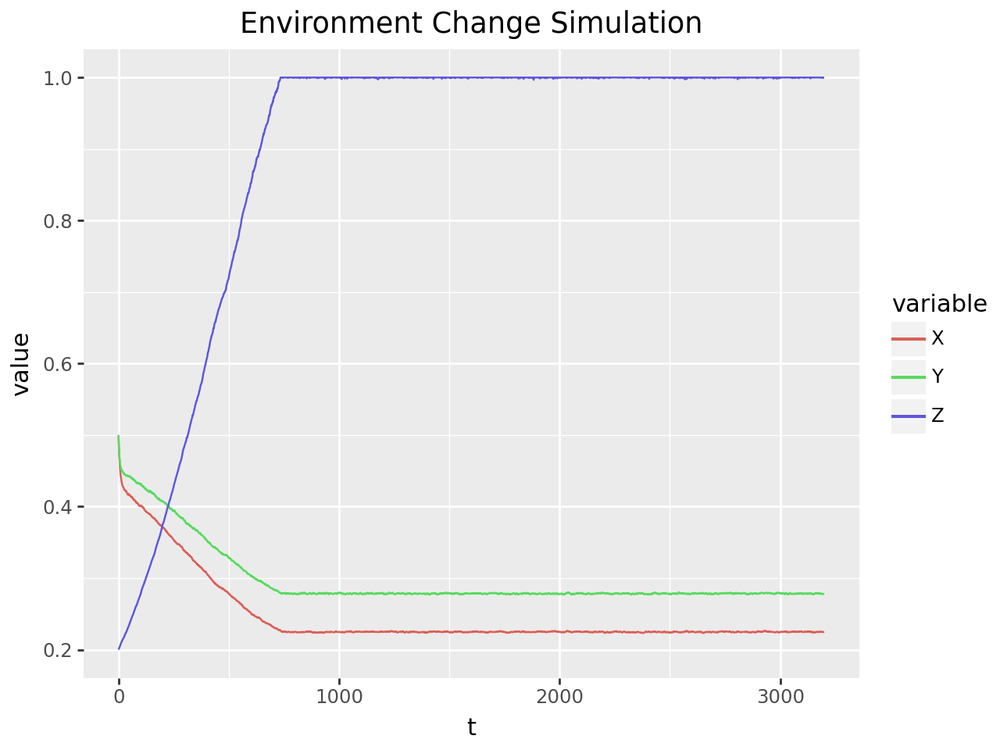

Salmon Final Population: 0.23
Lamprey Final Population: 0.28
Pinniped Final Population: 1.00

Salmon Mean Population: 0.25
Lamprey Mean Population: 0.30
Pinniped Mean Population: 0.90

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.22
Lamprey Min Population: 0.28
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.05

Salmon Population SD: 0.05
Lamprey Population SD: 0.04
Pinniped Population SD: 0.21





In [ ]:
simulate_single_param_change(n_timesteps, beta_range, "beta", plot_funcs=(True, False))

Beta: 0.020000001490116118


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


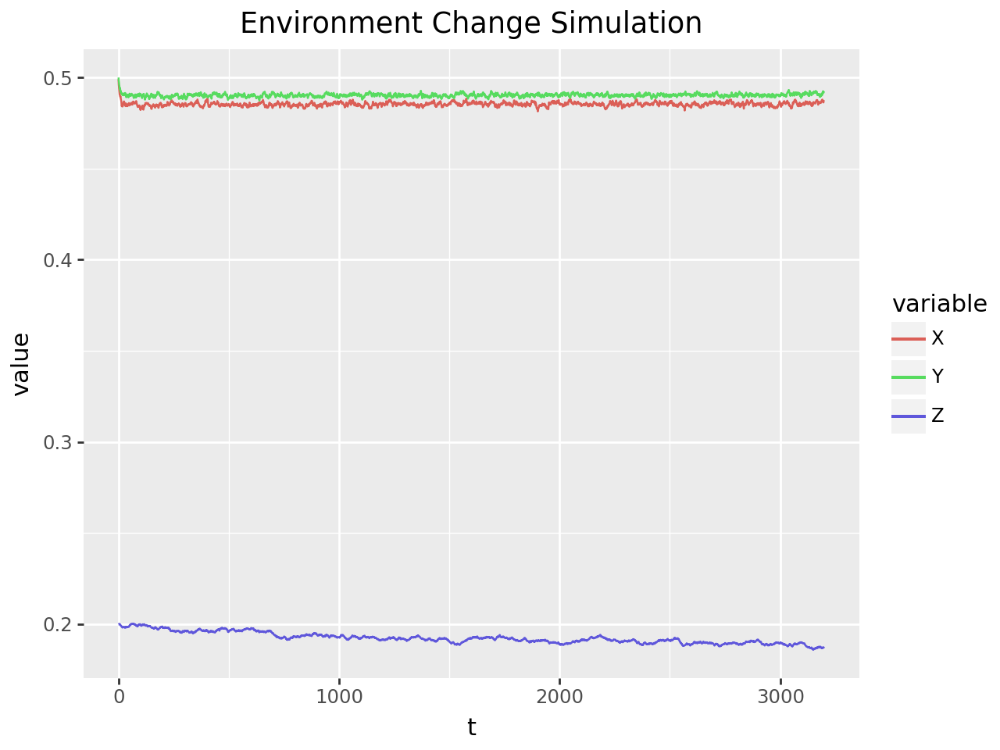

Salmon Final Population: 0.49
Lamprey Final Population: 0.49
Pinniped Final Population: 0.19

Salmon Mean Population: 0.49
Lamprey Mean Population: 0.49
Pinniped Mean Population: 0.19

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.20

Salmon Min Population: 0.48
Lamprey Min Population: 0.49
Pinniped Min Population: 0.19

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.00



Beta: 0.02250000149011612


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


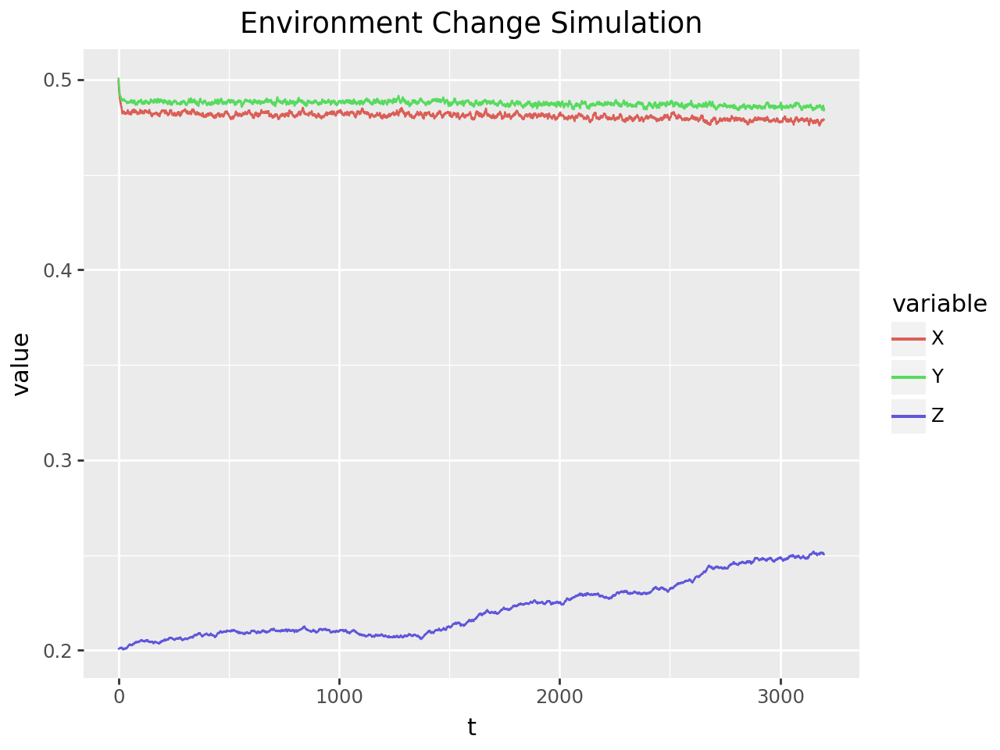

Salmon Final Population: 0.48
Lamprey Final Population: 0.49
Pinniped Final Population: 0.25

Salmon Mean Population: 0.48
Lamprey Mean Population: 0.49
Pinniped Mean Population: 0.22

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.25

Salmon Min Population: 0.48
Lamprey Min Population: 0.48
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.01



Beta: 0.025000001490116122


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


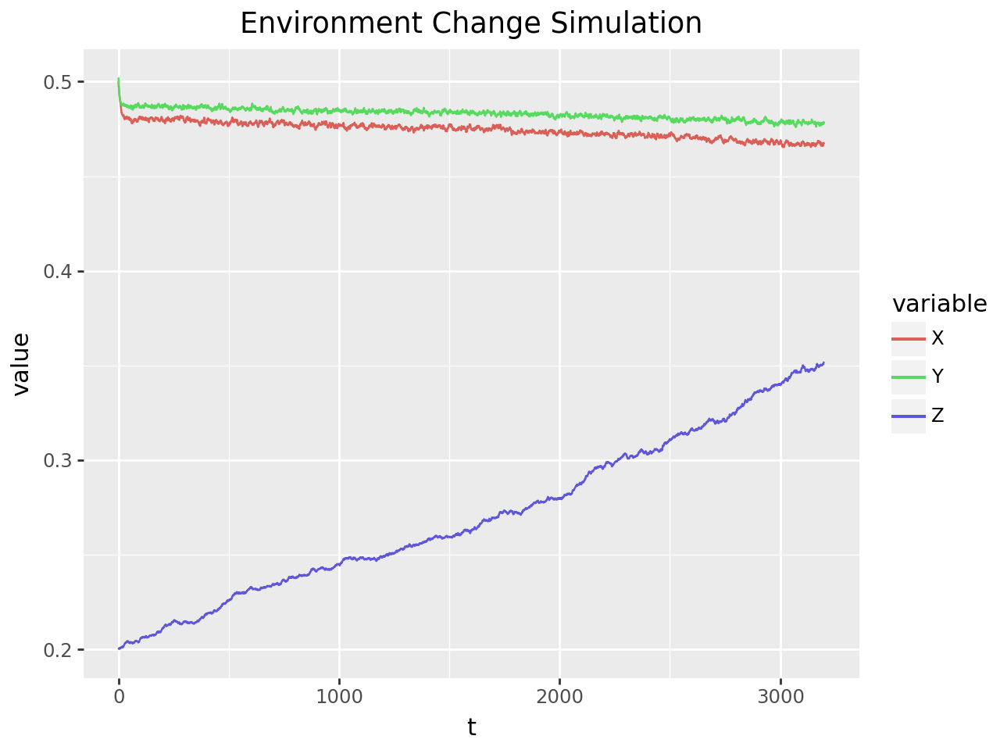

Salmon Final Population: 0.47
Lamprey Final Population: 0.48
Pinniped Final Population: 0.35

Salmon Mean Population: 0.47
Lamprey Mean Population: 0.48
Pinniped Mean Population: 0.27

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.35

Salmon Min Population: 0.47
Lamprey Min Population: 0.48
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.00

Salmon Population SD: 0.00
Lamprey Population SD: 0.00
Pinniped Population SD: 0.04



Beta: 0.027500001490116124


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


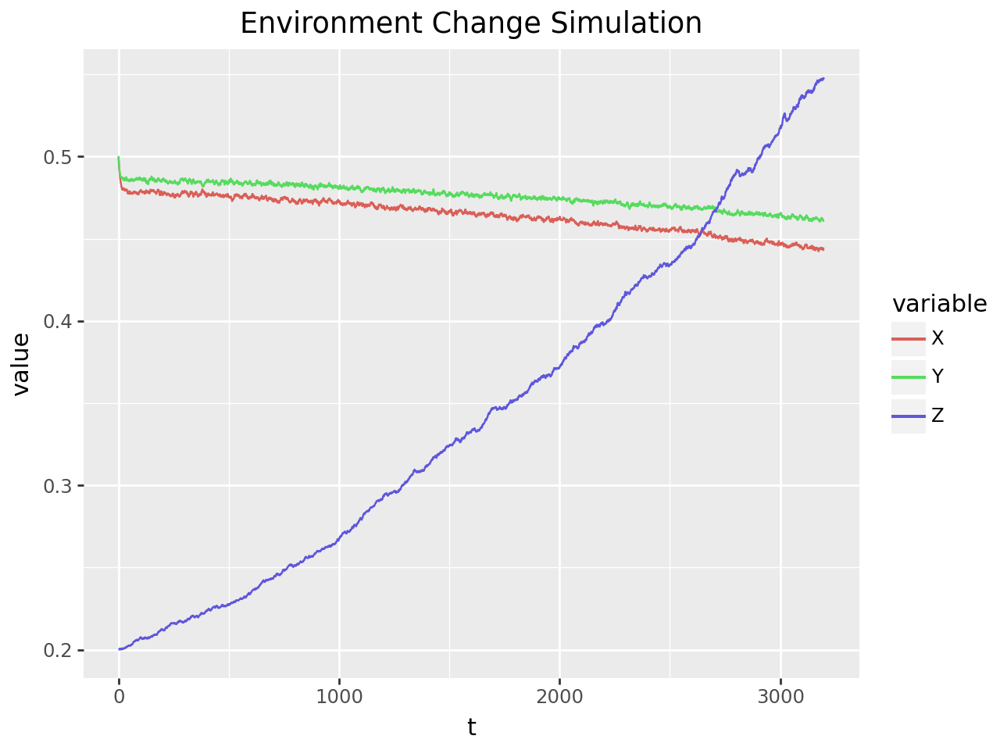

Salmon Final Population: 0.44
Lamprey Final Population: 0.46
Pinniped Final Population: 0.55

Salmon Mean Population: 0.46
Lamprey Mean Population: 0.48
Pinniped Mean Population: 0.34

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.55

Salmon Min Population: 0.44
Lamprey Min Population: 0.46
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.01

Salmon Population SD: 0.01
Lamprey Population SD: 0.01
Pinniped Population SD: 0.10



Beta: 0.030000001490116127


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


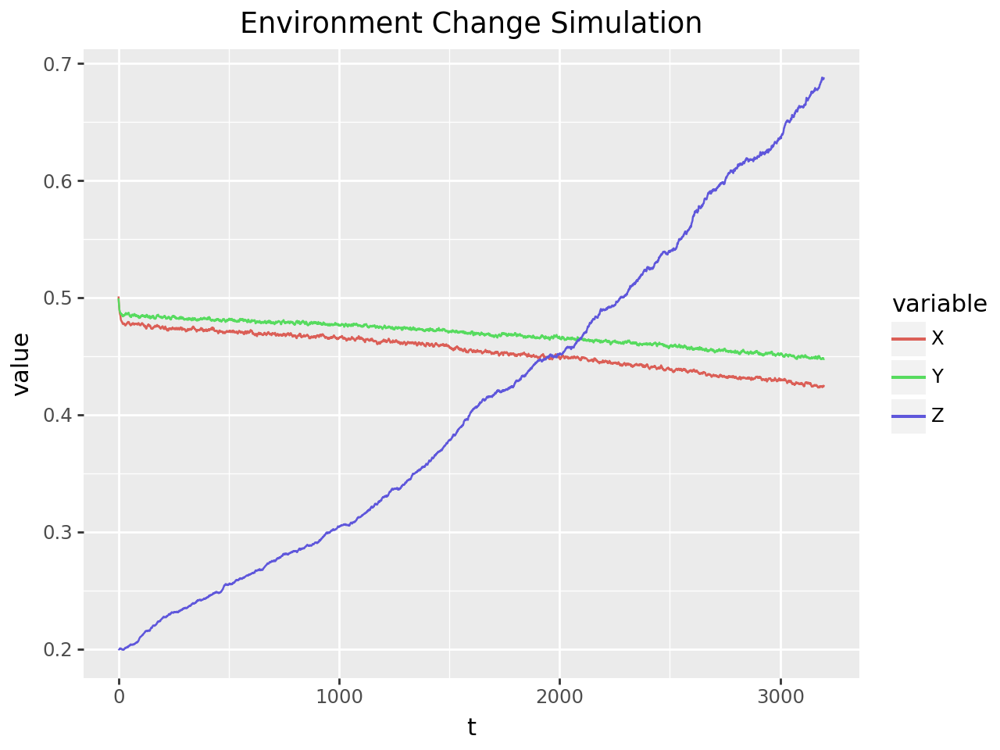

Salmon Final Population: 0.42
Lamprey Final Population: 0.45
Pinniped Final Population: 0.69

Salmon Mean Population: 0.45
Lamprey Mean Population: 0.47
Pinniped Mean Population: 0.41

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.69

Salmon Min Population: 0.42
Lamprey Min Population: 0.45
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.02

Salmon Population SD: 0.02
Lamprey Population SD: 0.01
Pinniped Population SD: 0.14



Beta: 0.03250000149011613


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


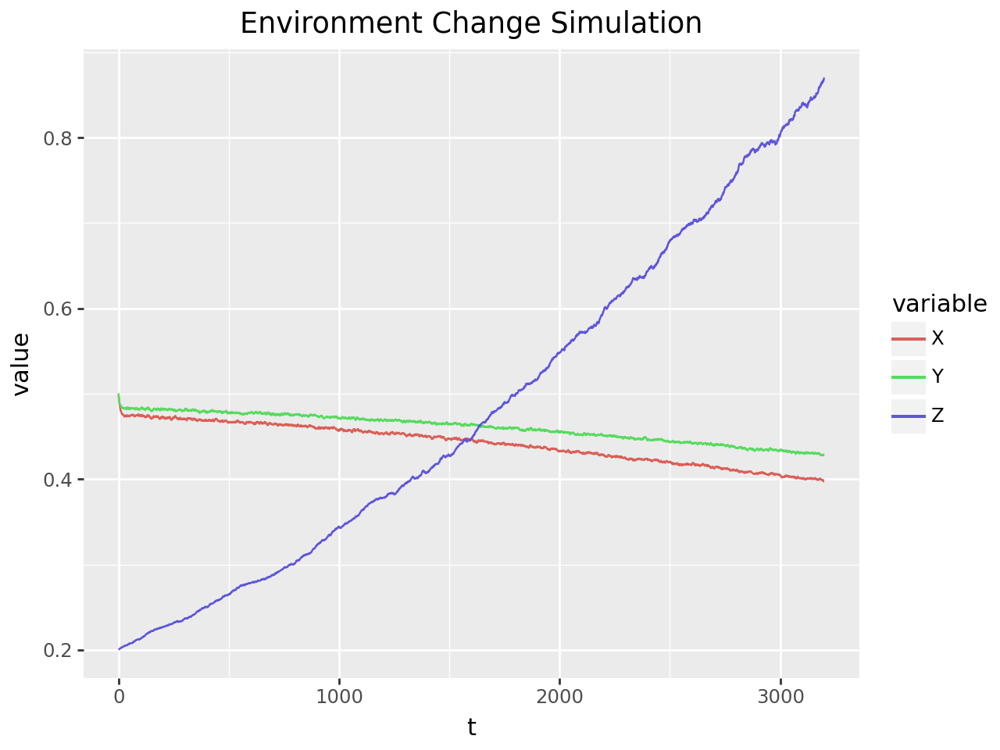

Salmon Final Population: 0.40
Lamprey Final Population: 0.43
Pinniped Final Population: 0.87

Salmon Mean Population: 0.44
Lamprey Mean Population: 0.46
Pinniped Mean Population: 0.48

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 0.87

Salmon Min Population: 0.40
Lamprey Min Population: 0.43
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.04

Salmon Population SD: 0.02
Lamprey Population SD: 0.02
Pinniped Population SD: 0.20



Beta: 0.03500000149011613


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


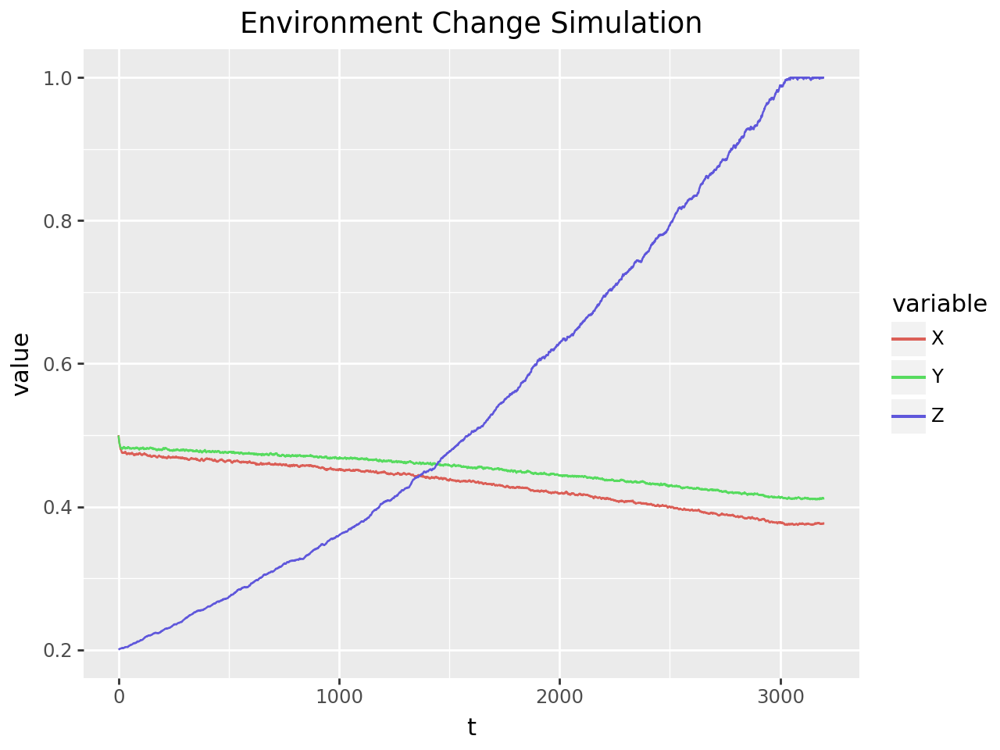

Salmon Final Population: 0.38
Lamprey Final Population: 0.41
Pinniped Final Population: 1.00

Salmon Mean Population: 0.43
Lamprey Mean Population: 0.45
Pinniped Mean Population: 0.55

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.37
Lamprey Min Population: 0.41
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.06

Salmon Population SD: 0.03
Lamprey Population SD: 0.02
Pinniped Population SD: 0.25



Beta: 0.03750000149011613


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


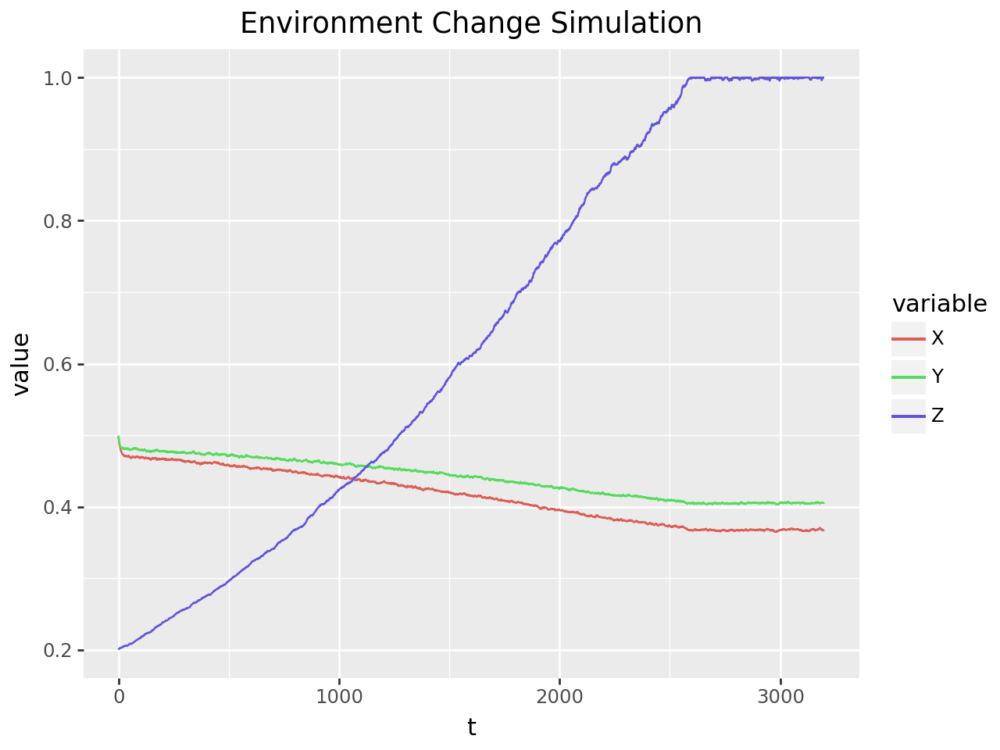

Salmon Final Population: 0.37
Lamprey Final Population: 0.41
Pinniped Final Population: 1.00

Salmon Mean Population: 0.41
Lamprey Mean Population: 0.44
Pinniped Mean Population: 0.63

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.36
Lamprey Min Population: 0.40
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.08

Salmon Population SD: 0.04
Lamprey Population SD: 0.03
Pinniped Population SD: 0.28



Beta: 0.040000001490116135


<ipython-input-8-d3d947aa5de0>:31: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`


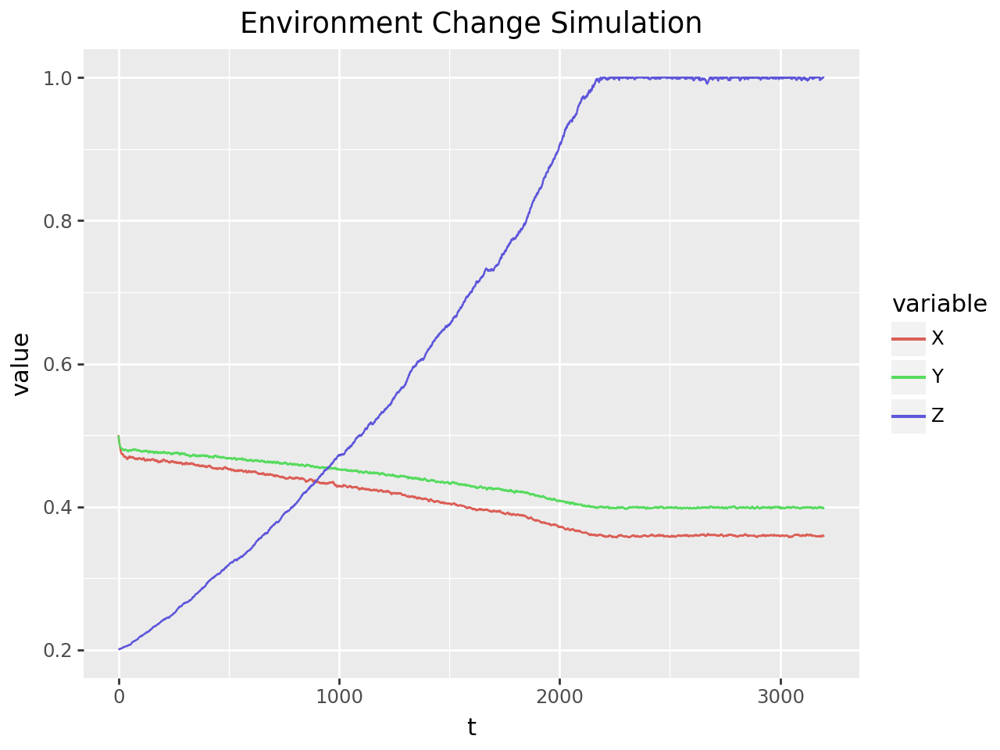

Salmon Final Population: 0.36
Lamprey Final Population: 0.40
Pinniped Final Population: 1.00

Salmon Mean Population: 0.40
Lamprey Mean Population: 0.43
Pinniped Mean Population: 0.68

Salmon Max Population: 0.50
Lamprey Max Population: 0.50
Pinniped Max Population: 1.00

Salmon Min Population: 0.36
Lamprey Min Population: 0.40
Pinniped Min Population: 0.20

Salmon Population Variance: 0.00
Lamprey Population Variance: 0.00
Pinniped Population Variance: 0.08

Salmon Population SD: 0.04
Lamprey Population SD: 0.03
Pinniped Population SD: 0.29





In [ ]:
closer_beta_range = np.arange(-0.08, -0.06, 0.0025)
simulate_single_param_change(n_timesteps, closer_beta_range, "beta", plot_funcs=(True, False))